In [1]:
#Common variables:

models = [
    "DNABERT-2",
    "GPN",
    "GROVER",
    "NT500M",
    "NT2.5B-MS",
    "NT2.5B-1K",
    "DNABERT-S",
    "GenaLM",
    "Hyena-1k",
    "Hyena-16k",
    "Hyena-32k",
    "Hyena-160k",
    "Hyena-450k",
    "Hyena-1m",
]

types = ["Coding", "Non-coding"]
numMutations = 100  # Number of mutations for a specific value of x
fractions = ["25", "50", "75", "100"]

# Data aggregation section
This is just to get the data stored in json files and put them in a single dataframe instead. 

To find:
1. compositions in the og sequence - atcg
2. find the change in composition, how many transitions (purines-purines/pyrimidines-pyrimidines)/transversions (cross); (AG) are purines and (TC) are pyrimidines
   do in dictionary form; A->T how many mutations and so on

In [2]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import time
import json
import os
import seaborn as sns
from pathlib import Path

models = [
    "DNABERT-2",
    "GPN",
    "GROVER",
    "NT500M",
    "NT2.5B-MS",
    "NT2.5B-1K",
    "DNABERT-S",
    "GenaLM",
    "Hyena-1k",
    "Hyena-16k",
    "Hyena-32k",
    "Hyena-160k",
    "Hyena-450k",
    "Hyena-1m",
]

types = ["Coding", "Non-coding"]
numMutations = 100  # Number of mutations for a specific value of x
fractions = ["25", "50", "75", "100"]

In [3]:
def getMutTypeNumber(og, mut):
    purines = ["A", "G"]
    pyrimidines = ["T", "C"]
    transitions, transversions = 0, 0
    for o, m in zip(og, mut):
        if o != m:  # Mutation detected
            if (o in purines and m in purines) or (o in pyrimidines and m in pyrimidines):
                transitions += 1
            else:
                transversions += 1
    return transitions, transversions

In [4]:
data = []
columns = ["model", "sequence_type", "fraction", "seqLen", "mut_percentage", "old_A_count", "old_T_count", "old_C_count", "old_G_count", "new_A_count", "new_T_count", "new_C_count", "new_G_count", "Transitions", "Transversions", "Cosine", "Euclidean"]
  
for model in models:
    for seqType in types: 
        print('Now doing: ', model, seqType)
        for fraction in fractions:
            if (model == "Hyena-1m" or model == "GenaLM") and fraction in ["75", "100"]:
                continue  # Since these give errors.
            
            mainPath = f"{seqType}/{model}/{fraction}"
            distancesDirectory = f"Results/Distances/{mainPath}"
            ogSeqDirectory = (
                    f"Sequences/Original Sequences/{mainPath}"
                    if model[:2] != "NT"
                    else f"Sequences/Original Sequences/{seqType}/NT/{fraction}"
                )
            mutSeqDirectory = (
                    f"./Mutated Sequences/{mainPath}"
                    if model[:2] != "NT"
                    else f"Sequences/Mutated Sequences/{seqType}/NT/{fraction}"
                )

            ogSequence = ""
            for filename in Path(ogSeqDirectory).glob("*.txt"):

                with open(filename, "r+") as f:
                    ogSequence = f.read()

                old_A = ogSequence.count('A')
                old_T = ogSequence.count('T')
                old_C = ogSequence.count('C')
                old_G = ogSequence.count('G')
                seqLen = len(ogSequence)

            for filename in Path(mutSeqDirectory).glob("*.txt"):
                mut_percentage = str(filename).split("_")[-1].rstrip(".txt")

                with open(filename, "r+") as f:
                    sequences = eval(f.read())
                    # Since all the 100 mutations of a specific x value are stored in the form of a list in their respective text files.

                with open(f"{distancesDirectory}/distances.json", "r+") as f:
                    allDistances = json.load(f)
                
                distances = allDistances[mut_percentage]

                for i, mutSequence in enumerate(sequences):
                    new_A = mutSequence.count('A')
                    new_T = mutSequence.count('T')
                    new_C = mutSequence.count('C')
                    new_G = mutSequence.count('G')
                    
                    cosineDist = distances["cosine"][i]
                    euclideanDist = distances["euclidean"][i]
                    transitions, transversions = getMutTypeNumber(ogSequence, mutSequence)

                    data.append([model, seqType, fraction, seqLen, mut_percentage, old_A, new_A, old_T, new_T, old_C, new_C, old_G, new_G, transitions, transversions, cosineDist, euclideanDist])

df = pd.DataFrame(data, columns=columns)
df.to_csv("./seqStats.csv", index=False)

Now doing:  DNABERT-2 Coding
Now doing:  DNABERT-2 Non-coding
Now doing:  GPN Coding
Now doing:  GPN Non-coding
Now doing:  GROVER Coding
Now doing:  GROVER Non-coding
Now doing:  NT500M Coding
Now doing:  NT500M Non-coding
Now doing:  NT2.5B-MS Coding
Now doing:  NT2.5B-MS Non-coding
Now doing:  NT2.5B-1K Coding
Now doing:  NT2.5B-1K Non-coding
Now doing:  DNABERT-S Coding
Now doing:  DNABERT-S Non-coding
Now doing:  GenaLM Coding
Now doing:  GenaLM Non-coding
Now doing:  Hyena-1k Coding
Now doing:  Hyena-1k Non-coding
Now doing:  Hyena-16k Coding
Now doing:  Hyena-16k Non-coding
Now doing:  Hyena-32k Coding
Now doing:  Hyena-32k Non-coding
Now doing:  Hyena-160k Coding
Now doing:  Hyena-160k Non-coding
Now doing:  Hyena-450k Coding
Now doing:  Hyena-450k Non-coding
Now doing:  Hyena-1m Coding
Now doing:  Hyena-1m Non-coding


# Coding vs Non-Coding Boxplots
Boxplots of the cosine and euclidean distances of mutated sequences' embeddings (100 for each mutation percentage) based on the input sequence length according to the model's context window.

## One input sequence per model:

In [5]:
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt

df = pd.read_csv('Sequences/seqStats.csv')

In [6]:
def boxPlotter(df):
    for model in models:

        print(f"\nPlots for model: {model}\n")

        cosineFig, cosineAxs = plt.subplots(2, 2, figsize=(16, 10))
        euclideanFig, euclideanAxs = plt.subplots(2, 2, figsize=(16, 10))

        cosineFig.suptitle(
            f"Comparison of Cosine Distances for Coding and Non-coding Sequences\nModel: {model}."
        )
        euclideanFig.suptitle(
            f"Comparison of Euclidean Distances for Coding and Non-coding Sequences\nModel: {model}."
        )

        for i, fraction in enumerate(fractions):
            if (model == "Hyena-1m" or model == "GenaLM") and fraction in ["75", "100"]:
                continue  
            
            ax_x, ax_y = i // 2, i % 2

            modelDf = df[(df["model"] == model) & (df["fraction"] == int(fraction))].copy()
            modelDf["mut_percentage"] = modelDf["mut_percentage"].astype(int)
            modelDf = modelDf.sort_values(by = "mut_percentage")

            cosineAxs[ax_x, ax_y].set_xlabel("Mutation Percentage")
            cosineAxs[ax_x, ax_y].set_ylabel("Cosine Distance")
            
            sns.boxplot(
                x="mut_percentage",
                y="Cosine",
                hue="sequence_type",
                data=modelDf.iloc[:, [1, 4, 15]],
                palette="Set2",
                ax=cosineAxs[ax_x, ax_y]
            )
            cosineAxs[ax_x, ax_y].set_title(f'{fraction}% of context window')

            euclideanAxs[ax_x, ax_y].set_xlabel("Mutation Percentage")
            euclideanAxs[ax_x, ax_y].set_ylabel("Euclidean Distance")

            sns.boxplot(
                x="mut_percentage",
                y="Euclidean",
                hue="sequence_type",
                data=modelDf.iloc[:, [1, 4, 16]],
                palette="Set2",
                ax=euclideanAxs[ax_x, ax_y]
            )
            euclideanAxs[ax_x, ax_y].set_title(f'{fraction}% of context window')

            plt.legend(title="Sequence Type")
            
        plt.show()


Plots for model: DNABERT-2



C:\Users\Ruhaib\AppData\Local\Temp\ipykernel_5584\1810704521.py:52: UserWarning: No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
  plt.legend(title="Sequence Type")
C:\Users\Ruhaib\AppData\Local\Temp\ipykernel_5584\1810704521.py:52: UserWarning: No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
  plt.legend(title="Sequence Type")
C:\Users\Ruhaib\AppData\Local\Temp\ipykernel_5584\1810704521.py:52: UserWarning: No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
  plt.legend(title="Sequence Type")


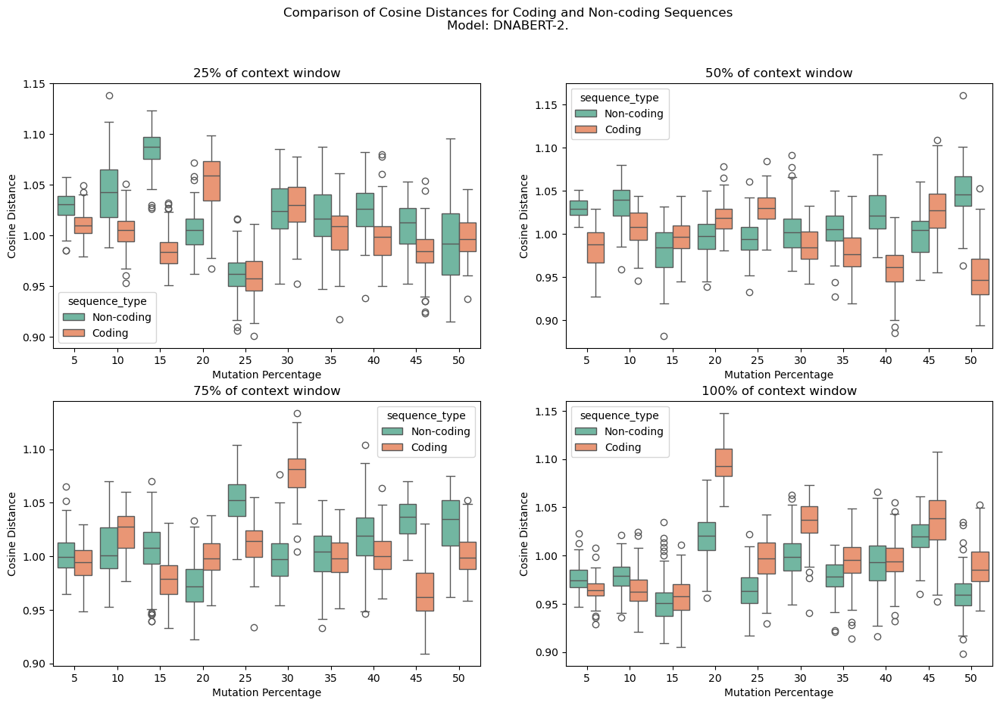

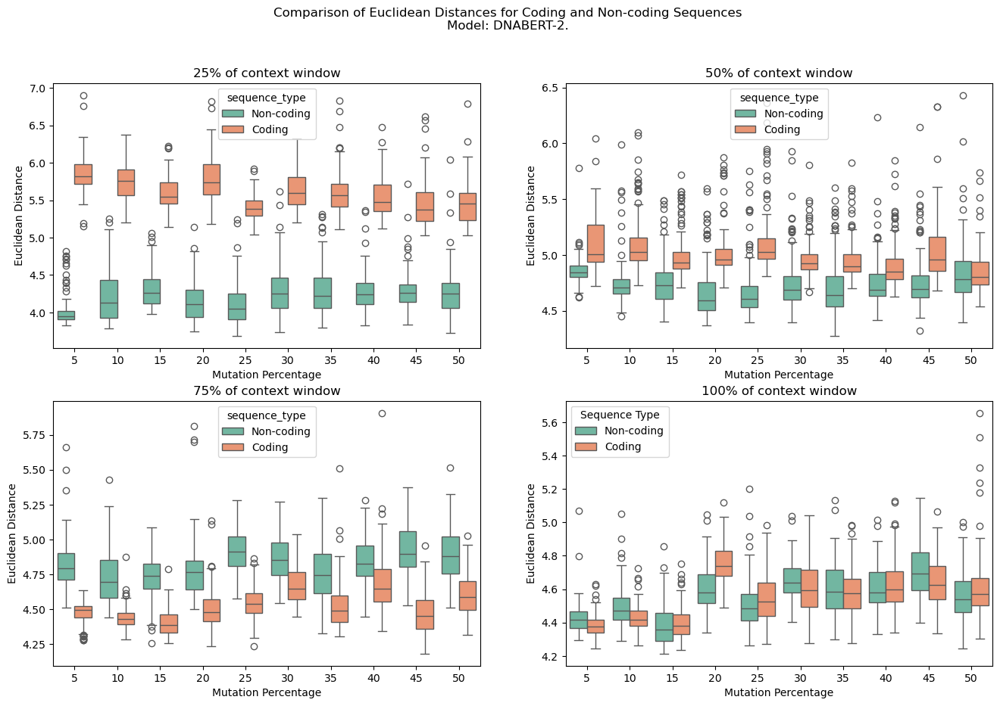


Plots for model: GPN



C:\Users\Ruhaib\AppData\Local\Temp\ipykernel_5584\1810704521.py:52: UserWarning: No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
  plt.legend(title="Sequence Type")
C:\Users\Ruhaib\AppData\Local\Temp\ipykernel_5584\1810704521.py:52: UserWarning: No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
  plt.legend(title="Sequence Type")
C:\Users\Ruhaib\AppData\Local\Temp\ipykernel_5584\1810704521.py:52: UserWarning: No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
  plt.legend(title="Sequence Type")


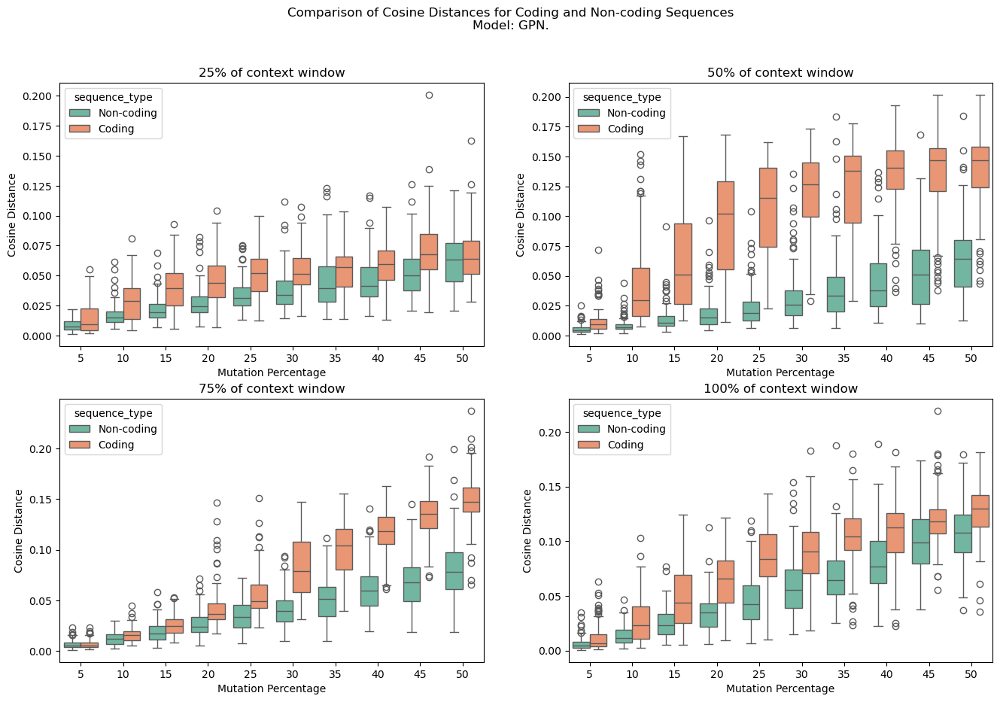

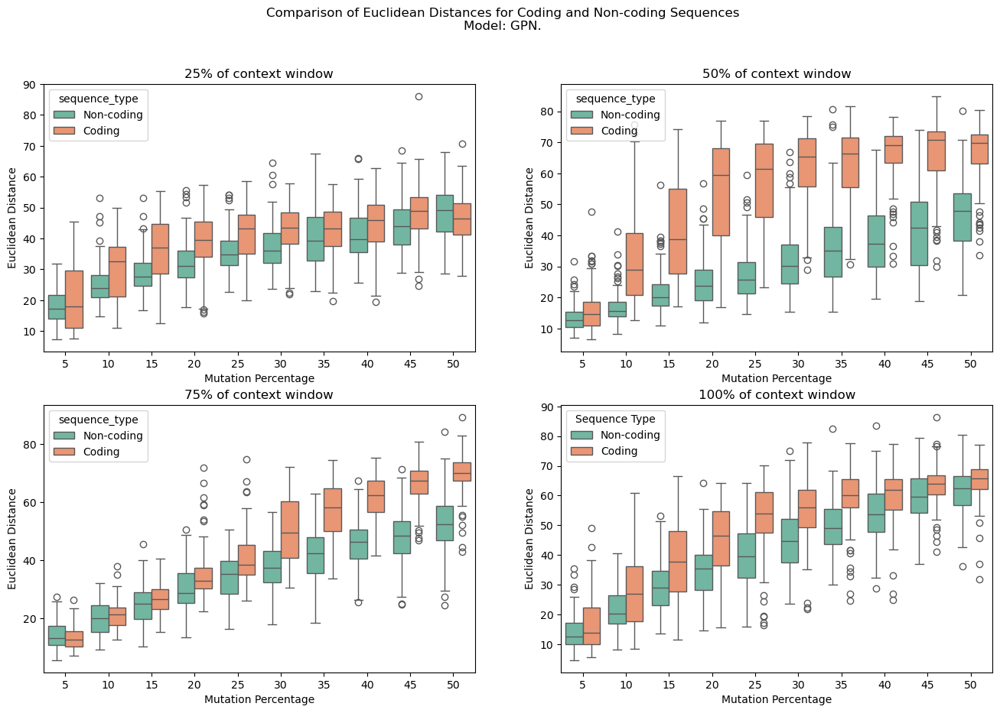


Plots for model: GROVER



C:\Users\Ruhaib\AppData\Local\Temp\ipykernel_5584\1810704521.py:52: UserWarning: No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
  plt.legend(title="Sequence Type")
C:\Users\Ruhaib\AppData\Local\Temp\ipykernel_5584\1810704521.py:52: UserWarning: No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
  plt.legend(title="Sequence Type")
C:\Users\Ruhaib\AppData\Local\Temp\ipykernel_5584\1810704521.py:52: UserWarning: No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
  plt.legend(title="Sequence Type")


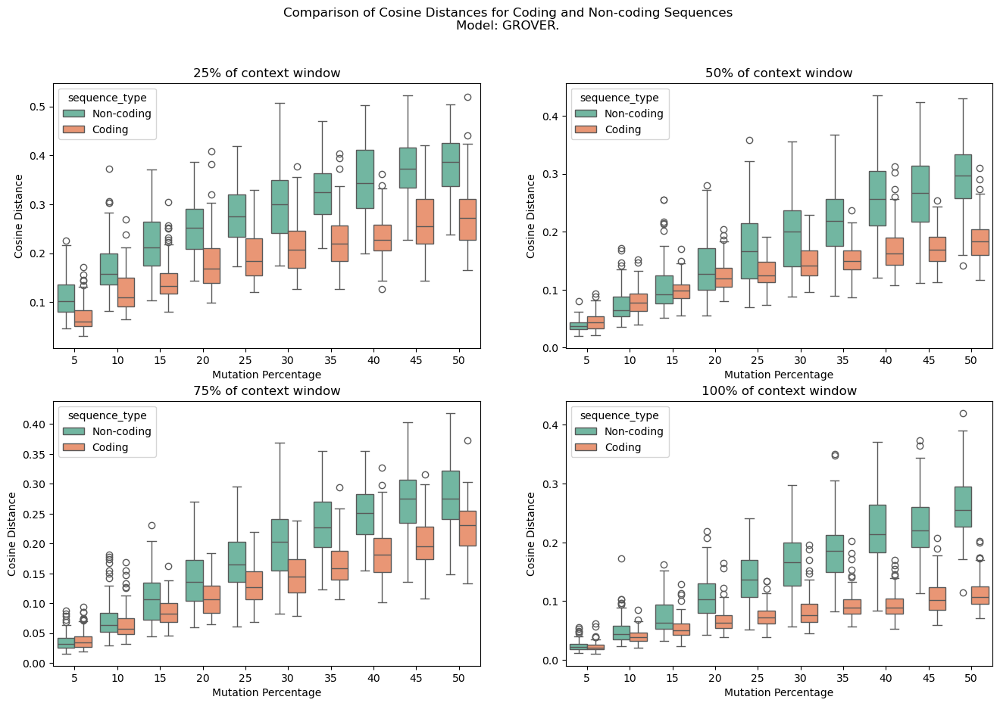

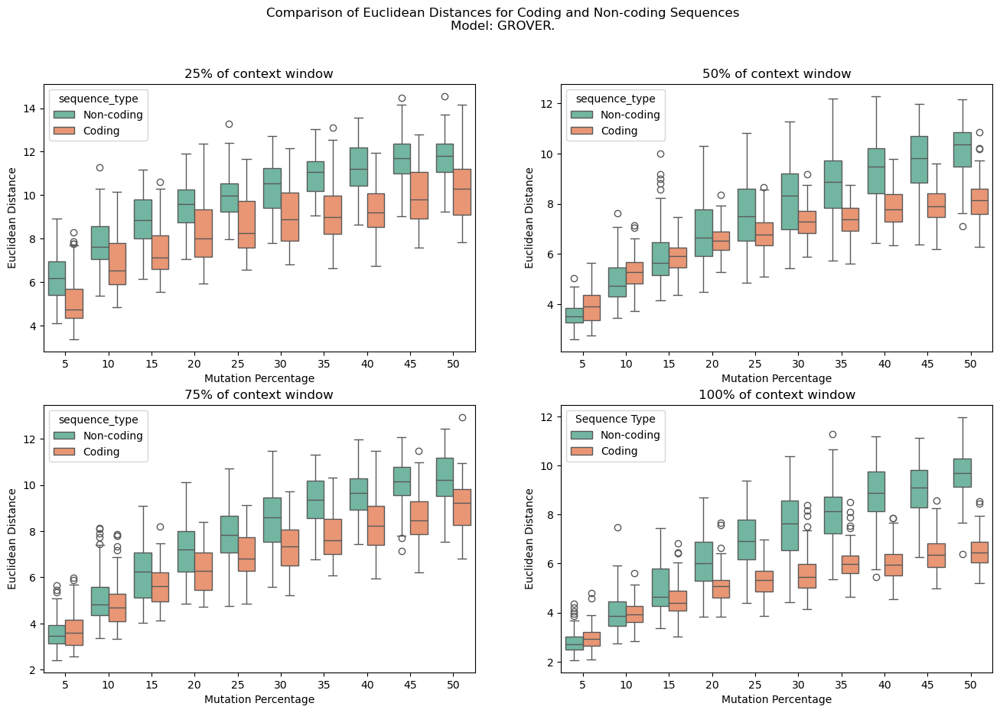


Plots for model: NT500M



C:\Users\Ruhaib\AppData\Local\Temp\ipykernel_5584\1810704521.py:52: UserWarning: No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
  plt.legend(title="Sequence Type")
C:\Users\Ruhaib\AppData\Local\Temp\ipykernel_5584\1810704521.py:52: UserWarning: No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
  plt.legend(title="Sequence Type")
C:\Users\Ruhaib\AppData\Local\Temp\ipykernel_5584\1810704521.py:52: UserWarning: No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
  plt.legend(title="Sequence Type")


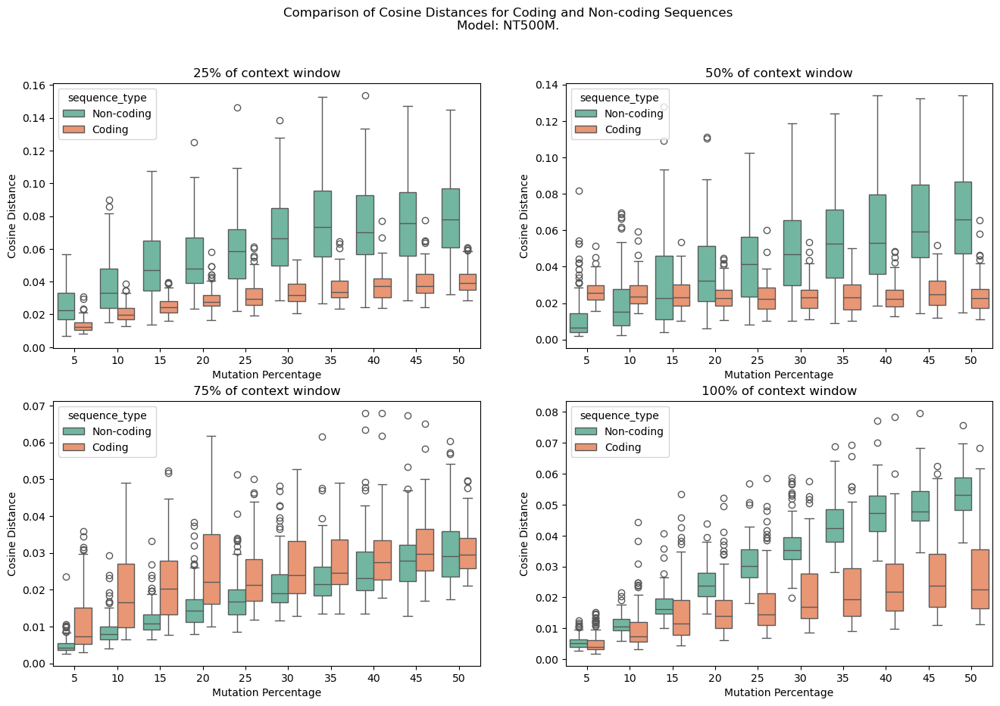

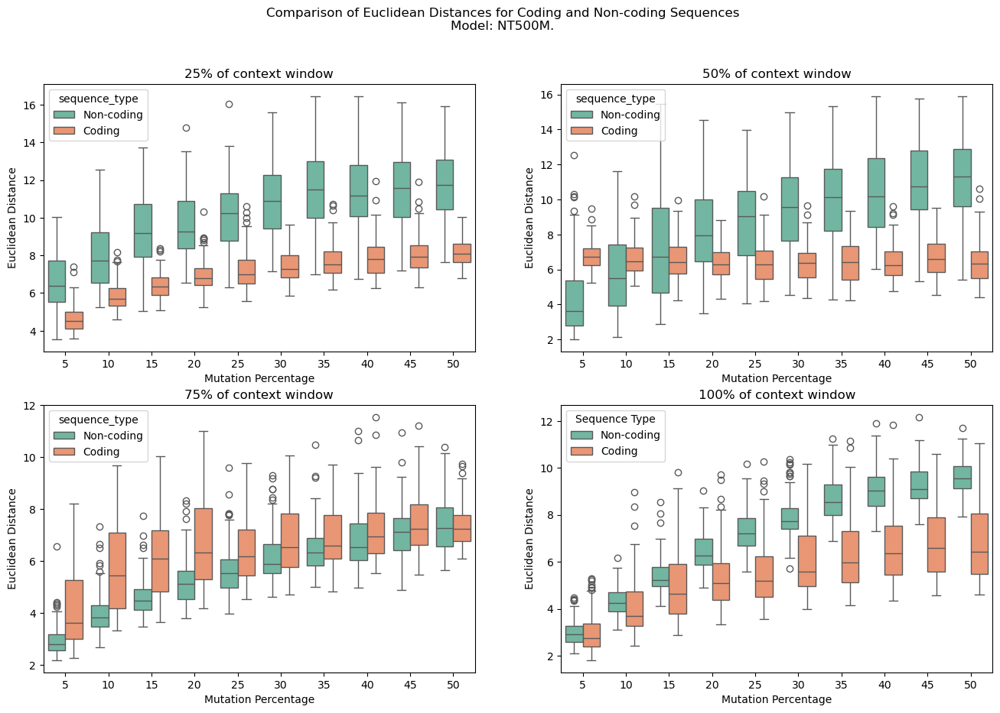


Plots for model: NT2.5B-MS



C:\Users\Ruhaib\AppData\Local\Temp\ipykernel_5584\1810704521.py:52: UserWarning: No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
  plt.legend(title="Sequence Type")
C:\Users\Ruhaib\AppData\Local\Temp\ipykernel_5584\1810704521.py:52: UserWarning: No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
  plt.legend(title="Sequence Type")
C:\Users\Ruhaib\AppData\Local\Temp\ipykernel_5584\1810704521.py:52: UserWarning: No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
  plt.legend(title="Sequence Type")


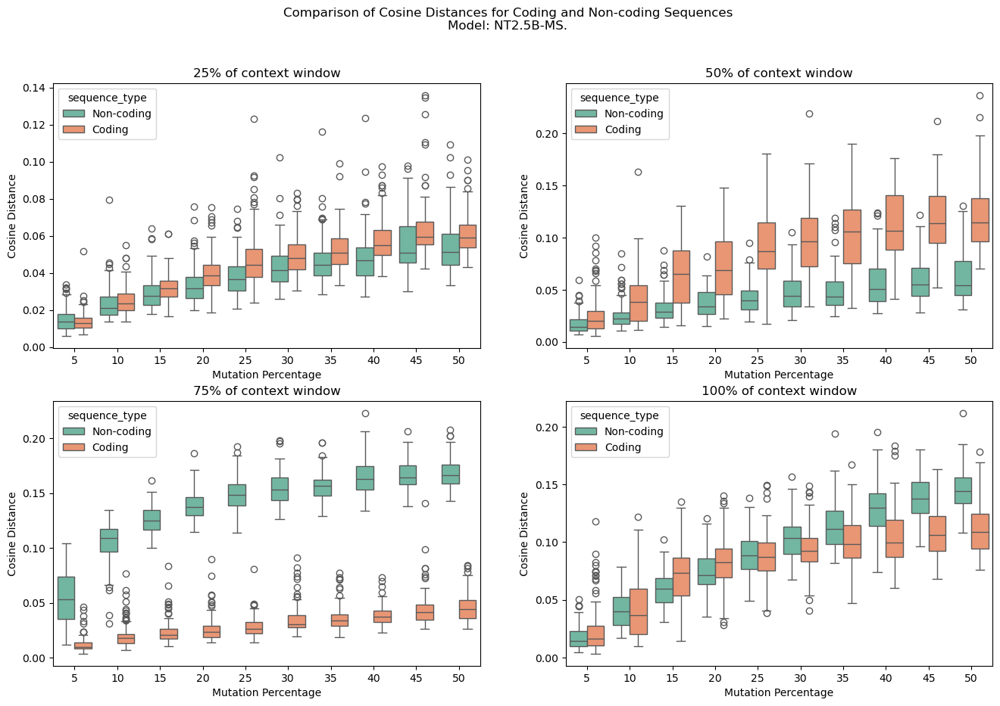

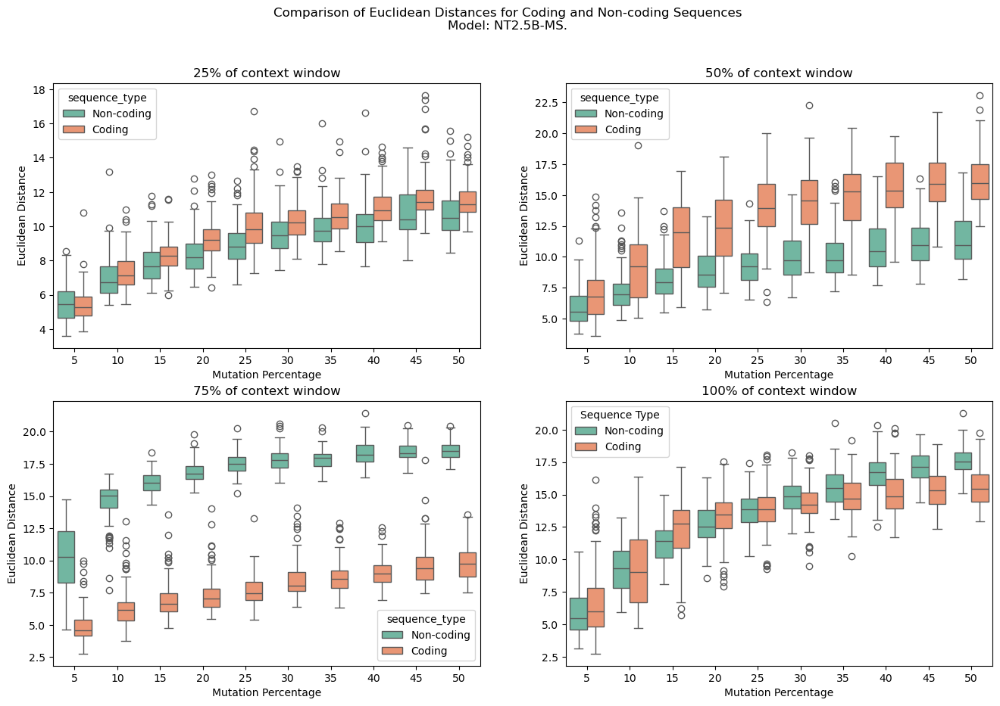


Plots for model: NT2.5B-1K



C:\Users\Ruhaib\AppData\Local\Temp\ipykernel_5584\1810704521.py:52: UserWarning: No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
  plt.legend(title="Sequence Type")
C:\Users\Ruhaib\AppData\Local\Temp\ipykernel_5584\1810704521.py:52: UserWarning: No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
  plt.legend(title="Sequence Type")
C:\Users\Ruhaib\AppData\Local\Temp\ipykernel_5584\1810704521.py:52: UserWarning: No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
  plt.legend(title="Sequence Type")


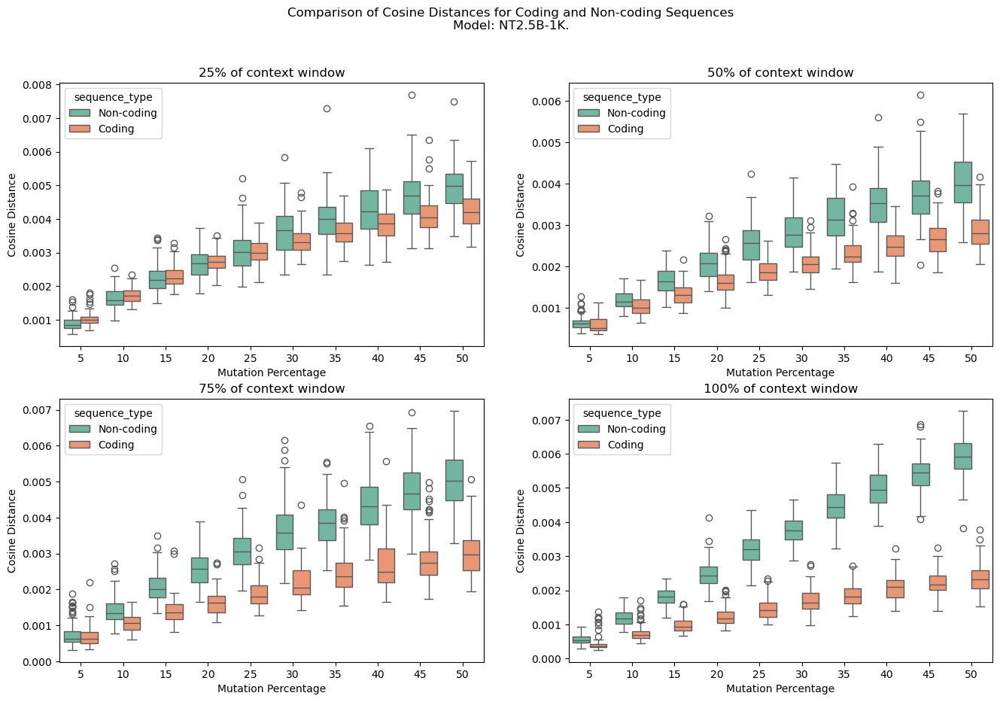

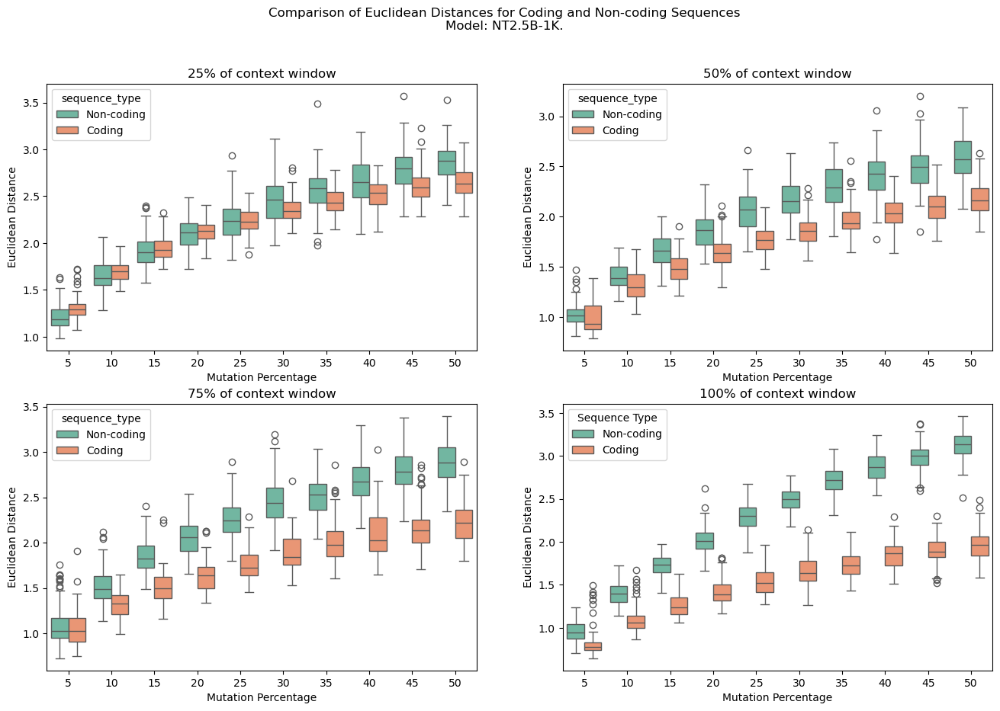


Plots for model: DNABERT-S



C:\Users\Ruhaib\AppData\Local\Temp\ipykernel_5584\1810704521.py:52: UserWarning: No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
  plt.legend(title="Sequence Type")
C:\Users\Ruhaib\AppData\Local\Temp\ipykernel_5584\1810704521.py:52: UserWarning: No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
  plt.legend(title="Sequence Type")
C:\Users\Ruhaib\AppData\Local\Temp\ipykernel_5584\1810704521.py:52: UserWarning: No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
  plt.legend(title="Sequence Type")


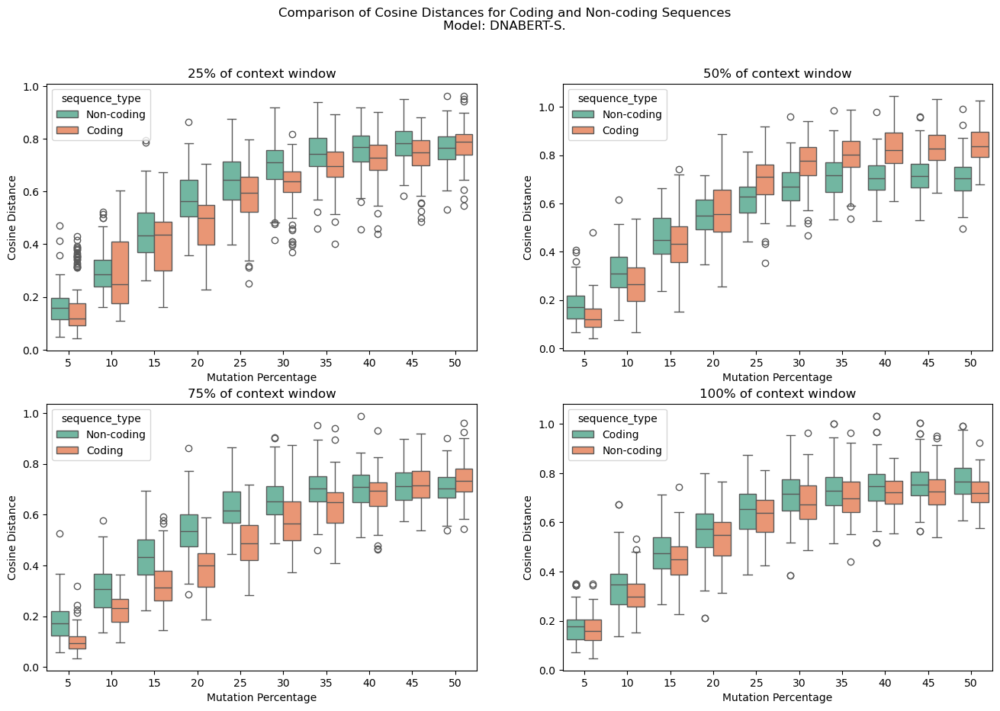

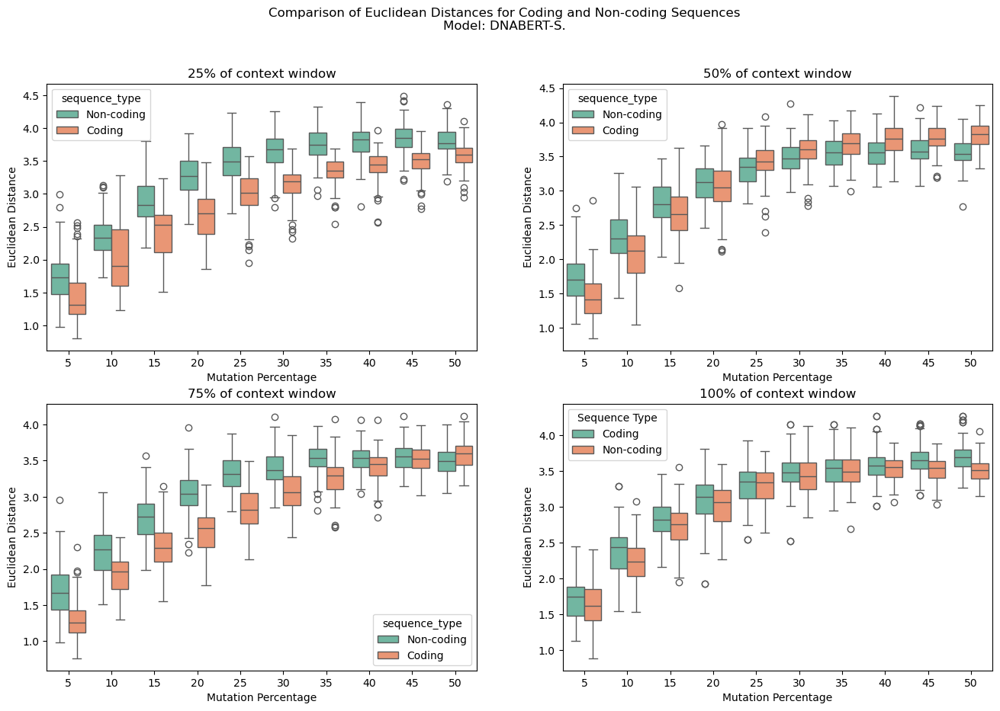


Plots for model: GenaLM



C:\Users\Ruhaib\AppData\Local\Temp\ipykernel_5584\1810704521.py:52: UserWarning: No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
  plt.legend(title="Sequence Type")
C:\Users\Ruhaib\AppData\Local\Temp\ipykernel_5584\1810704521.py:52: UserWarning: No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
  plt.legend(title="Sequence Type")


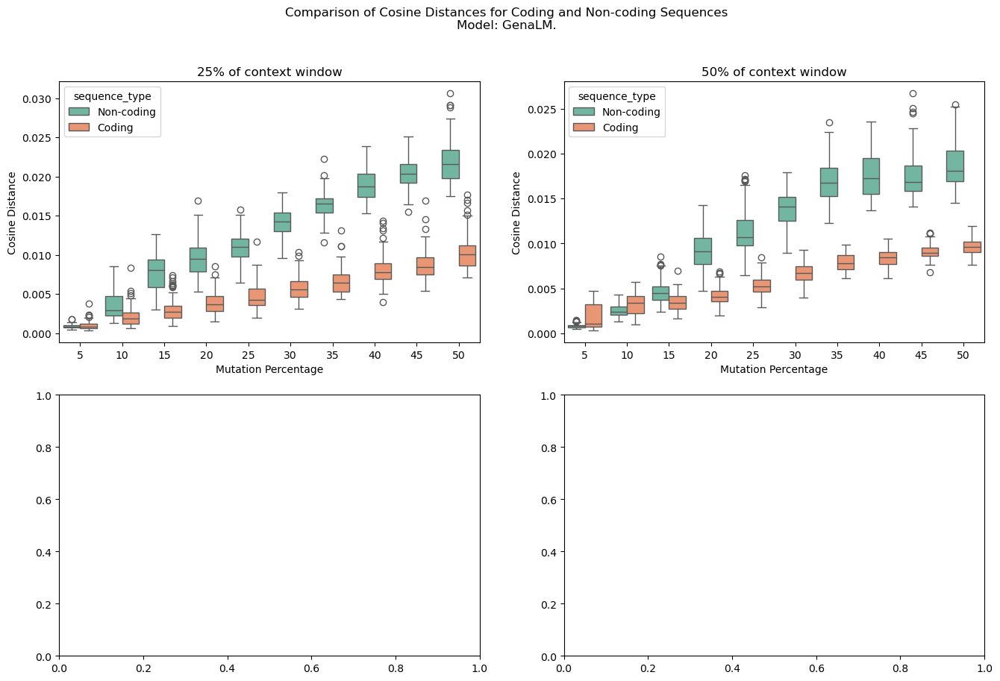

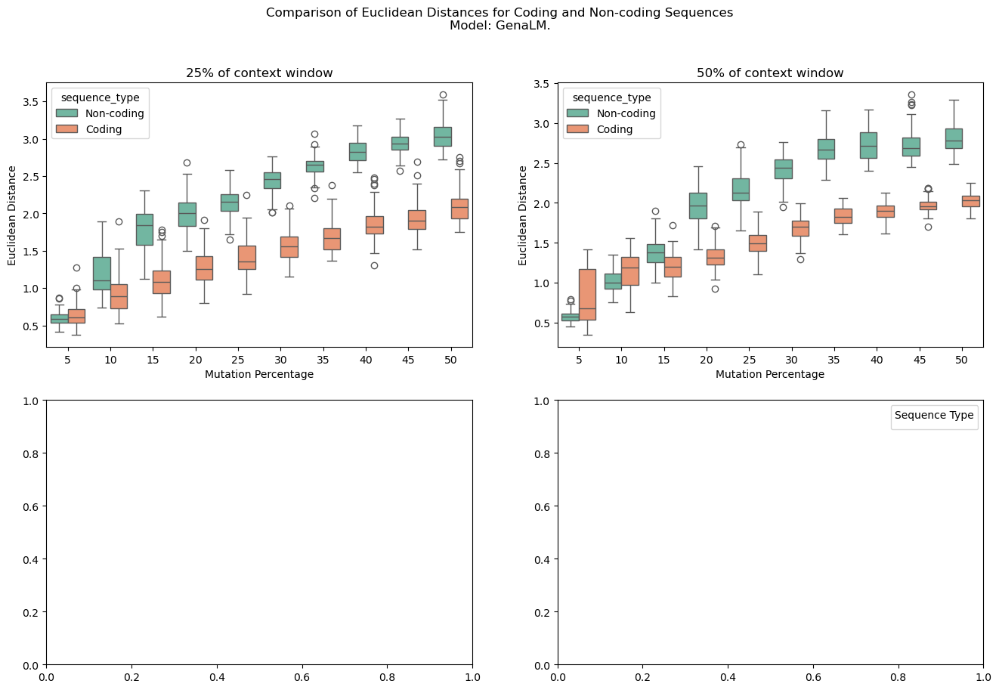


Plots for model: Hyena-1k



C:\Users\Ruhaib\AppData\Local\Temp\ipykernel_5584\1810704521.py:52: UserWarning: No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
  plt.legend(title="Sequence Type")
C:\Users\Ruhaib\AppData\Local\Temp\ipykernel_5584\1810704521.py:52: UserWarning: No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
  plt.legend(title="Sequence Type")
C:\Users\Ruhaib\AppData\Local\Temp\ipykernel_5584\1810704521.py:52: UserWarning: No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
  plt.legend(title="Sequence Type")


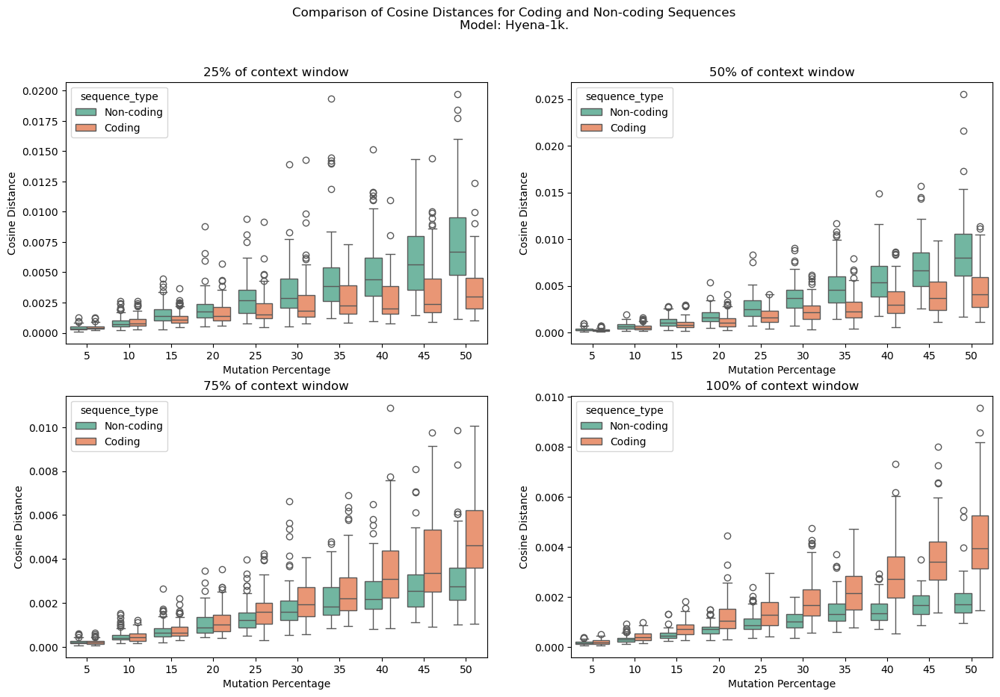

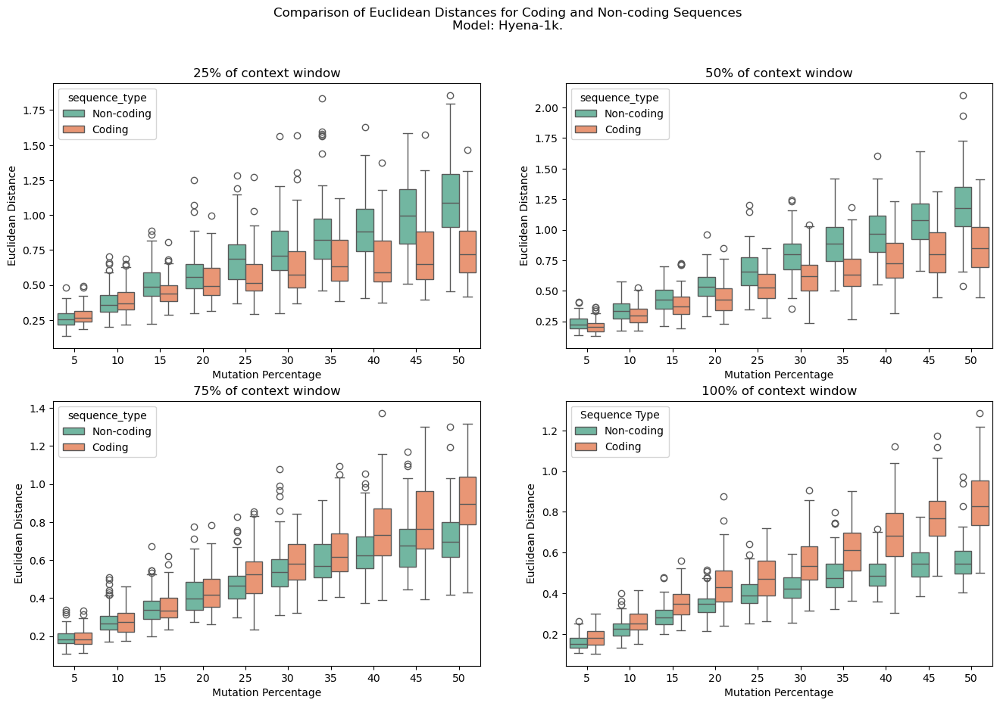


Plots for model: Hyena-16k



C:\Users\Ruhaib\AppData\Local\Temp\ipykernel_5584\1810704521.py:52: UserWarning: No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
  plt.legend(title="Sequence Type")
C:\Users\Ruhaib\AppData\Local\Temp\ipykernel_5584\1810704521.py:52: UserWarning: No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
  plt.legend(title="Sequence Type")
C:\Users\Ruhaib\AppData\Local\Temp\ipykernel_5584\1810704521.py:52: UserWarning: No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
  plt.legend(title="Sequence Type")


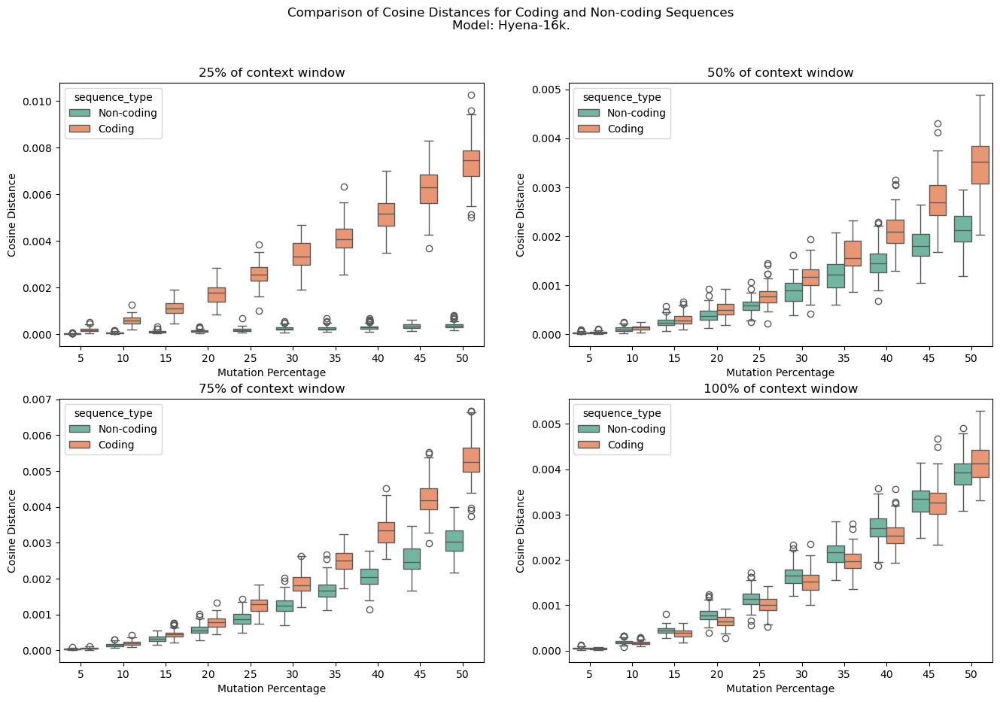

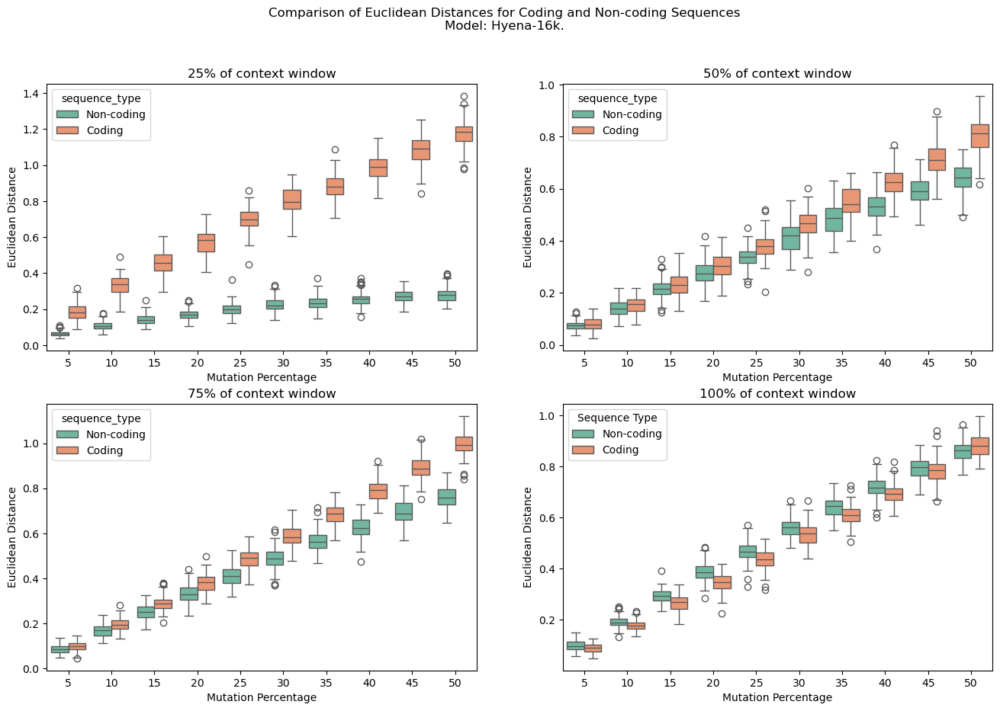


Plots for model: Hyena-32k



C:\Users\Ruhaib\AppData\Local\Temp\ipykernel_5584\1810704521.py:52: UserWarning: No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
  plt.legend(title="Sequence Type")
C:\Users\Ruhaib\AppData\Local\Temp\ipykernel_5584\1810704521.py:52: UserWarning: No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
  plt.legend(title="Sequence Type")
C:\Users\Ruhaib\AppData\Local\Temp\ipykernel_5584\1810704521.py:52: UserWarning: No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
  plt.legend(title="Sequence Type")


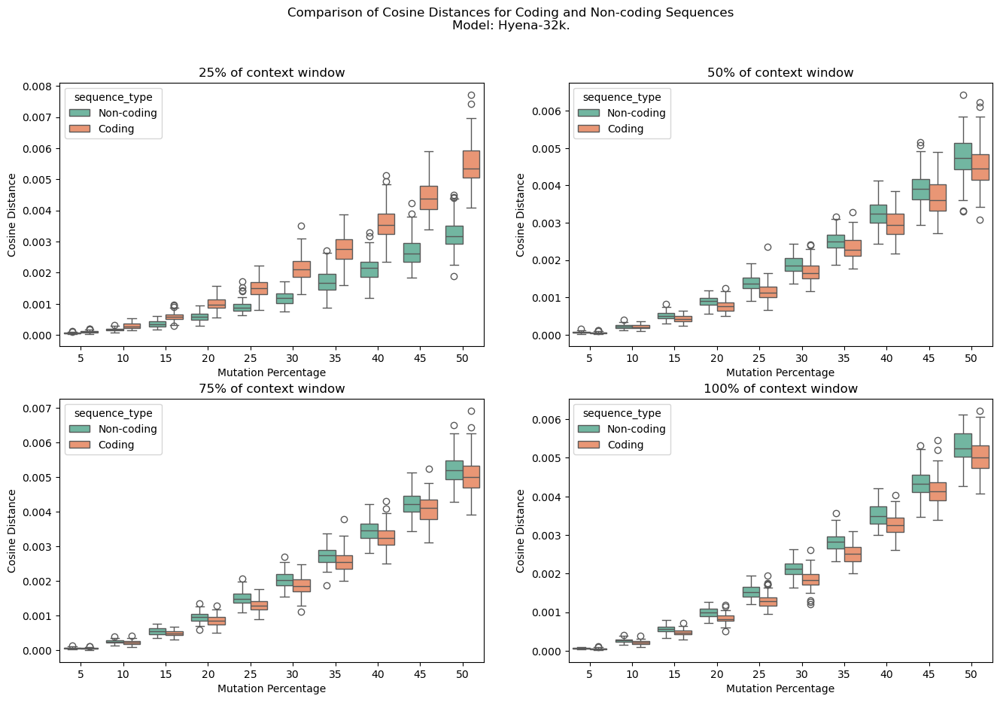

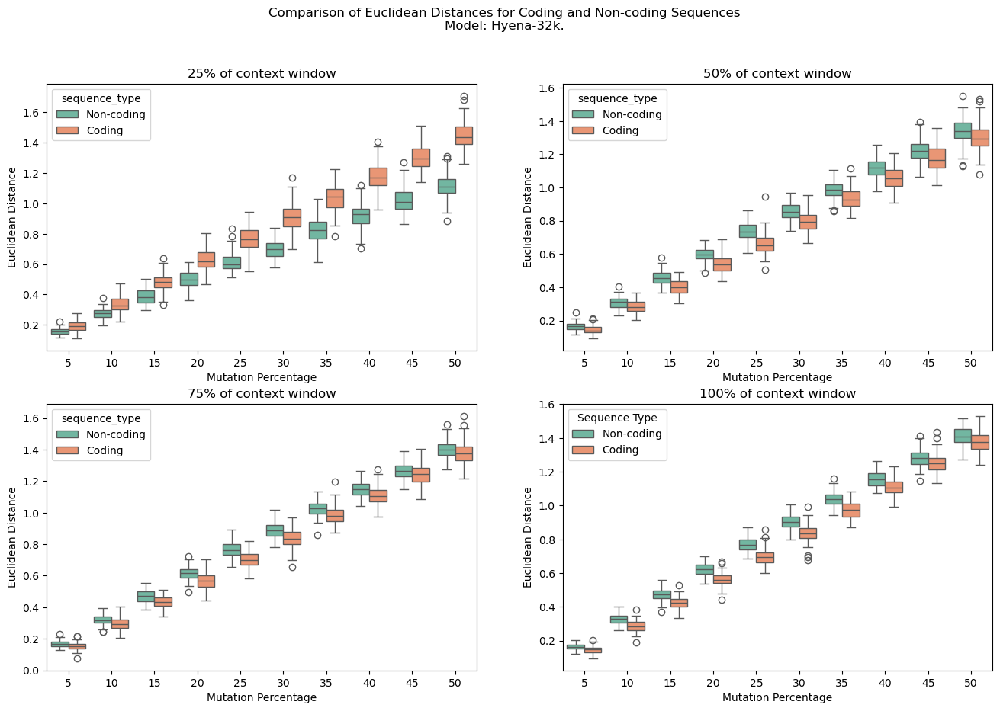


Plots for model: Hyena-160k



C:\Users\Ruhaib\AppData\Local\Temp\ipykernel_5584\1810704521.py:52: UserWarning: No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
  plt.legend(title="Sequence Type")
C:\Users\Ruhaib\AppData\Local\Temp\ipykernel_5584\1810704521.py:52: UserWarning: No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
  plt.legend(title="Sequence Type")
C:\Users\Ruhaib\AppData\Local\Temp\ipykernel_5584\1810704521.py:52: UserWarning: No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
  plt.legend(title="Sequence Type")


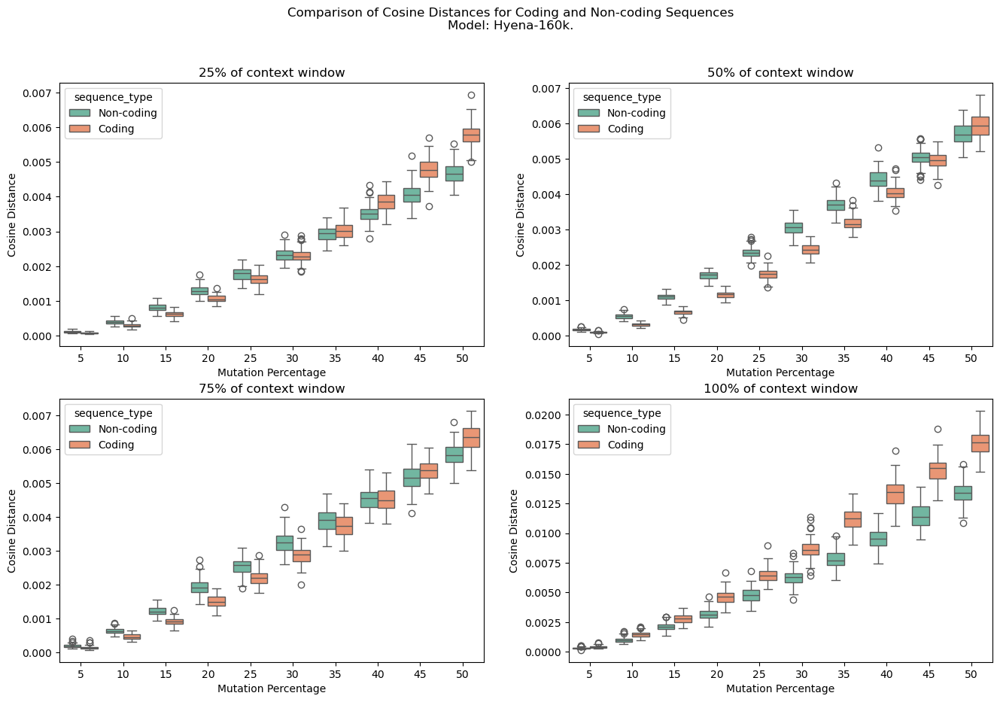

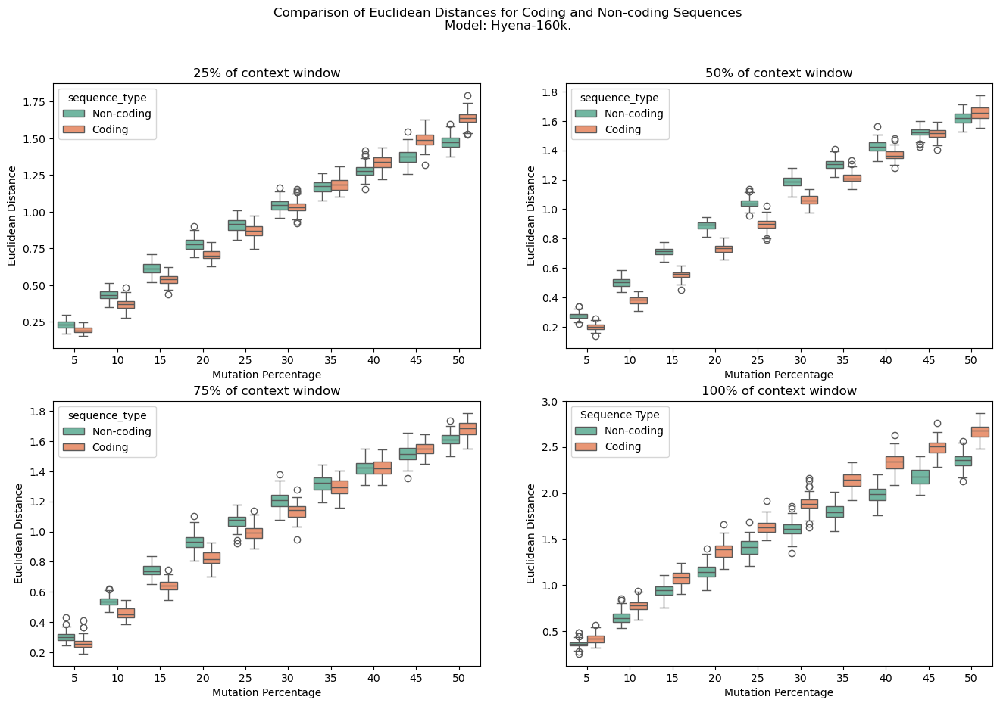


Plots for model: Hyena-450k



C:\Users\Ruhaib\AppData\Local\Temp\ipykernel_5584\1810704521.py:52: UserWarning: No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
  plt.legend(title="Sequence Type")
C:\Users\Ruhaib\AppData\Local\Temp\ipykernel_5584\1810704521.py:52: UserWarning: No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
  plt.legend(title="Sequence Type")
C:\Users\Ruhaib\AppData\Local\Temp\ipykernel_5584\1810704521.py:52: UserWarning: No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
  plt.legend(title="Sequence Type")


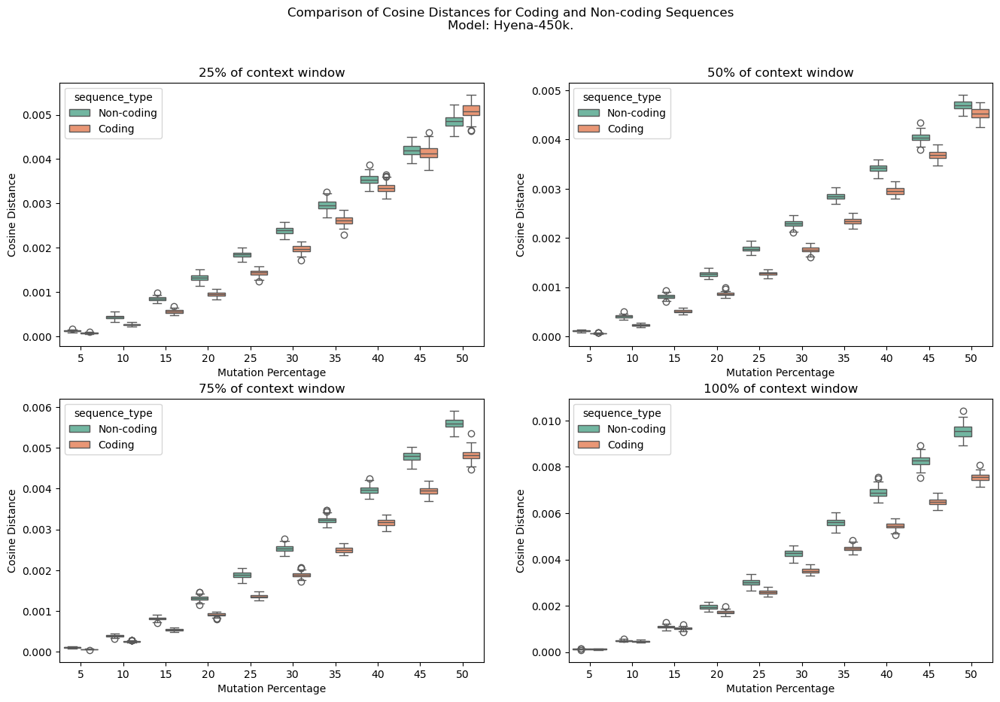

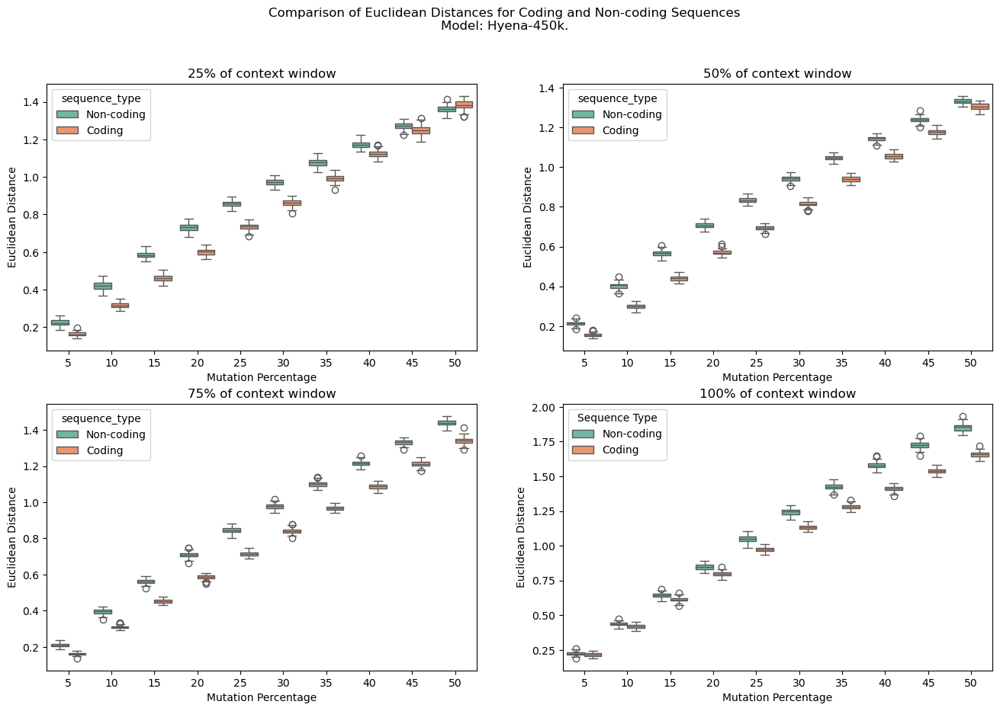


Plots for model: Hyena-1m



C:\Users\Ruhaib\AppData\Local\Temp\ipykernel_5584\1810704521.py:52: UserWarning: No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
  plt.legend(title="Sequence Type")
C:\Users\Ruhaib\AppData\Local\Temp\ipykernel_5584\1810704521.py:52: UserWarning: No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
  plt.legend(title="Sequence Type")


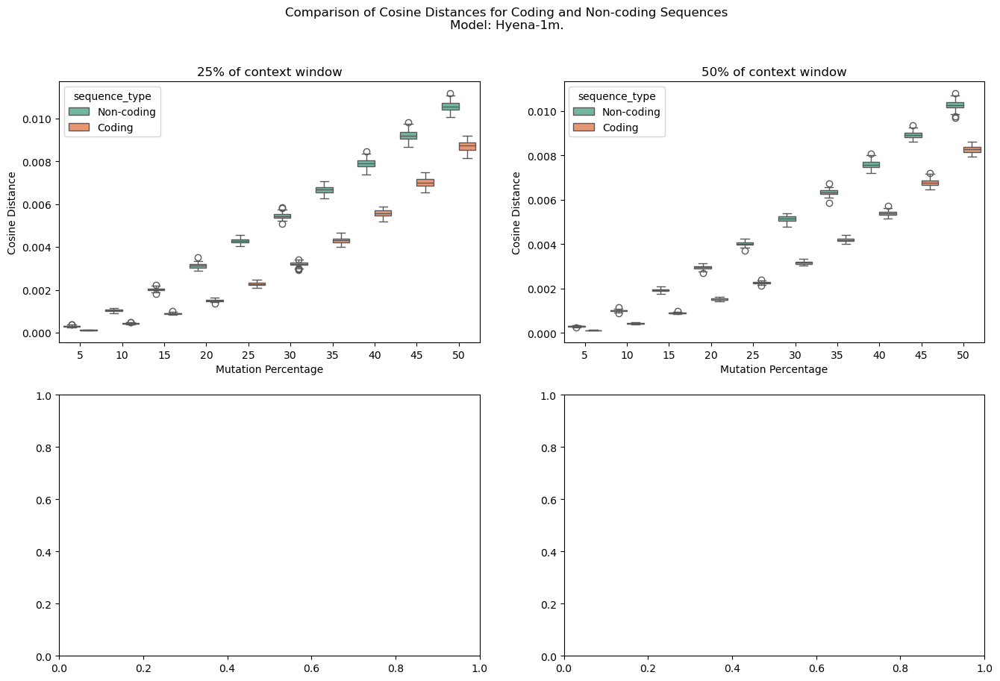

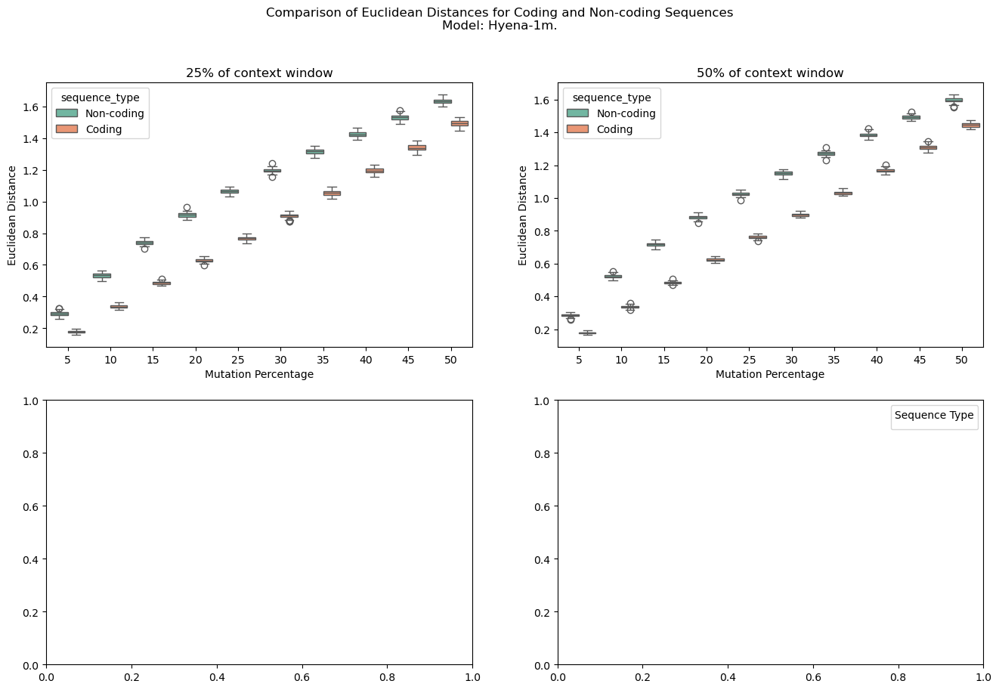

In [4]:
boxPlotter(df)

## Final Result Plots

In [7]:
import pandas as pd
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt

df = pd.read_csv('Sequences/seqStats.csv')

In [27]:
def combinedBoxPlotter(df, fraction, selected_models):

    fig_cosine, axs_cosine = plt.subplots(2, 4, figsize=(32, 12))
    fig_euclidean, axs_euclidean = plt.subplots(2, 4, figsize=(32, 12))

    #fig_cosine.suptitle(f"Comparison of Cosine Distances for Coding and Non-coding Sequences for 6 Models ({fraction}% fraction)", fontsize=16)
    #fig_euclidean.suptitle(f"Comparison of Euclidean Distances for Coding and Non-coding Sequences for 6 Models ({fraction}% fraction)", fontsize=16)

    colors = {'Non-coding': '#66c2a5', 'Coding': '#fc8d62'}


    for i, model in enumerate(selected_models):
        ax_cosine = axs_cosine[i // 4, i % 4]
        ax_euclidean = axs_euclidean[i // 4, i % 4]

        modelDf = df[(df["model"] == model) & (df["fraction"] == fraction)].copy()
        modelDf["mut_percentage"] = modelDf["mut_percentage"].astype(int)
        modelDf = modelDf.sort_values(by="mut_percentage")

        ax_cosine.set_xlabel("Mutation Percentage")
        ax_cosine.set_ylabel("Cosine Distance")
        ax_cosine.set_title(model)

        sns.boxplot(
            x="mut_percentage",
            y="Cosine",
            hue="sequence_type",
            data=modelDf,
            palette="Set2",
            ax=ax_cosine
        )

        # Connector lines between medians for Cosine with matching colors
        medians_coding = modelDf[modelDf["sequence_type"] == "Coding"].groupby("mut_percentage")["Cosine"].median()
        medians_noncoding = modelDf[modelDf["sequence_type"] == "Non-coding"].groupby("mut_percentage")["Cosine"].median()
        x_vals = np.arange(len(medians_coding))
        ax_cosine.plot(x_vals, medians_coding.values, marker='o', color=colors['Coding'], linestyle='-', alpha=0.8, linewidth=2)
        ax_cosine.plot(x_vals, medians_noncoding.values, marker='o', color=colors['Non-coding'], linestyle='-', alpha=0.8, linewidth=2)

        # Set legend title for cosine plot
        legend_cosine = ax_cosine.get_legend()
        if legend_cosine:
            legend_cosine.set_title("Sequence Type")

        ax_euclidean.set_xlabel("Mutation Percentage")
        ax_euclidean.set_ylabel("Euclidean Distance")
        ax_euclidean.set_title(model)

        sns.boxplot(
            x="mut_percentage",
            y="Euclidean",
            hue="sequence_type",
            data=modelDf,
            palette="Set2",
            ax=ax_euclidean
        )

        # Connector lines between medians for Euclidean with matching colors
        medians_coding_euc = modelDf[modelDf["sequence_type"] == "Coding"].groupby("mut_percentage")["Euclidean"].median()
        medians_noncoding_euc = modelDf[modelDf["sequence_type"] == "Non-coding"].groupby("mut_percentage")["Euclidean"].median()
        ax_euclidean.plot(x_vals, medians_coding_euc.values, marker='o', color=colors['Coding'], linestyle='-', alpha=0.8, linewidth=2)
        ax_euclidean.plot(x_vals, medians_noncoding_euc.values, marker='o', color=colors['Non-coding'], linestyle='-', alpha=0.8, linewidth=2)

        # Set legend title for euclidean plot
        legend_euclidean = ax_euclidean.get_legend()
        if legend_euclidean:
            legend_euclidean.set_title("Sequence Type")

    plt.tight_layout(rect=[0, 0, 1, 0.95])
    plt.show()

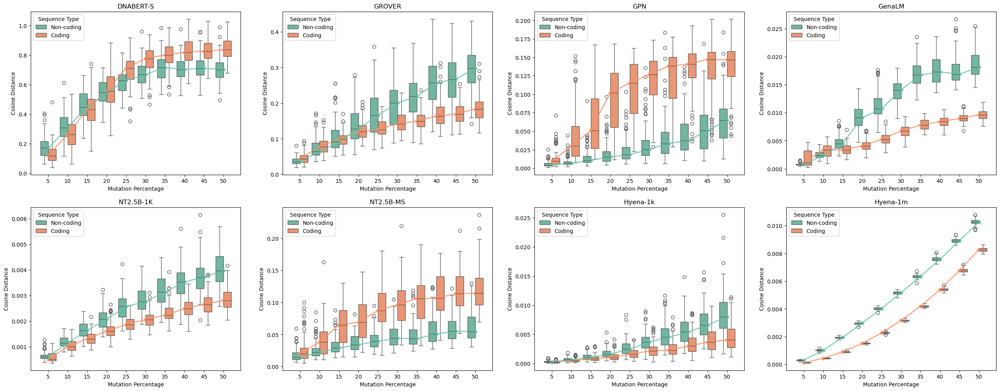

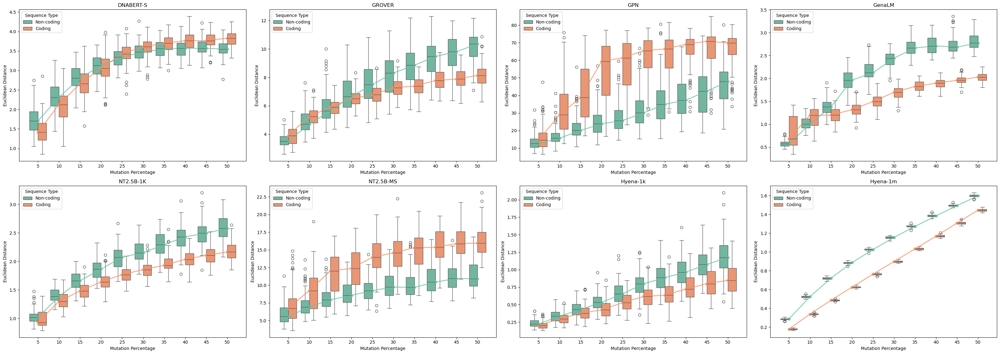

In [28]:
selected_models = ["DNABERT-S", "GROVER", "GPN", "GenaLM", "NT2.5B-1K", "NT2.5B-MS", "Hyena-1k", "Hyena-1m"]
combinedBoxPlotter(df, 50, selected_models)

In [21]:
selected_models = ["DNABERT-S", "GROVER", "GPN", "NT500M", "NT2.5B-1K", "NT2.5B-MS", "Hyena-1k", "Hyena-450k"]

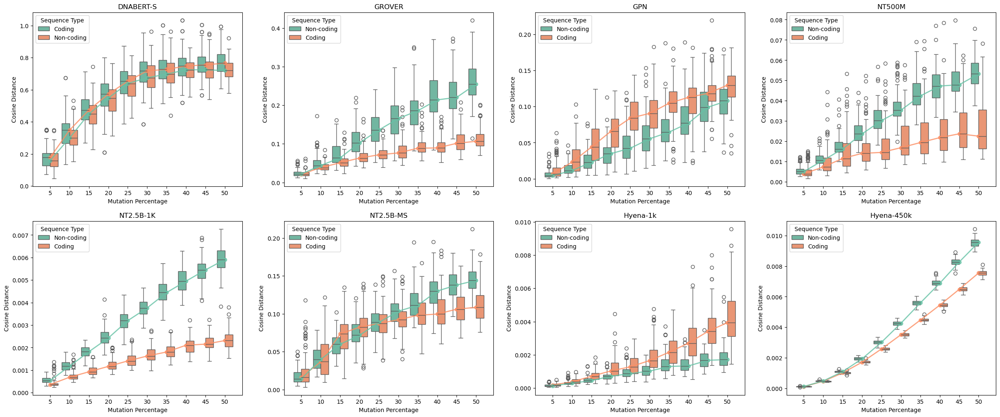

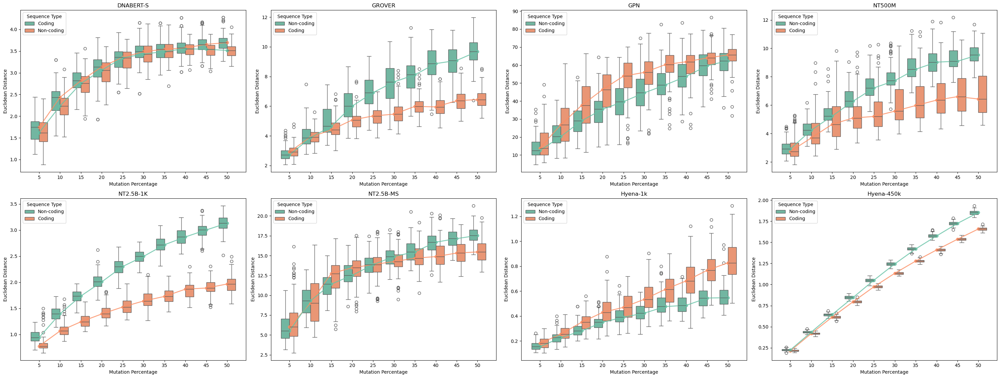

In [22]:
combinedBoxPlotter(df, 100, selected_models)

## 1000 input sequences per model:

In [20]:
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt
from scipy.stats import kstest

smolModels = [
    "GPN",
    "GROVER",
    "NT500M",
    "Hyena-1k"
]
fractions = ["25", "50", "75", "100"]

In [23]:
def histPlotter(fraction):
    selected_models = ["GPN", "GROVER", "NT500M", "Hyena-1k"]

    fig_cosine, axs_cosine = plt.subplots(2, 2, figsize=(12, 12))
    fig_euclidean, axs_euclidean = plt.subplots(2, 2, figsize=(12, 12))

    #fig_cosine.suptitle(f"Comparison of Cosine Distances for Coding and Non-coding Sequences for 4 Models ({fraction}% fraction)", fontsize=16)
    #fig_euclidean.suptitle(f"Comparison of Euclidean Distances for Coding and Non-coding Sequences for 4 Models ({fraction}% fraction)", fontsize=16)

    colors = {'Non-coding': '#66c2a5', 'Coding': '#fc8d62'}  # Set2 palette colors

    for i, model in enumerate(selected_models):
        ax_cosine = axs_cosine[i // 2, i % 2]
        ax_euclidean = axs_euclidean[i // 2, i % 2]

        df = pd.read_csv(f"1000_seqs/{model}_allDistances.csv")
        modelDf = df[df["fraction"] == fraction].copy()

        ax_cosine.set_xlabel("Cosine Distance")
        ax_cosine.set_ylabel("Count")
        ax_cosine.set_title(model)

        sns.histplot(
            data=modelDf,
            x='Cosine',
            bins=100,
            hue='sequence_type',
            palette=colors,
            alpha=0.7,
            ax=ax_cosine
        )

        legend_cosine = ax_cosine.get_legend()
        if legend_cosine:
            legend_cosine.set_title("Sequence Type")

        ax_euclidean.set_xlabel("Euclidean Distance")
        ax_euclidean.set_ylabel("Count")
        ax_euclidean.set_title(model)

        sns.histplot(
            data=modelDf,
            x='Euclidean',
            bins=100,
            hue='sequence_type',
            palette=colors,
            alpha=0.7,
            ax=ax_euclidean
        )

        legend_euclidean = ax_euclidean.get_legend()
        if legend_euclidean:
            legend_euclidean.set_title("Sequence Type")

    plt.tight_layout(rect=[0, 0, 1, 0.95])
    plt.show()


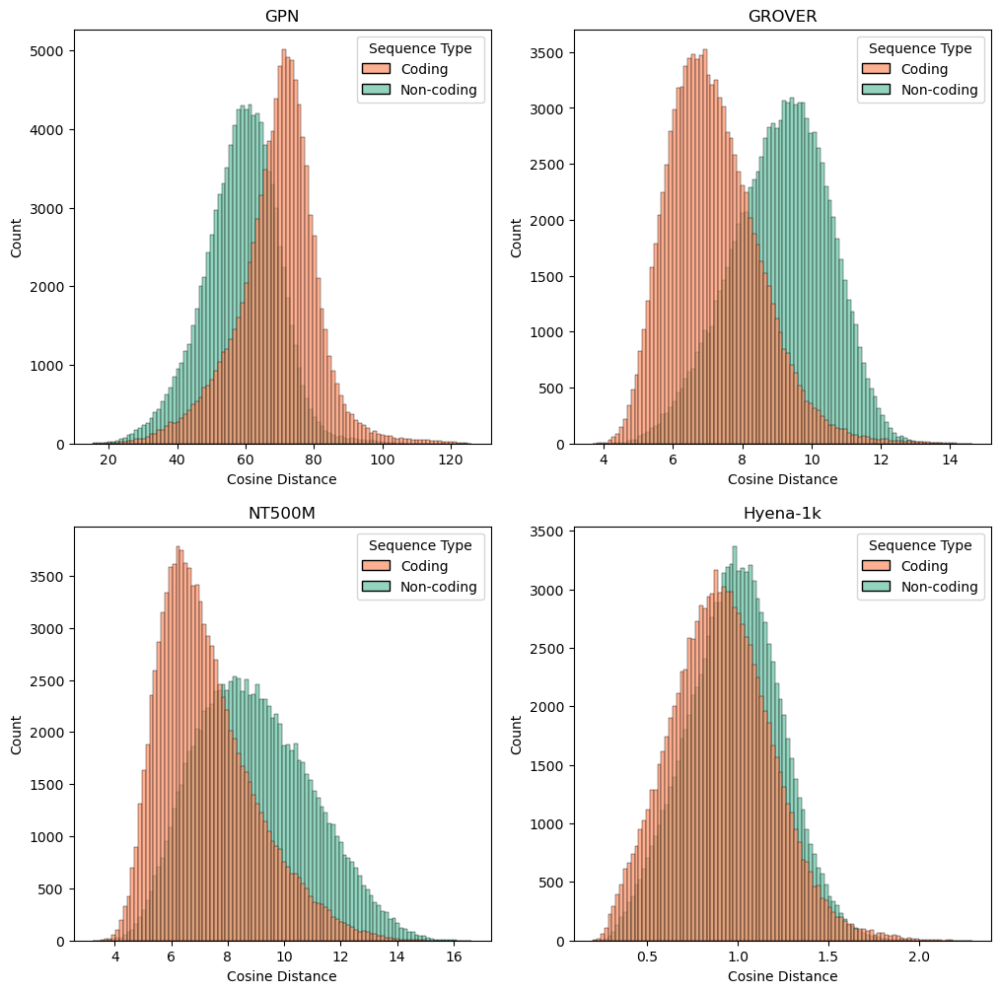

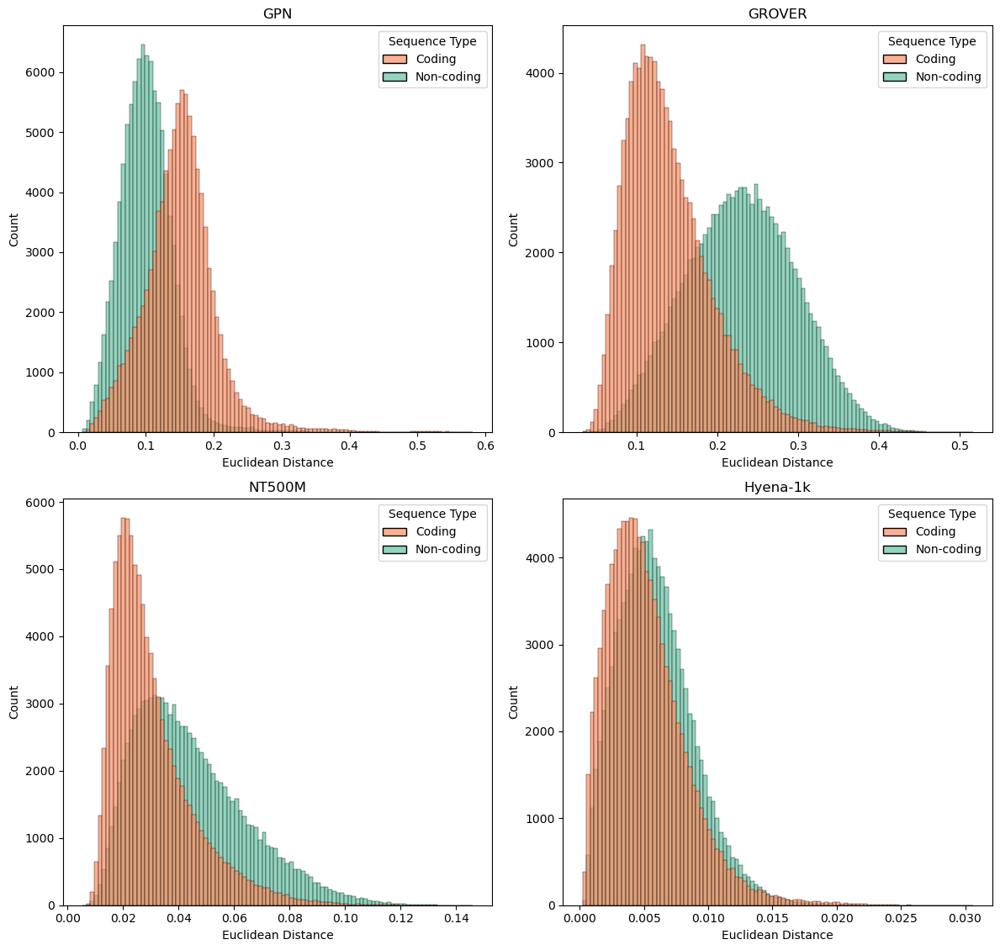

In [24]:
histPlotter(100)

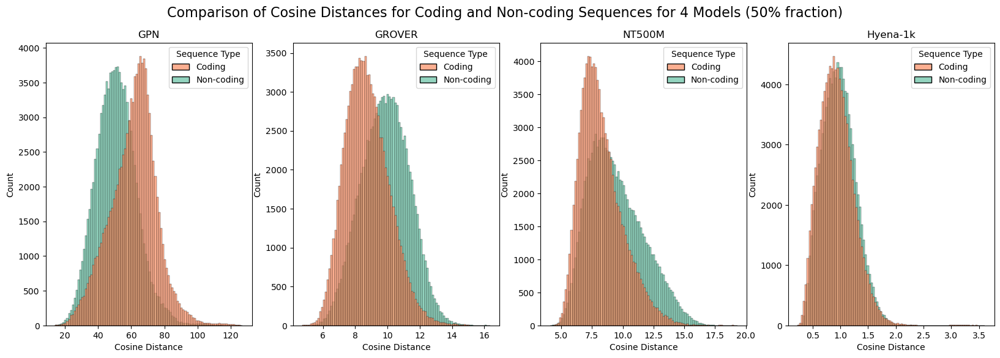

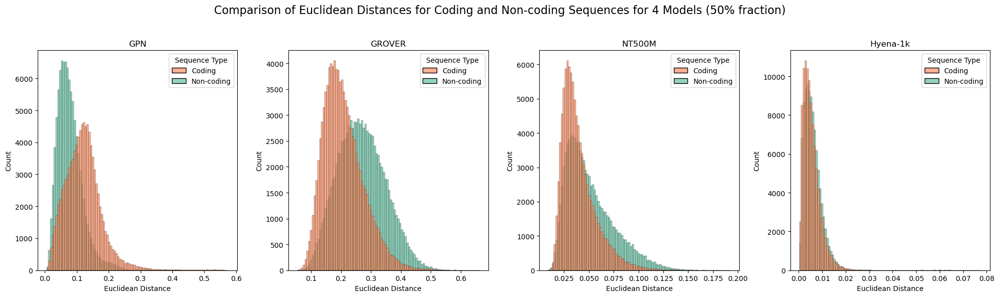

In [51]:
histPlotter(50)

#### Yeast Coding Genes & Human Non-Coding Genes

In [6]:
def boxPlotter1k():
    for model in smolModels:

        df = pd.read_csv(f"1000_seqs/{model}_allDistances.csv")
        print(f"\nPlots for model: {model}\n")

        cosineFig, cosineAxs = plt.subplots(2, 2, figsize=(16, 10))
        euclideanFig, euclideanAxs = plt.subplots(2, 2, figsize=(16, 10))

        cosineFig.suptitle(
            f"Comparison of Cosine Distances for Coding and Non-coding Sequences\nModel: {model}."
        )
        euclideanFig.suptitle(
            f"Comparison of Euclidean Distances for Coding and Non-coding Sequences\nModel: {model}."
        )

        for i, fraction in enumerate(fractions):
            
            ax_x, ax_y = i // 2, i % 2

            modelDf = df[df["fraction"] == int(fraction)].copy()
            codingDistribution = modelDf[modelDf["sequence_type"] == "Coding"]
            noncodingDistribution = modelDf[modelDf["sequence_type"] == "Non-coding"]
            print(codingDistribution["Cosine"])

            cosineScore = kstest(codingDistribution["Cosine"], noncodingDistribution["Cosine"])
            euclideanScore = kstest(codingDistribution["Euclidean"], noncodingDistribution["Euclidean"])

            print(cosineScore)
            print(euclideanScore)

            cosineAxs[ax_x, ax_y].set_xlabel("Cosine Distance")
            cosineAxs[ax_x, ax_y].set_ylabel("Count")
            
            sns.histplot(modelDf.iloc[:, [2, 17]], x='Cosine',  bins=100, hue='sequence_type', alpha=0.7, ax=cosineAxs[ax_x, ax_y])
            cosineAxs[ax_x, ax_y].set_title(f'{fraction}% of context window')

            euclideanAxs[ax_x, ax_y].set_ylabel("Count")
            euclideanAxs[ax_x, ax_y].set_xlabel("Euclidean Distance")

            sns.histplot(modelDf.iloc[:, [2, 18]], x='Euclidean',  bins=100, hue='sequence_type', alpha=0.7, ax=euclideanAxs[ax_x, ax_y])
            euclideanAxs[ax_x, ax_y].set_title(f'{fraction}% of context window')

            plt.legend(title="Sequence Type")
            
        plt.show()


Plots for model: GPN

KstestResult(statistic=0.15703, pvalue=0.0, statistic_location=47.27773284912109, statistic_sign=-1)
KstestResult(statistic=0.17417000000000005, pvalue=0.0, statistic_location=0.0596883783264204, statistic_sign=-1)


C:\Users\Ruhaib\AppData\Local\Temp\ipykernel_21896\1393264235.py:43: UserWarning: No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
  plt.legend(title="Sequence Type")


KstestResult(statistic=0.36409, pvalue=0.0, statistic_location=59.09075546264648, statistic_sign=-1)
KstestResult(statistic=0.39028999999999997, pvalue=0.0, statistic_location=0.1002817334598306, statistic_sign=-1)


C:\Users\Ruhaib\AppData\Local\Temp\ipykernel_21896\1393264235.py:43: UserWarning: No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
  plt.legend(title="Sequence Type")


KstestResult(statistic=0.41268, pvalue=0.0, statistic_location=63.2158203125, statistic_sign=-1)
KstestResult(statistic=0.45619000000000004, pvalue=0.0, statistic_location=0.118622492072515, statistic_sign=-1)


C:\Users\Ruhaib\AppData\Local\Temp\ipykernel_21896\1393264235.py:43: UserWarning: No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
  plt.legend(title="Sequence Type")


KstestResult(statistic=0.42322999999999994, pvalue=0.0, statistic_location=66.37782287597656, statistic_sign=-1)
KstestResult(statistic=0.48337, pvalue=0.0, statistic_location=0.1291399265812819, statistic_sign=-1)


C:\Users\Ruhaib\AppData\Local\Temp\ipykernel_21896\1393264235.py:43: UserWarning: No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
  plt.legend(title="Sequence Type")


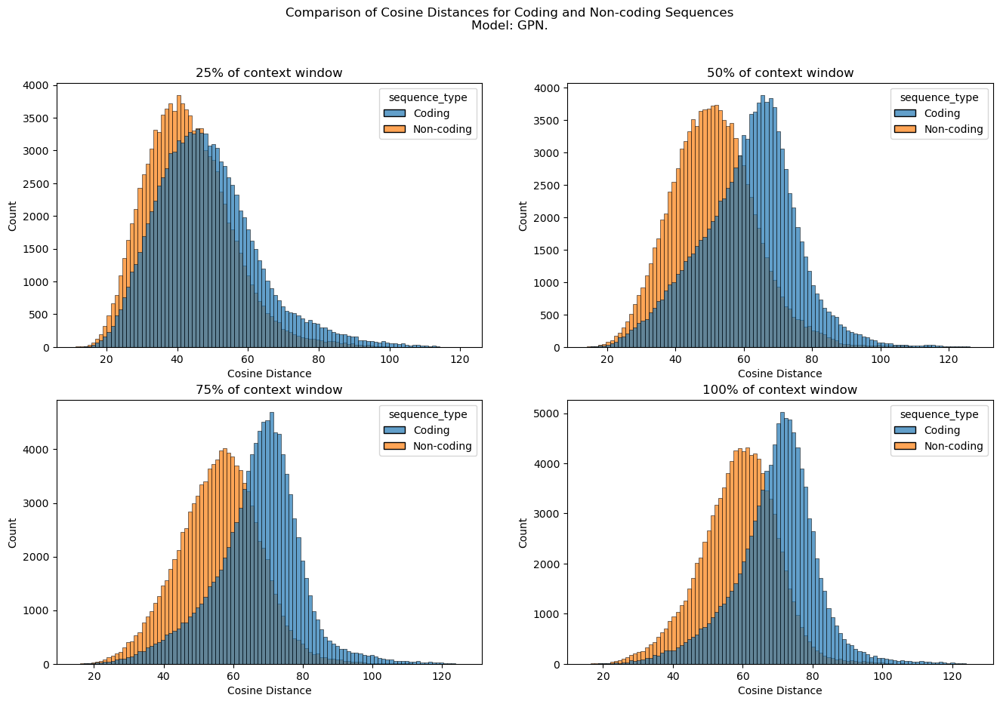

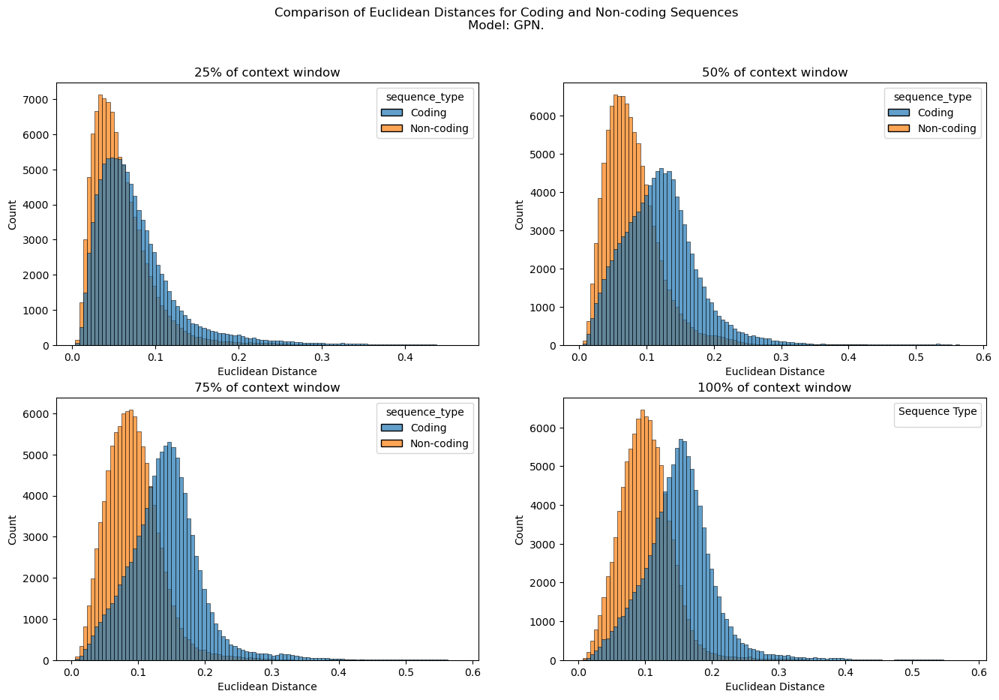


Plots for model: GROVER

KstestResult(statistic=0.16202000000000005, pvalue=0.0, statistic_location=10.88621425628662, statistic_sign=1)
KstestResult(statistic=0.18018, pvalue=0.0, statistic_location=0.3222979459053624, statistic_sign=1)


C:\Users\Ruhaib\AppData\Local\Temp\ipykernel_21896\1393264235.py:43: UserWarning: No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
  plt.legend(title="Sequence Type")


KstestResult(statistic=0.3241, pvalue=0.0, statistic_location=9.36337184906006, statistic_sign=1)
KstestResult(statistic=0.34284000000000003, pvalue=0.0, statistic_location=0.23092086751957, statistic_sign=1)


C:\Users\Ruhaib\AppData\Local\Temp\ipykernel_21896\1393264235.py:43: UserWarning: No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
  plt.legend(title="Sequence Type")


KstestResult(statistic=0.4696, pvalue=0.0, statistic_location=8.578888893127441, statistic_sign=1)
KstestResult(statistic=0.48111, pvalue=0.0, statistic_location=0.1948298033462959, statistic_sign=1)


C:\Users\Ruhaib\AppData\Local\Temp\ipykernel_21896\1393264235.py:43: UserWarning: No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
  plt.legend(title="Sequence Type")


KstestResult(statistic=0.54114, pvalue=0.0, statistic_location=8.1650972366333, statistic_sign=1)
KstestResult(statistic=0.55537, pvalue=0.0, statistic_location=0.1802136082571929, statistic_sign=1)


C:\Users\Ruhaib\AppData\Local\Temp\ipykernel_21896\1393264235.py:43: UserWarning: No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
  plt.legend(title="Sequence Type")


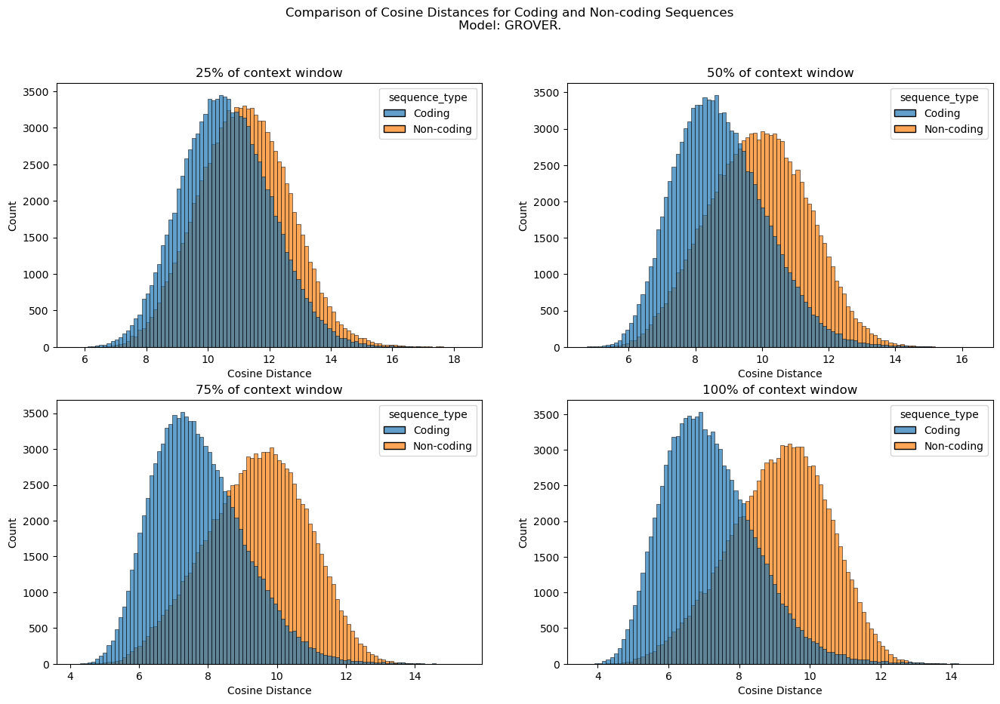

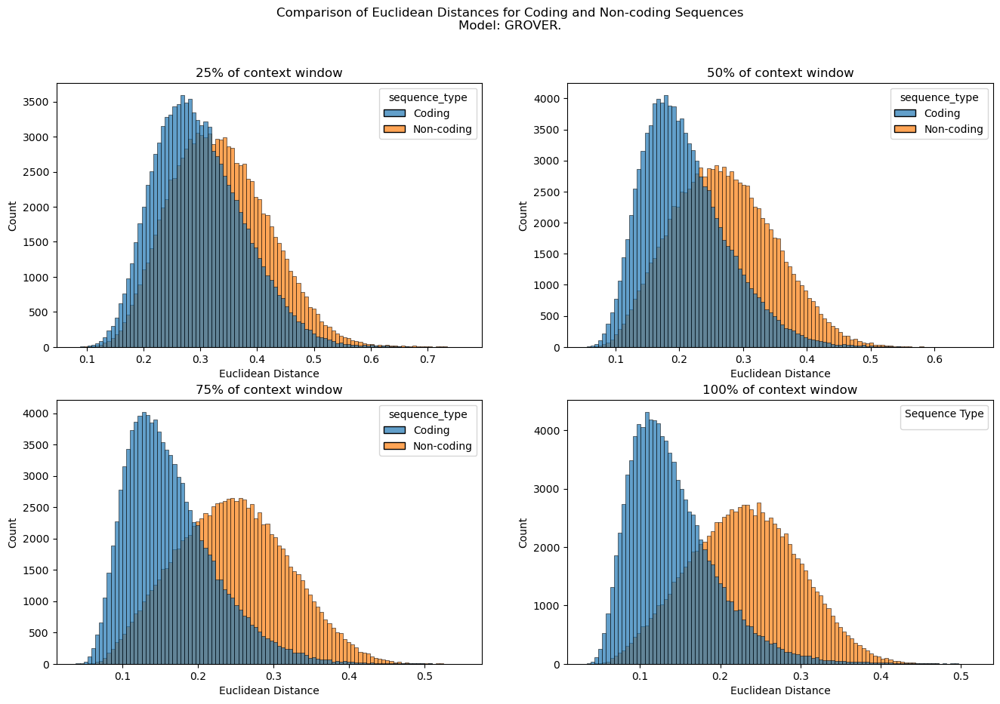


Plots for model: NT500M

KstestResult(statistic=0.09949000000000002, pvalue=0.0, statistic_location=9.510096549987791, statistic_sign=1)
KstestResult(statistic=0.09870999999999996, pvalue=0.0, statistic_location=0.0541906210551179, statistic_sign=1)


C:\Users\Ruhaib\AppData\Local\Temp\ipykernel_21896\1393264235.py:43: UserWarning: No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
  plt.legend(title="Sequence Type")


KstestResult(statistic=0.23309000000000007, pvalue=0.0, statistic_location=8.882997512817383, statistic_sign=1)
KstestResult(statistic=0.21575, pvalue=0.0, statistic_location=0.0444386636381324, statistic_sign=1)


C:\Users\Ruhaib\AppData\Local\Temp\ipykernel_21896\1393264235.py:43: UserWarning: No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
  plt.legend(title="Sequence Type")


KstestResult(statistic=0.17811, pvalue=0.0, statistic_location=7.702399253845215, statistic_sign=1)
KstestResult(statistic=0.16224000000000005, pvalue=0.0, statistic_location=0.0326843418456508, statistic_sign=1)


C:\Users\Ruhaib\AppData\Local\Temp\ipykernel_21896\1393264235.py:43: UserWarning: No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
  plt.legend(title="Sequence Type")


KstestResult(statistic=0.36715000000000003, pvalue=0.0, statistic_location=7.742940902709961, statistic_sign=1)
KstestResult(statistic=0.3415, pvalue=0.0, statistic_location=0.0326069285602359, statistic_sign=1)


C:\Users\Ruhaib\AppData\Local\Temp\ipykernel_21896\1393264235.py:43: UserWarning: No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
  plt.legend(title="Sequence Type")


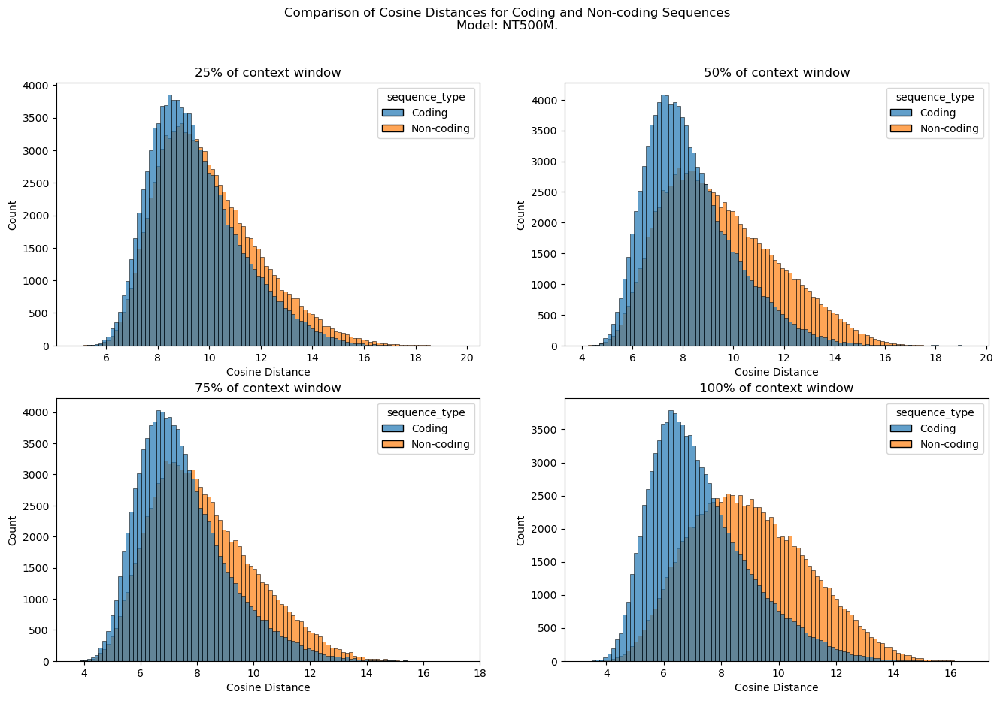

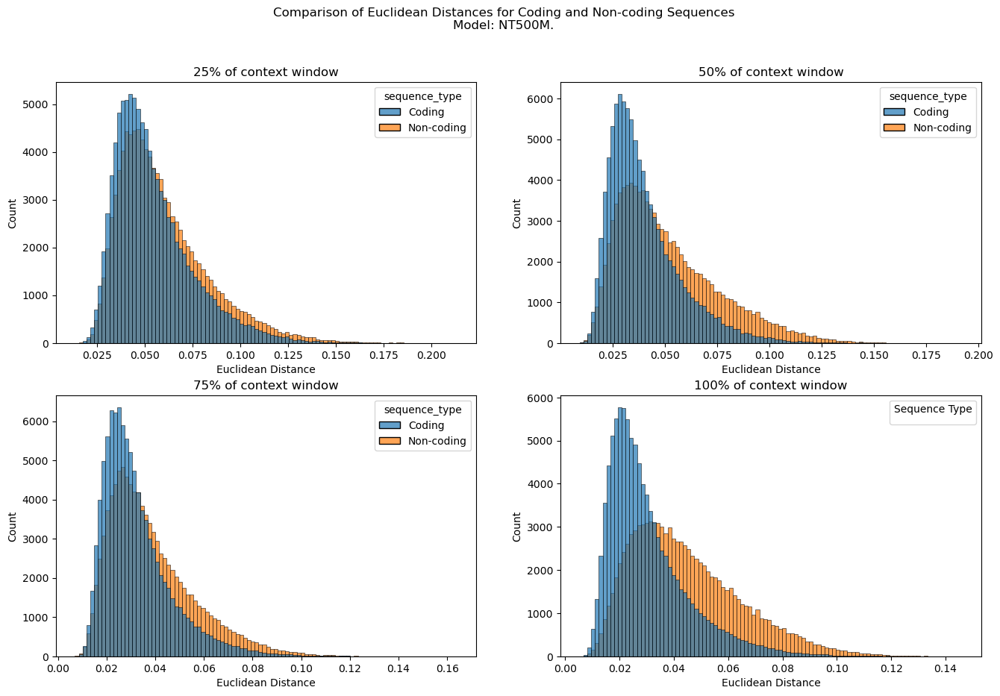


Plots for model: Hyena-1k

KstestResult(statistic=0.018750000000000044, pvalue=1.06245404327272e-15, statistic_location=0.8079239130020142, statistic_sign=1)
KstestResult(statistic=0.020220000000000016, pvalue=3.4481003135882337e-18, statistic_location=0.0037889410411563, statistic_sign=1)


C:\Users\Ruhaib\AppData\Local\Temp\ipykernel_21896\1393264235.py:43: UserWarning: No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
  plt.legend(title="Sequence Type")


KstestResult(statistic=0.07192000000000004, pvalue=2.421142840964952e-225, statistic_location=0.9270467162132264, statistic_sign=1)
KstestResult(statistic=0.07348000000000005, pvalue=3.232425515249125e-235, statistic_location=0.0049896271826579, statistic_sign=1)


C:\Users\Ruhaib\AppData\Local\Temp\ipykernel_21896\1393264235.py:43: UserWarning: No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
  plt.legend(title="Sequence Type")


KstestResult(statistic=0.09527000000000002, pvalue=0.0, statistic_location=0.9326800107955932, statistic_sign=1)
KstestResult(statistic=0.09734000000000004, pvalue=0.0, statistic_location=0.0049175691412297, statistic_sign=1)


C:\Users\Ruhaib\AppData\Local\Temp\ipykernel_21896\1393264235.py:43: UserWarning: No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
  plt.legend(title="Sequence Type")


KstestResult(statistic=0.12699999999999995, pvalue=0.0, statistic_location=0.9128759503364564, statistic_sign=1)
KstestResult(statistic=0.12896000000000002, pvalue=0.0, statistic_location=0.0047266434987162, statistic_sign=1)


C:\Users\Ruhaib\AppData\Local\Temp\ipykernel_21896\1393264235.py:43: UserWarning: No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
  plt.legend(title="Sequence Type")


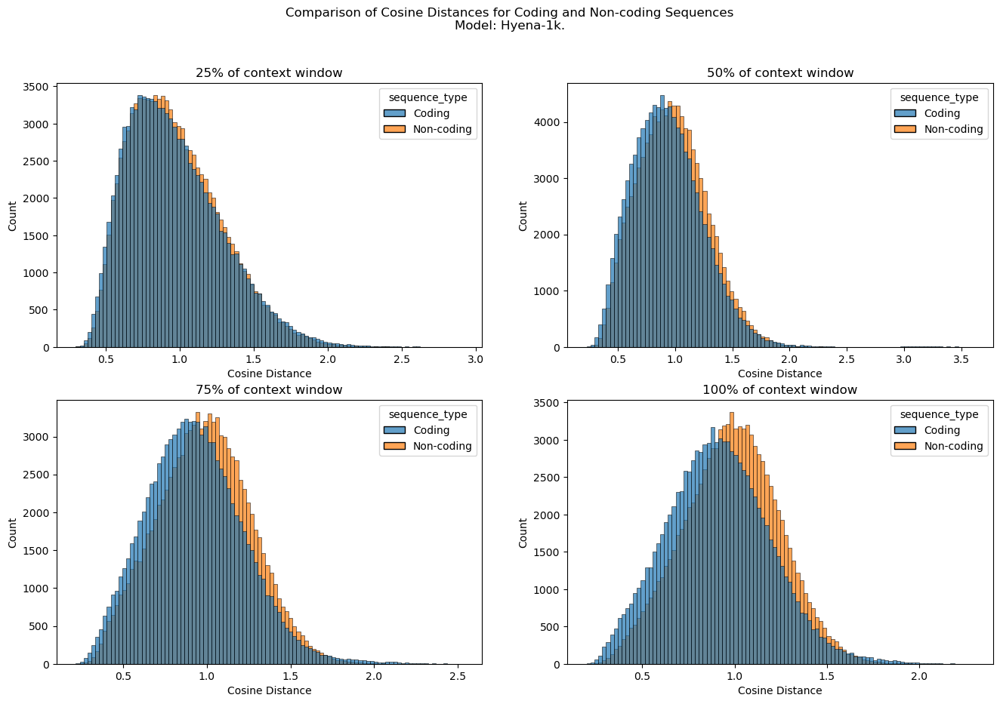

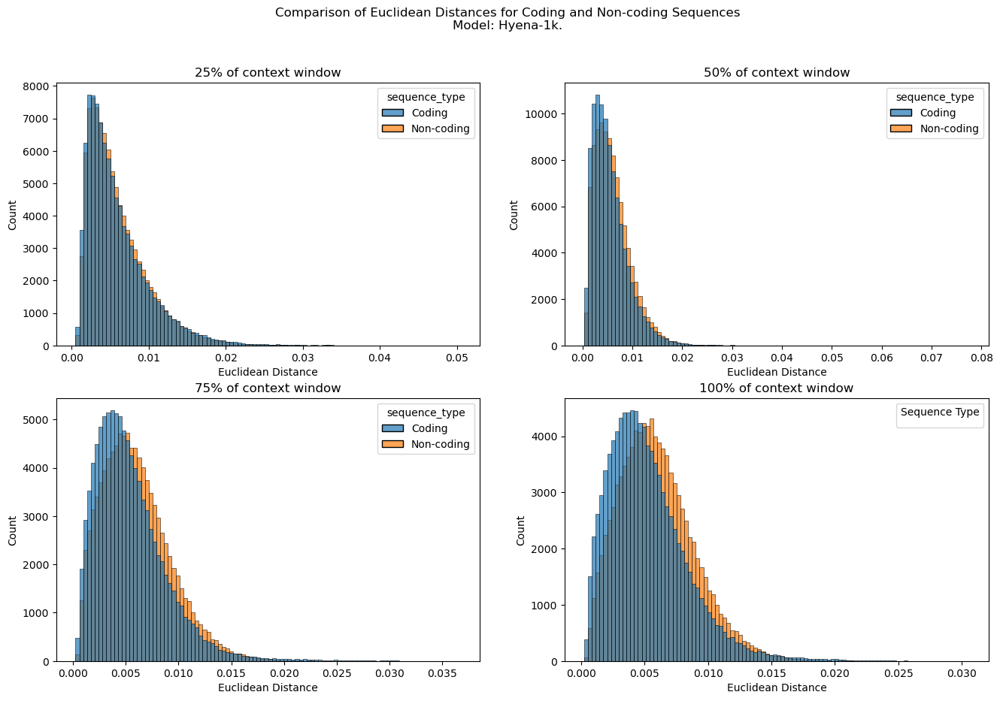

In [3]:
boxPlotter1k()

#### Human Coding & Non-Coding Genes

In [21]:
def boxPlotter1kHuman():
    for model in smolModels:

        modelDf = pd.read_csv(f"1000_seqs/{model}_allDistances_50.csv")
        print(f"\nPlots for model: {model}, with Human Genes\n")
        #print(modelDf.head())

        fig, ax = plt.subplots(1, 2, figsize=(16, 10))

        fig.suptitle(
            f"Comparison of Distance Distributions for Coding and Non-coding Human Gene Sequences\nModel: {model}."
        )

        codingDistribution = modelDf[modelDf["sequence_type"] == "Coding"]
        noncodingDistribution = modelDf[modelDf["sequence_type"] == "Non-coding"]

        cosineScore = kstest(codingDistribution["Cosine"], noncodingDistribution["Cosine"])
        euclideanScore = kstest(codingDistribution["Euclidean"], noncodingDistribution["Euclidean"])

        print("Cosine distance distributions' KS-Test results:", cosineScore)
        print("Euclidean distance distributions' KS-Test results:", euclideanScore)

        ax[0].set_xlabel("Cosine Distance")
        ax[0].set_ylabel("Count")
        
        sns.histplot(modelDf.loc[:, ["sequence_type", "Cosine"]], x='Cosine',  bins=100, hue='sequence_type', alpha=0.7, ax=ax[0])
        ax[0].set_title(f'Cosine Distances Distribution')

        ax[1].set_xlabel("Euclidean Distance")
        ax[1].set_ylabel("Count")

        sns.histplot(modelDf.loc[:, ["sequence_type", "Euclidean"]], x='Euclidean',  bins=100, hue='sequence_type', alpha=0.7, ax=ax[1])
        ax[1].set_title(f'Euclidean  Distances Distribution')
            
        plt.show()


Plots for model: GPN, with Human Genes

Cosine distance distributions' KS-Test results: KstestResult(statistic=0.11775999999999998, pvalue=0.0, statistic_location=67.32759857177734, statistic_sign=-1)
Euclidean distance distributions' KS-Test results: KstestResult(statistic=0.13976999999999995, pvalue=0.0, statistic_location=0.127034240458605, statistic_sign=-1)


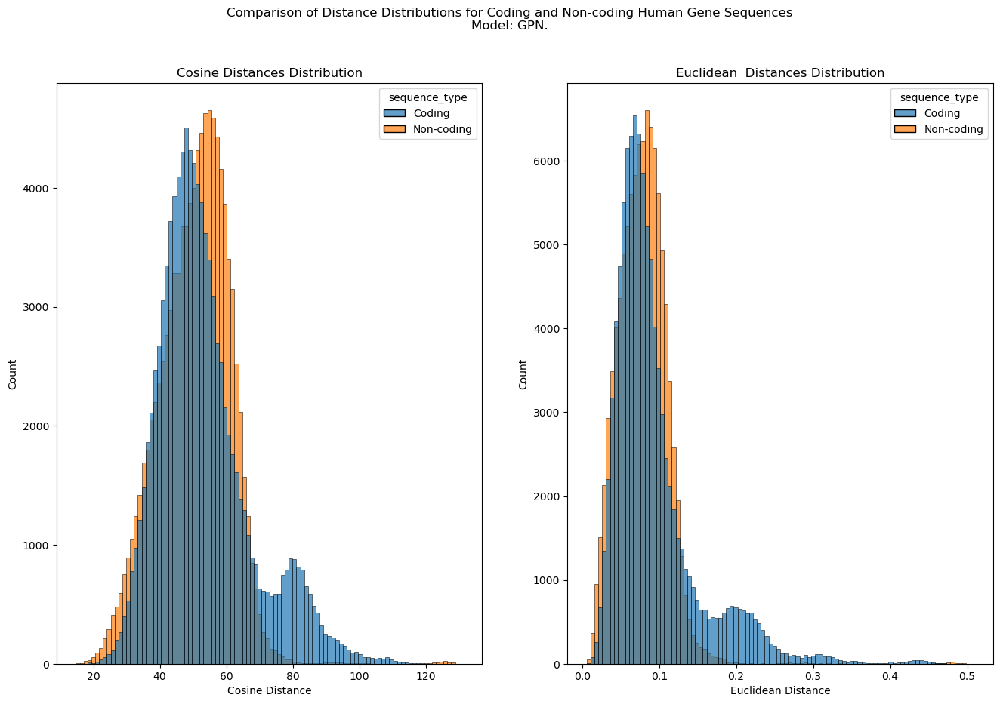


Plots for model: GROVER, with Human Genes

Cosine distance distributions' KS-Test results: KstestResult(statistic=0.13906000000000002, pvalue=0.0, statistic_location=8.39820671081543, statistic_sign=1)
Euclidean distance distributions' KS-Test results: KstestResult(statistic=0.16939000000000004, pvalue=0.0, statistic_location=0.1892017504867513, statistic_sign=1)


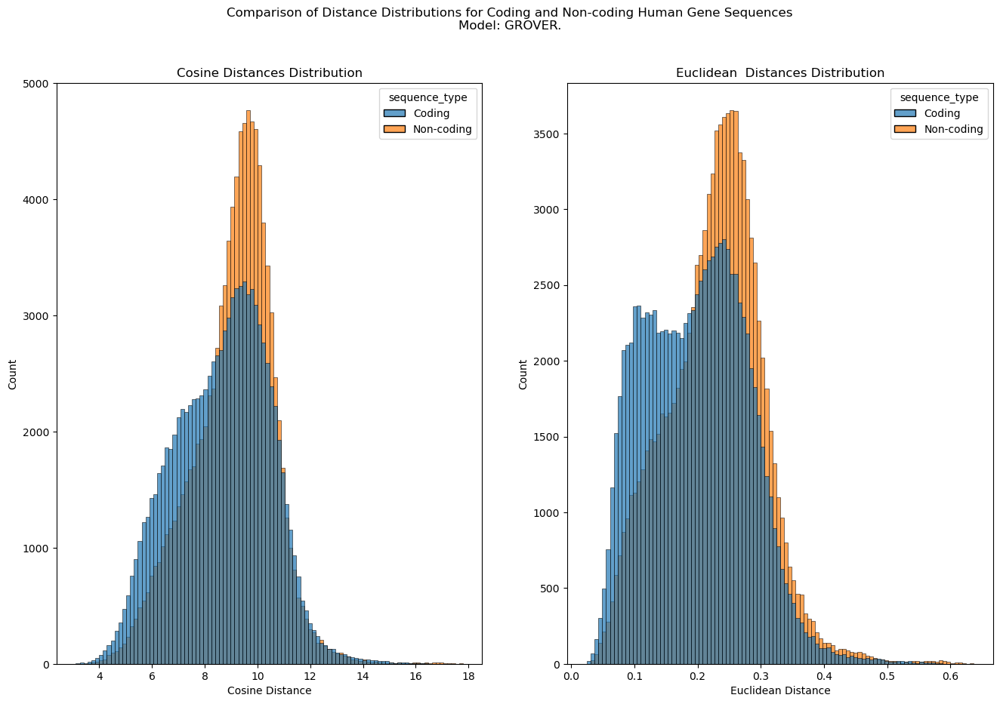


Plots for model: Hyena-1k, with Human Genes

Cosine distance distributions' KS-Test results: KstestResult(statistic=0.08240999999999998, pvalue=7.666076345972816e-296, statistic_location=1.0210098028182983, statistic_sign=1)
Euclidean distance distributions' KS-Test results: KstestResult(statistic=0.07084000000000001, pvalue=1.2459991380765896e-218, statistic_location=0.0060501396233336, statistic_sign=1)


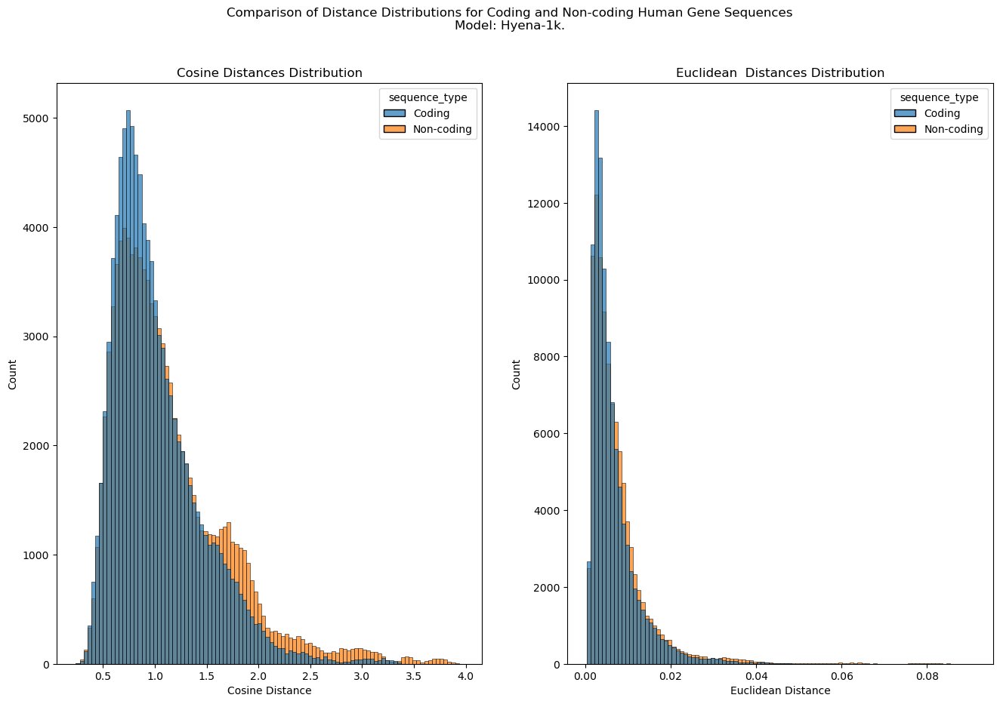

In [22]:
boxPlotter1kHuman()

# Analysis section

Features that we have: <br>
"model", "sequence_type", "fraction", "seqLen", "mut_percentage", "old_A_count", "old_T_count", "old_C_count", "old_G_count", "new_A_count", "new_T_count", "new_C_count", "new_G_count", "Transitions", "Transversions", "Cosine", "Euclidean"

Stuff to analyse:
1. See the distribution of transitions/transversions across the 100 sequences for a specific value of x, and see how the cosine/euclidean distance changes with it.
2. Nucleotide-specific analysis: See what the distances are more responsive to - what increase/decrease in a specific nucleotide count has the biggest impact
3. Analyse the above variation between coding and non-coding
4. Analyse their performance across the different sequence lengths

In [1]:
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt

df = pd.read_csv('Sequences/seqStats.csv')

## 1. Variation in distances with number of transitions and transversions

### Mutation type-specific analysis:
Just seeing whether there's any different pattern in the distances for sequences that have a higher number of transitions/transversions, and to see whether the magnitude of distances vary with number of transitions/transversions. <br><br>
Observation: It seems that the distances don't vary at all with the number of transitions or transversions specifically. This seems to be the case for all the models, and for both coding and non-coding sequences! Gena-LM and Hyena-32k have distinct figures because the number of transversions seems to be much greater for one type of sequence as compared to the another, weirdly enough. I don't think much can be said of this since the number of transtions/transversions is purely dependent on the length and composition of the original sequence.

In [2]:
def mutTypeVariation(model, x, fraction):
    df_filtered = df[(df["model"] == model) & (df["mut_percentage"] == x) & (df["fraction"] == fraction)]

    fig, ax = plt.subplots(2, 2, figsize=(12,8))
    sns.scatterplot(data=df_filtered, x="Transitions", y="Cosine", hue="sequence_type", ax=ax[0, 0])
    ax[0, 0].set_title(f'Transitions vs. Cosine Distance \n(Model: {model}, Fraction: {fraction}%, Mutation: {x}%)')

    sns.scatterplot(data=df_filtered, x="Transversions", y="Cosine", hue="sequence_type", ax=ax[0, 1])
    ax[0, 1].set_title(f'Transversions vs. Cosine Distance \n(Model: {model}, Fraction: {fraction}%, Mutation: {x}%)')

    sns.scatterplot(data=df_filtered, x="Transitions", y="Euclidean", hue="sequence_type", ax=ax[1, 0])
    ax[1, 0].set_title(f'Transitions vs. Euclidean Distance \n(Model: {model}, Fraction: {fraction}%, Mutation: {x}%)')

    sns.scatterplot(data=df_filtered, x="Transversions", y="Euclidean", hue="sequence_type", ax=ax[1, 1])
    ax[1, 1].set_title(f'Transversions vs. Euclidean Distance \n(Model: {model}, Fraction: {fraction}%, Mutation: {x}%)')


    plt.tight_layout()
    plt.show()


Now doing model: DNABERT-2



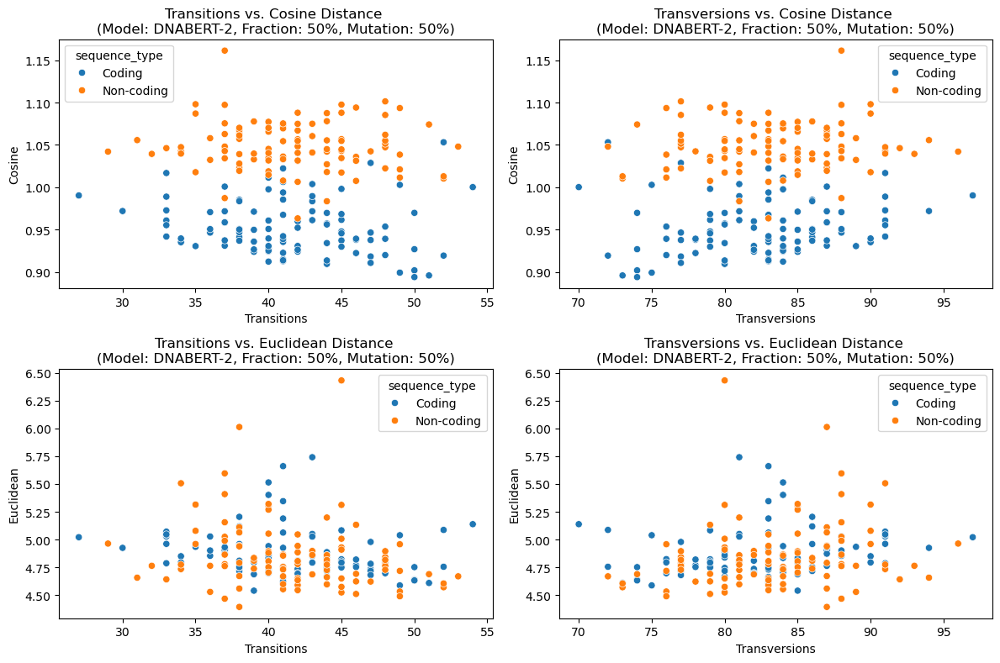


Now doing model: GPN



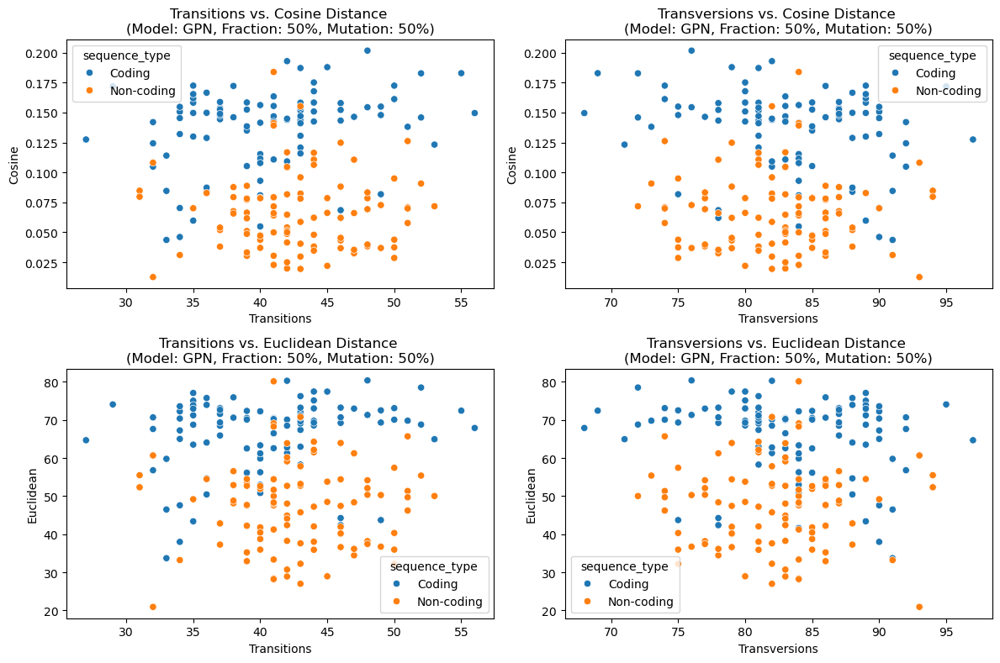


Now doing model: GROVER



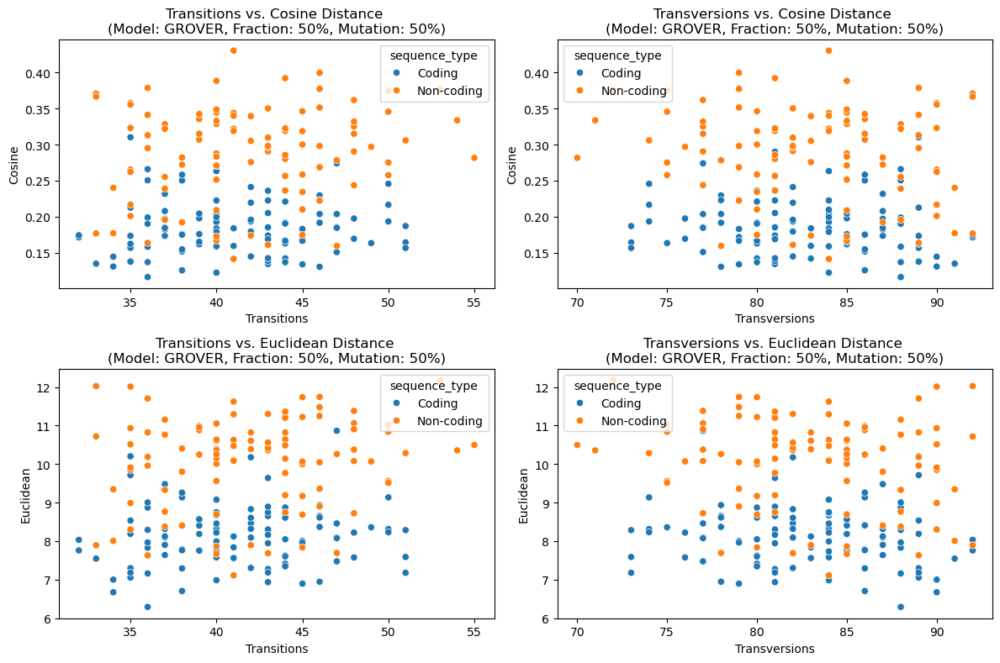


Now doing model: NT500M



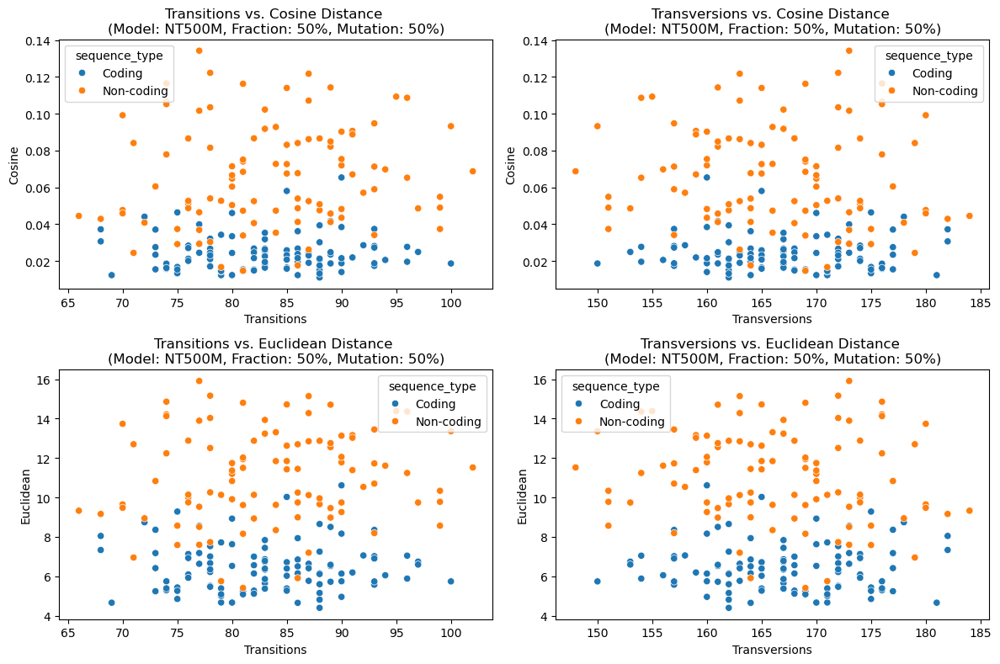


Now doing model: NT2.5B-MS



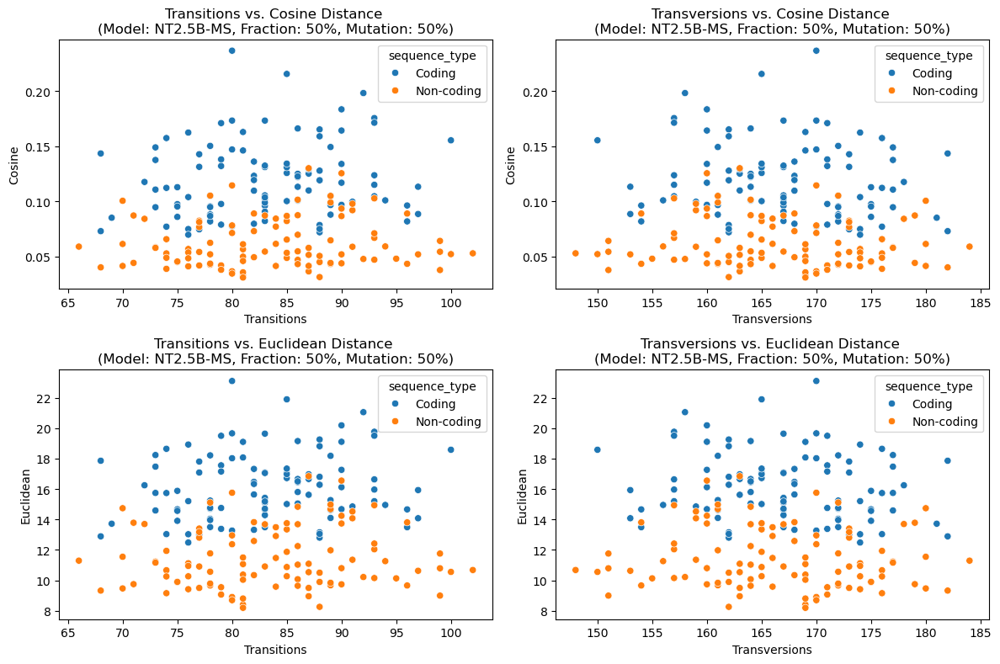


Now doing model: NT2.5B-1K



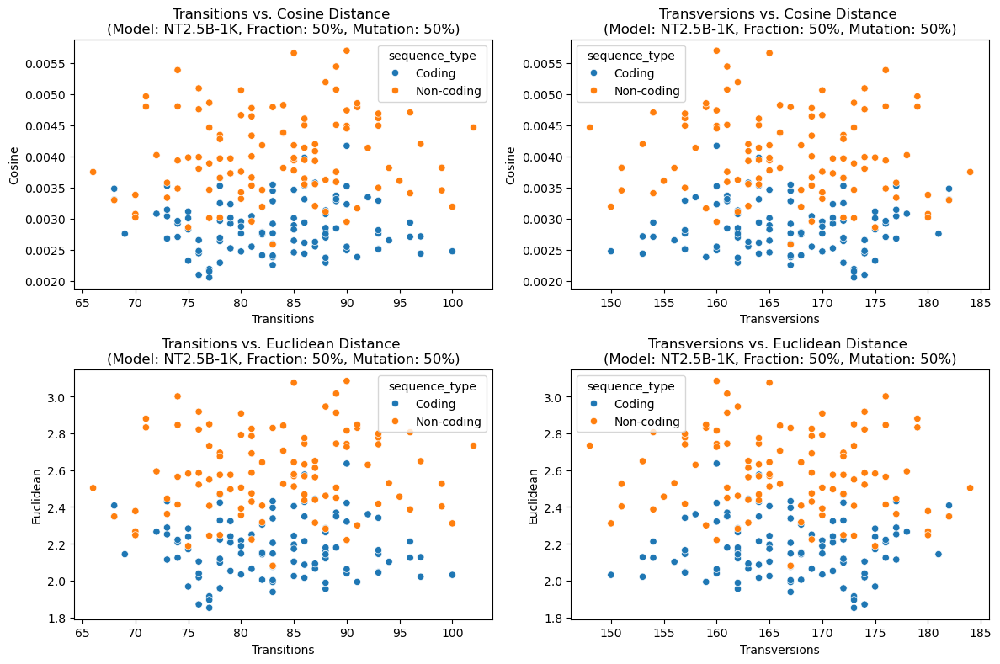


Now doing model: DNABERT-S



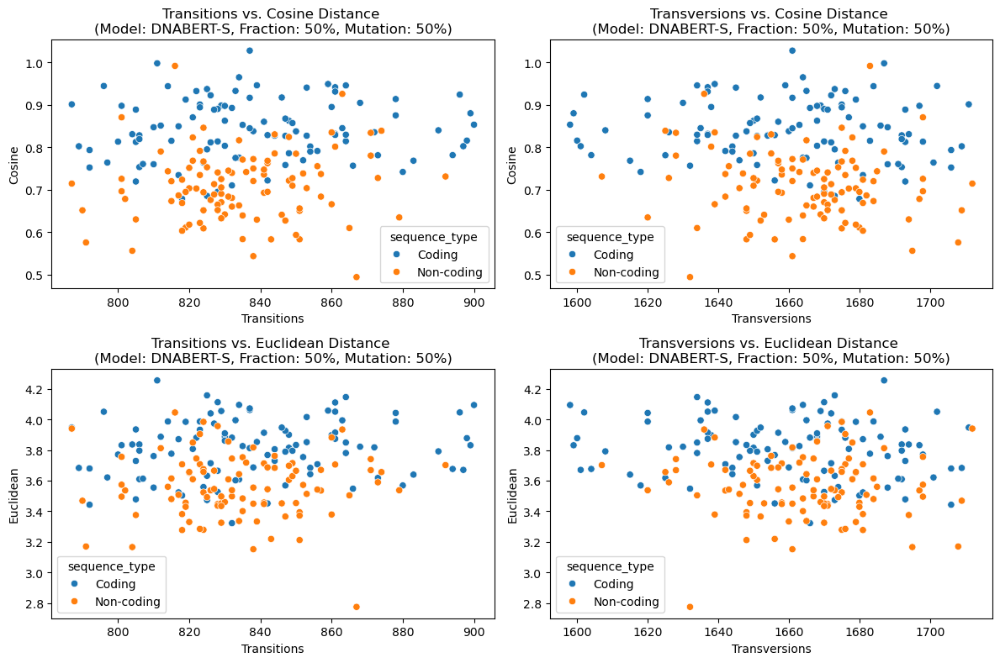


Now doing model: GenaLM



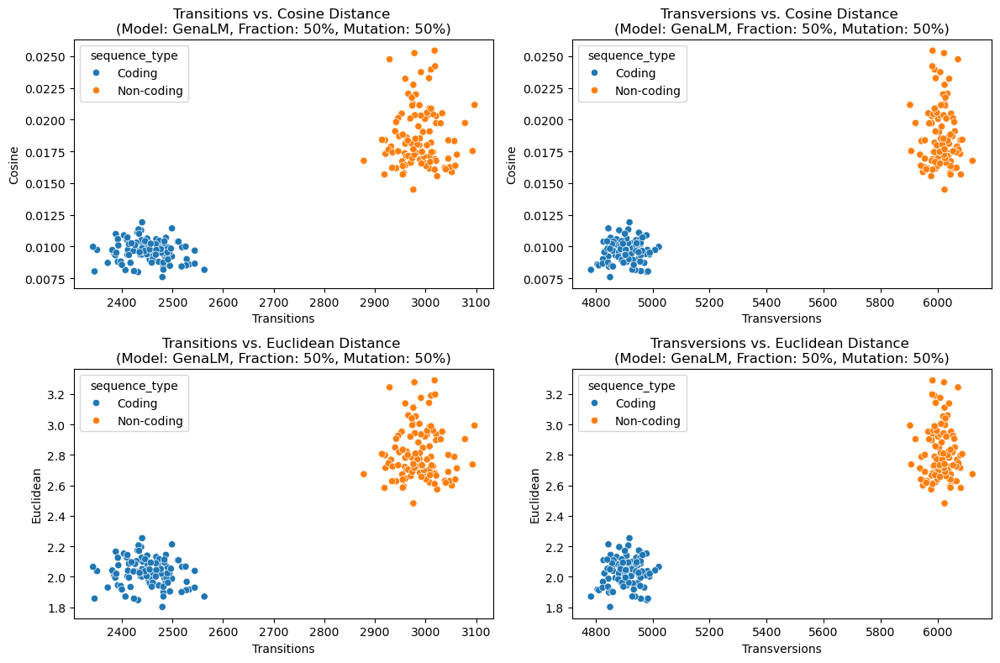


Now doing model: Hyena-1k



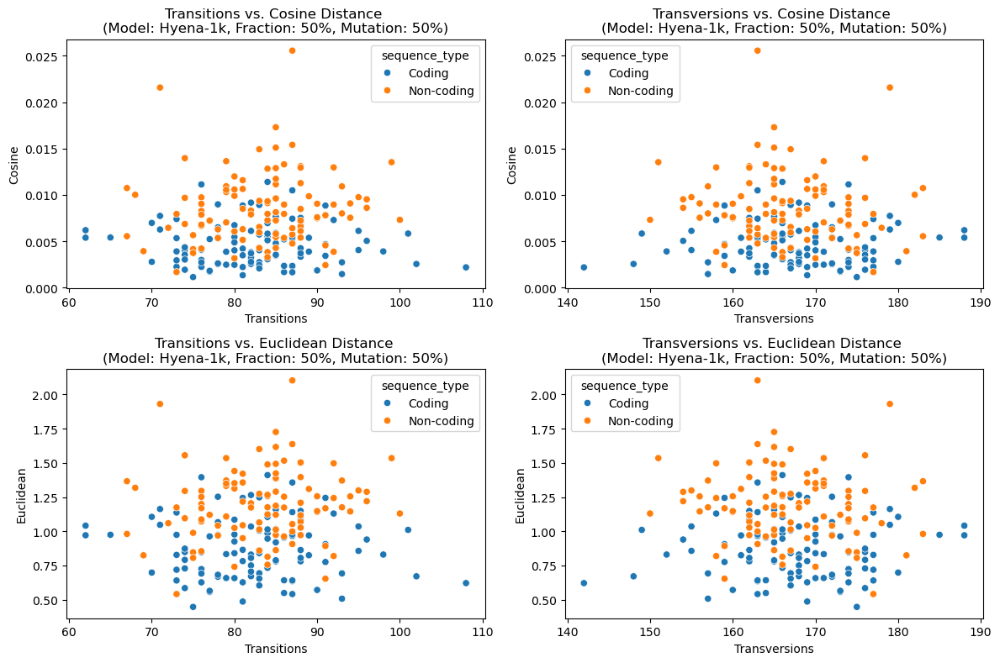


Now doing model: Hyena-16k



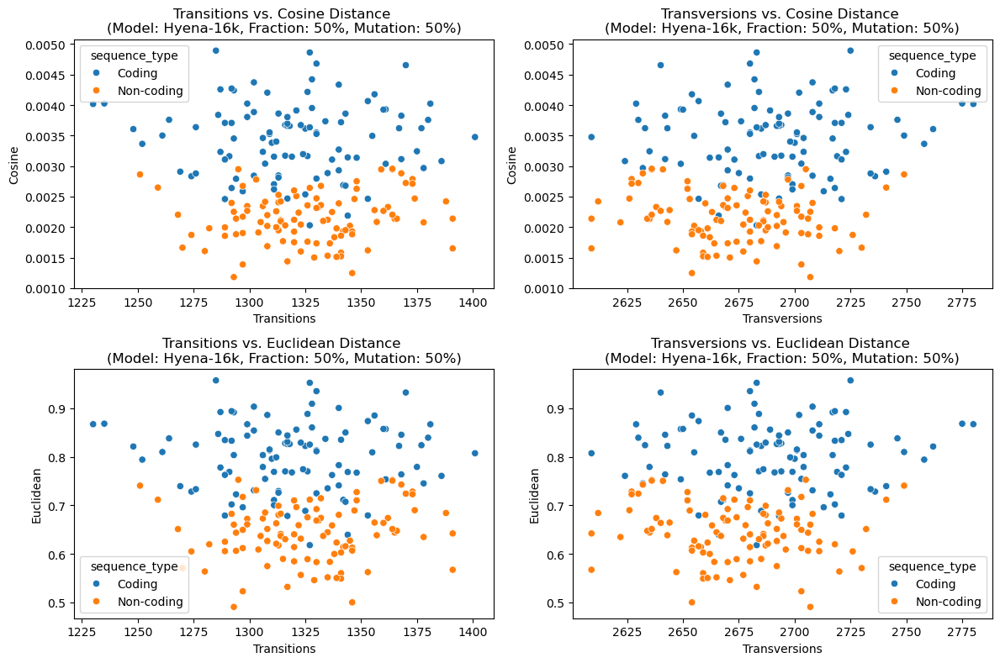


Now doing model: Hyena-32k



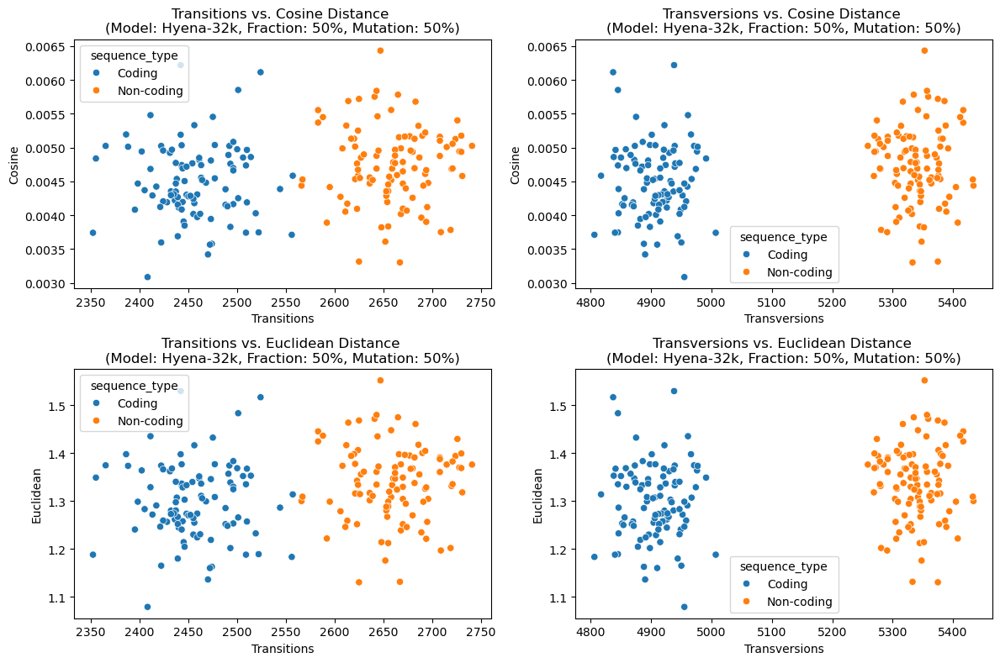


Now doing model: Hyena-160k



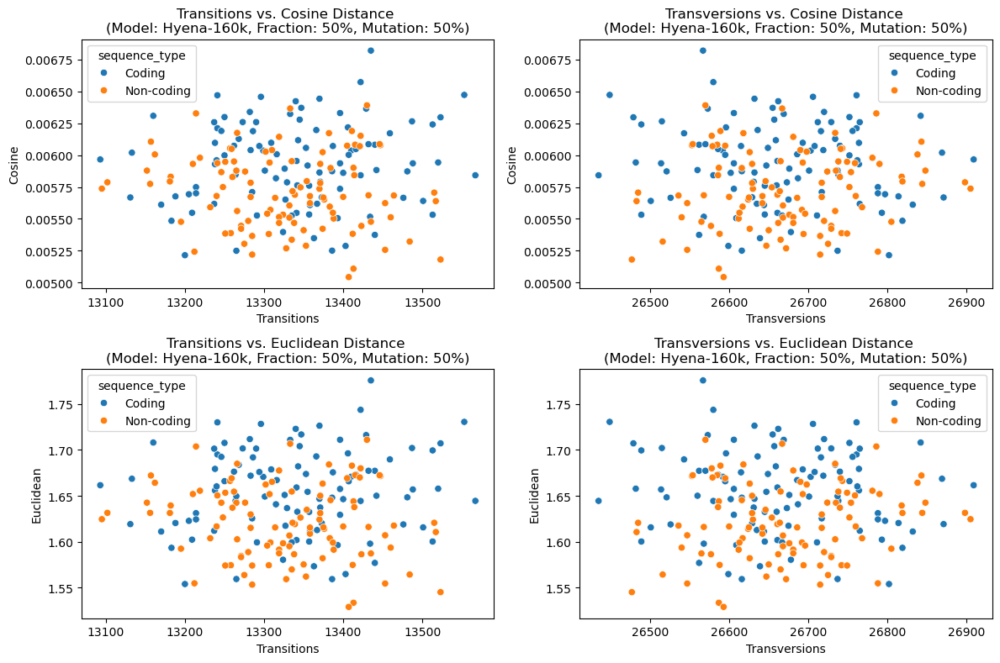


Now doing model: Hyena-450k



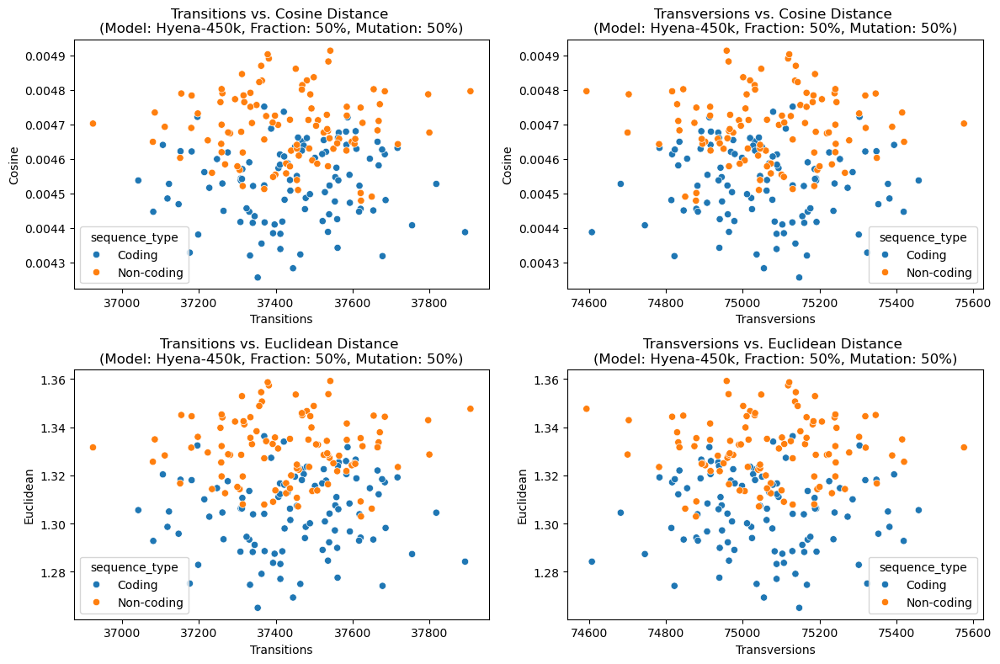


Now doing model: Hyena-1m



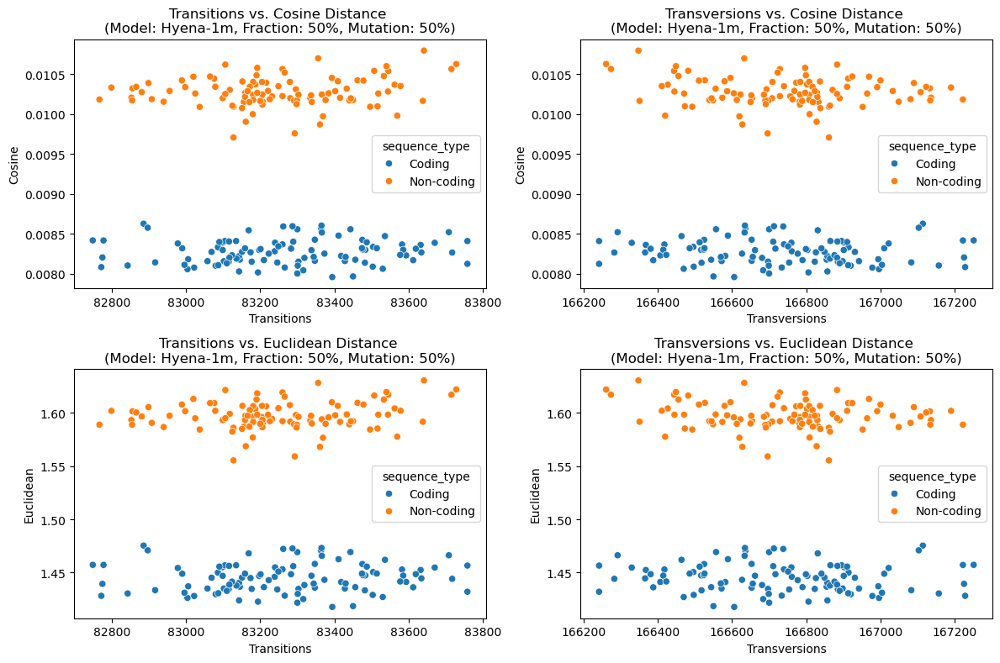

In [5]:
for model in models:
    print(f"\nNow doing model: {model}\n")
    mutTypeVariation(model, 50, 50)


### Seeing how the distance varies with transition/transversion ratio
Here, I wanted to see if the embeddings were more responsive to one type of mutation over another. Basically; <br>
get transition/transversion ratio for each seq and color accordingly; plot their distances<br>
x axis --> ratio; origin = 1; +x direction ==> more transitions and -x direction ==> more transversions<br>
y axis --> cosine/euclidean distance of the sequences.<br><br>
Observation: There are more transversions than transitions on average (ratio is around 0.3- 0.6 mostly), but since that's completely dependent on the original sequence's composition, I don't think we can really infer much. Doesn't seem to be any variation in either of the distances as the ratio changes; they're at a consistent distance throughout the ratio. Looks like there isn't any particular effect of having more transversions than transitions & vice versa!

In [9]:
def mutTypeRatioAnalysis(model, x, fraction):
    filtered_df = df[
        (df["model"] == model) &
        (df["fraction"] == fraction) &
        (df["mut_percentage"] == x)
    ].copy()

    filtered_df["trans_ratio"] = filtered_df["Transitions"] / filtered_df["Transversions"]

    fig, ax = plt.subplots(1, 2, figsize=(12, 6))

    sns.scatterplot(data=filtered_df, x="trans_ratio", y="Cosine", hue="sequence_type", style="sequence_type", ax=ax[0])
    #ax[0].axvline(1, color='black', linestyle='--', linewidth=1)  # Here, number of transitions = number of transversions.
    ax[0].set_title(f"Effect of Transitions/Transversions Ratio on Cosine Distance\n(Model: {model}, Fraction: {fraction}%, Mutation: {x}%)")
    ax[0].set_xlabel("Transitions/Transversions Ratio")
    ax[0].set_ylabel("Cosine Distance")

    sns.scatterplot(data=filtered_df, x="trans_ratio", y="Euclidean", hue="sequence_type", style="sequence_type", ax=ax[1])
    #ax[1].axvline(1, color='black', linestyle='--', linewidth=1)  # Here, number of transitions = number of transversions.
    ax[1].set_title(f"Effect of Transitions/Transversions Ratio on Euclidean Distance\n(Model: {model}, Fraction: {fraction}%, Mutation: {x}%)")
    ax[1].set_xlabel("Transitions/Transversions Ratio")
    ax[1].set_ylabel("Euclidean Distance")

    plt.tight_layout()
    plt.show()


Now doing model: DNABERT-2



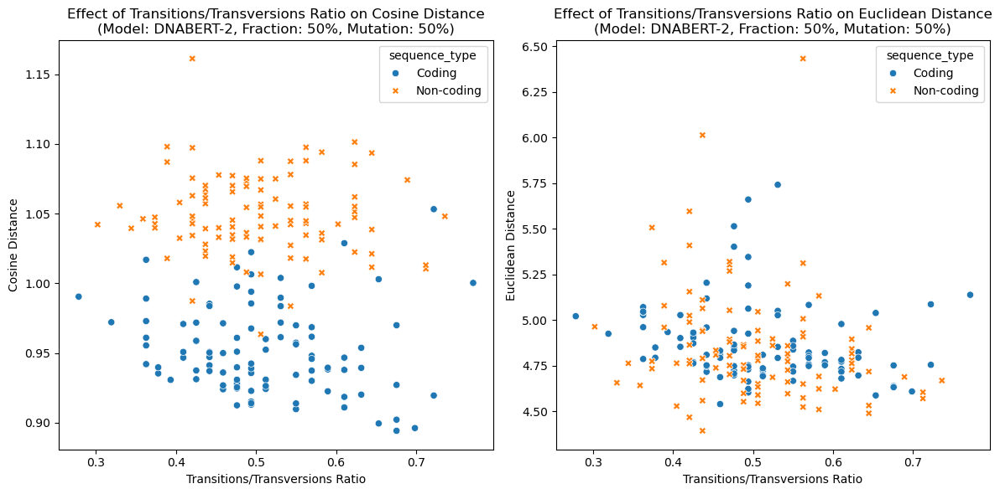


Now doing model: GPN



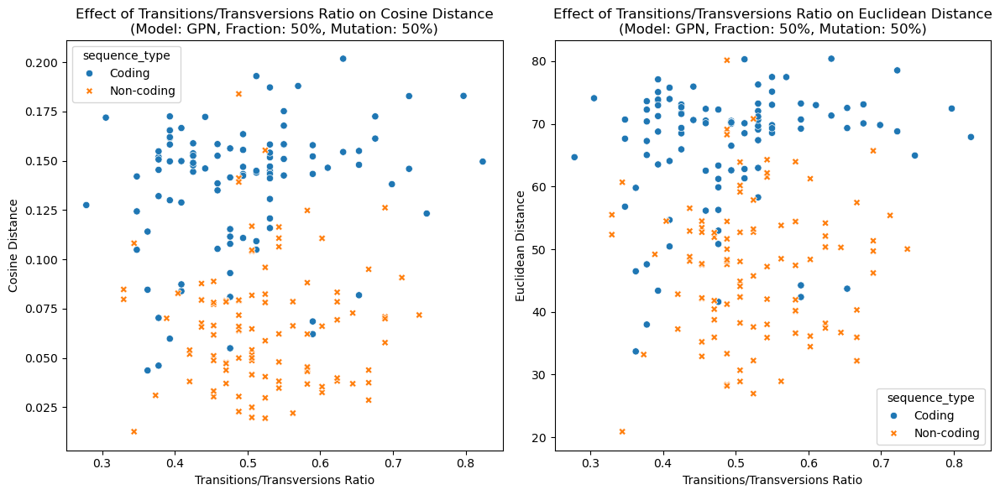


Now doing model: GROVER



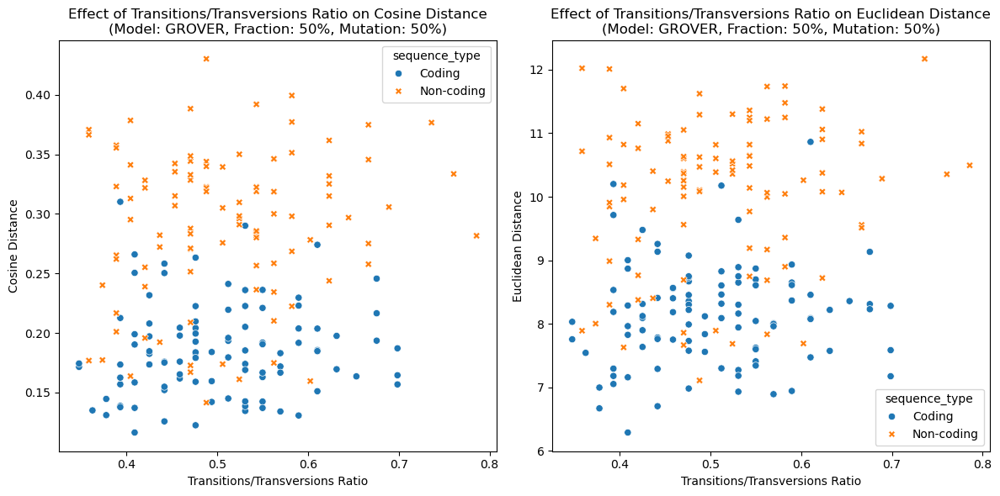


Now doing model: NT500M



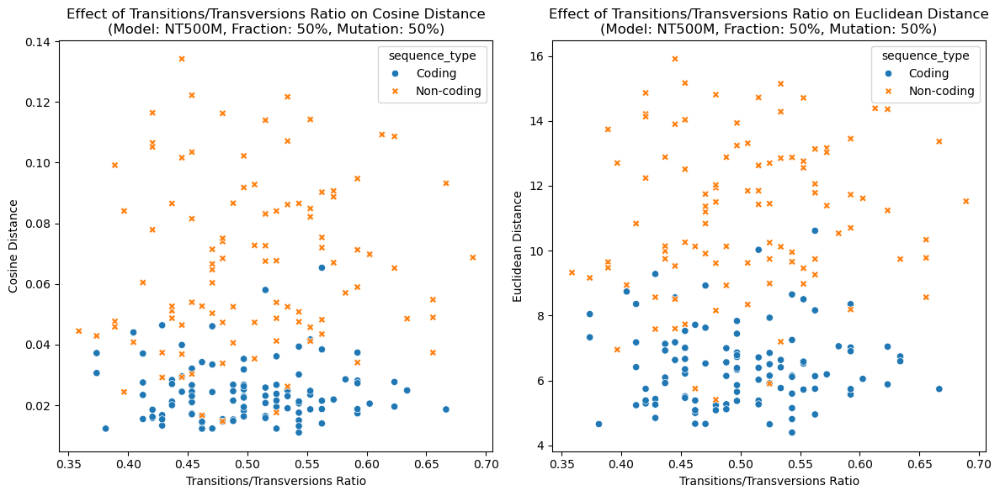


Now doing model: NT2.5B-MS



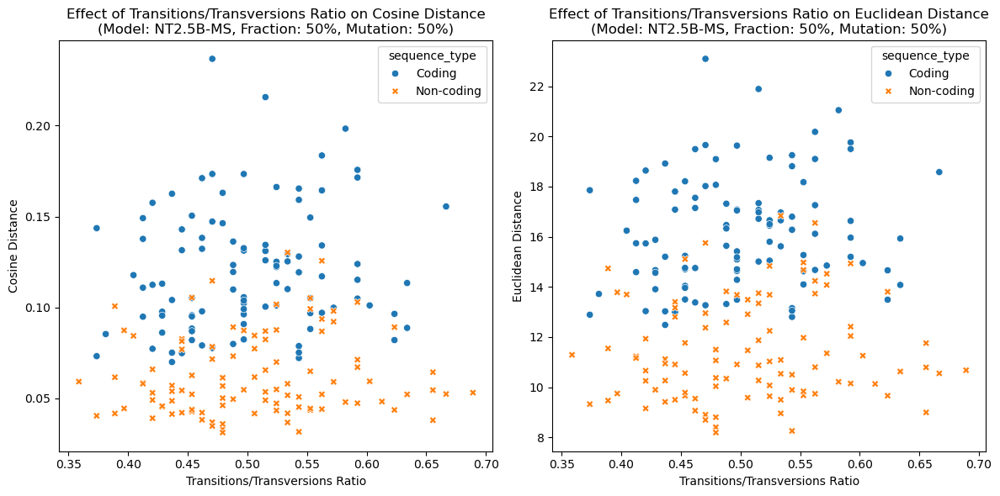


Now doing model: NT2.5B-1K



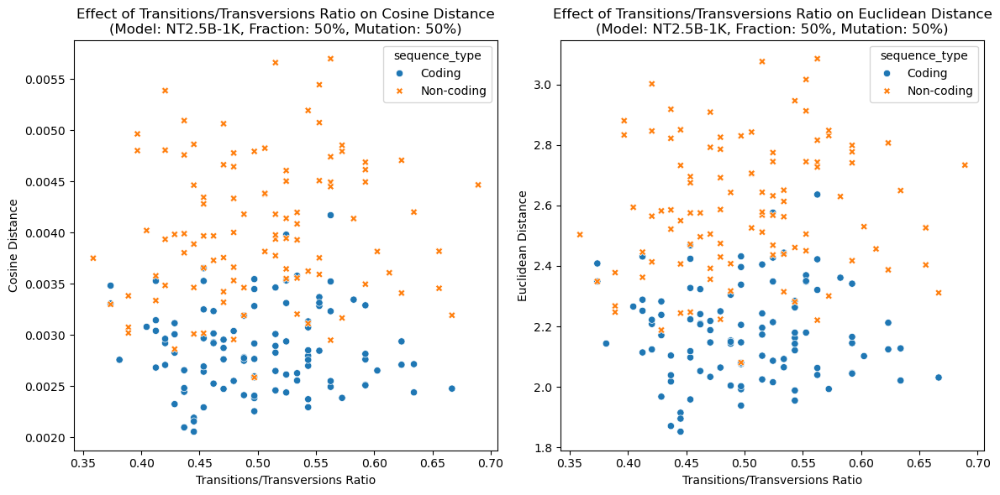


Now doing model: DNABERT-S



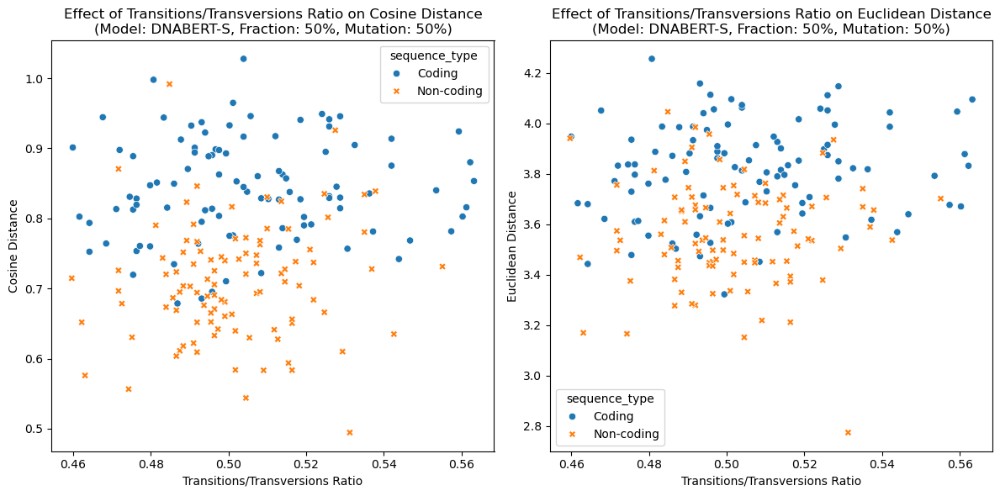


Now doing model: GenaLM



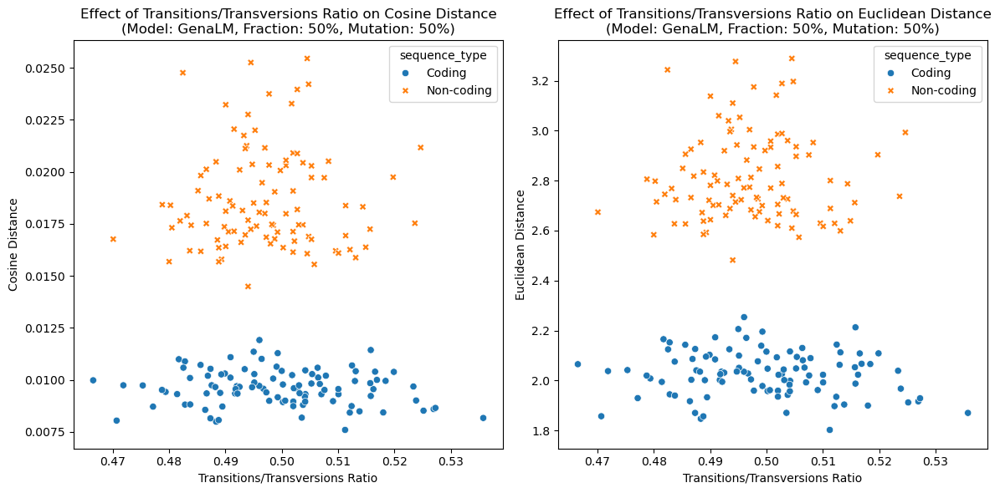


Now doing model: Hyena-1k



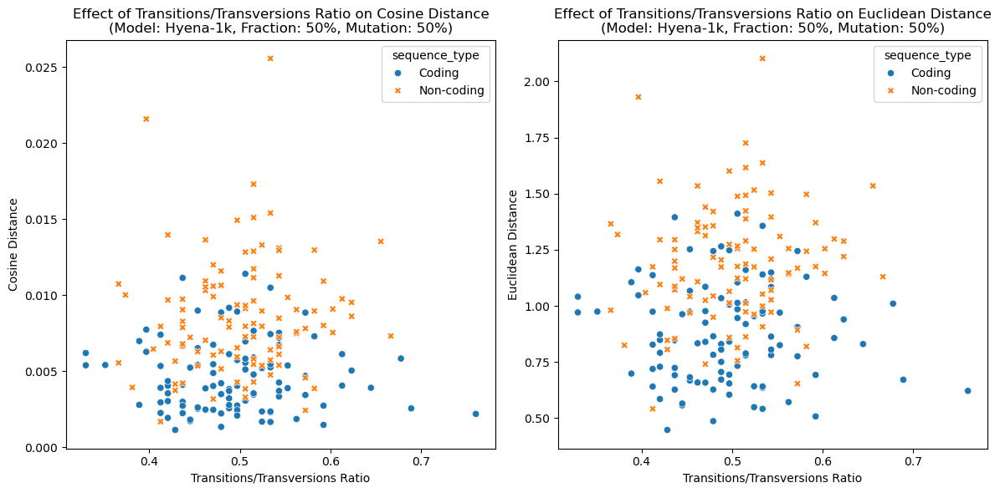


Now doing model: Hyena-16k



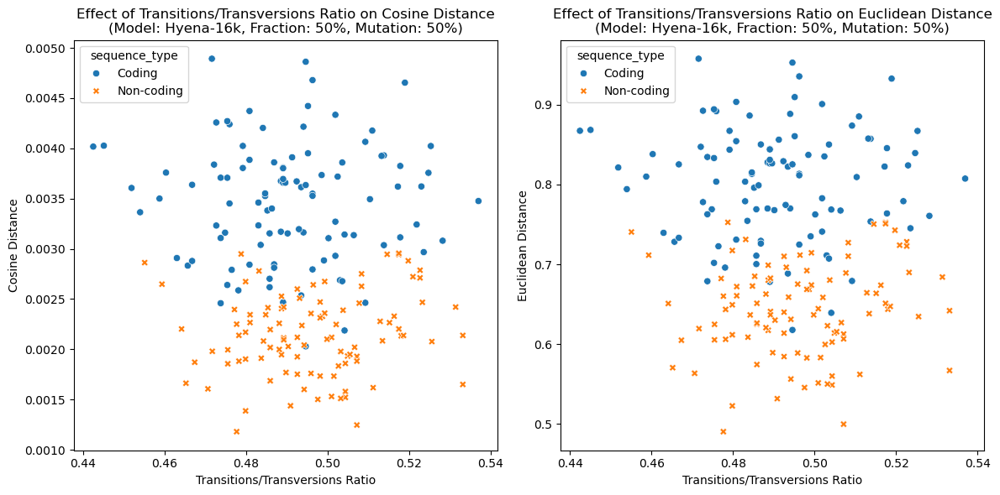


Now doing model: Hyena-32k



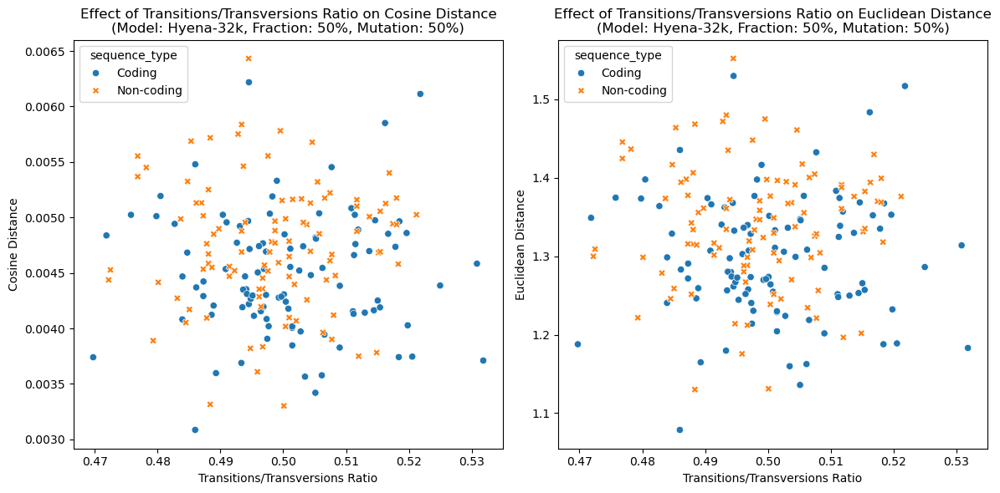


Now doing model: Hyena-160k



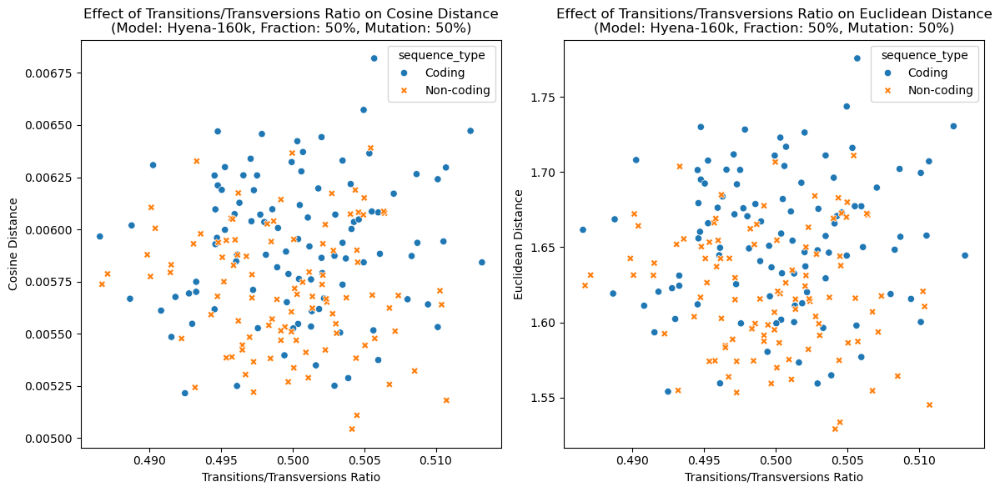


Now doing model: Hyena-450k



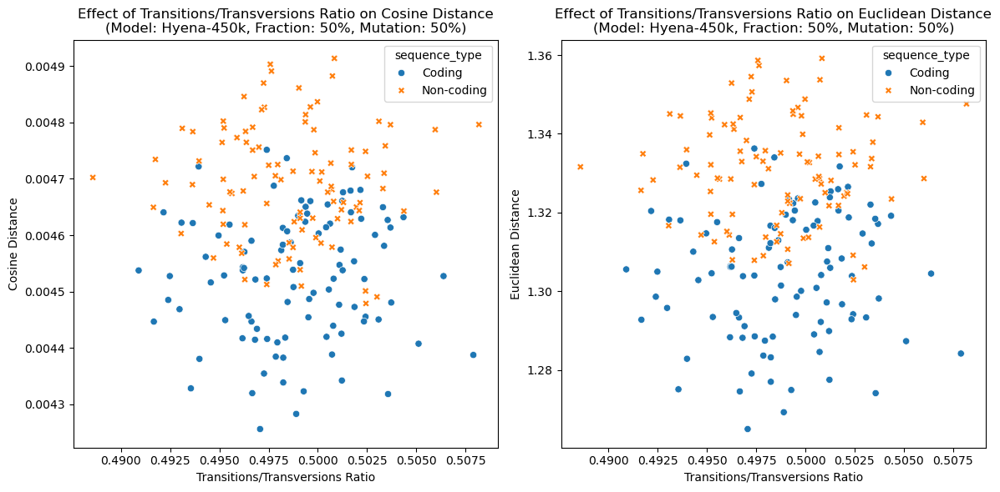


Now doing model: Hyena-1m



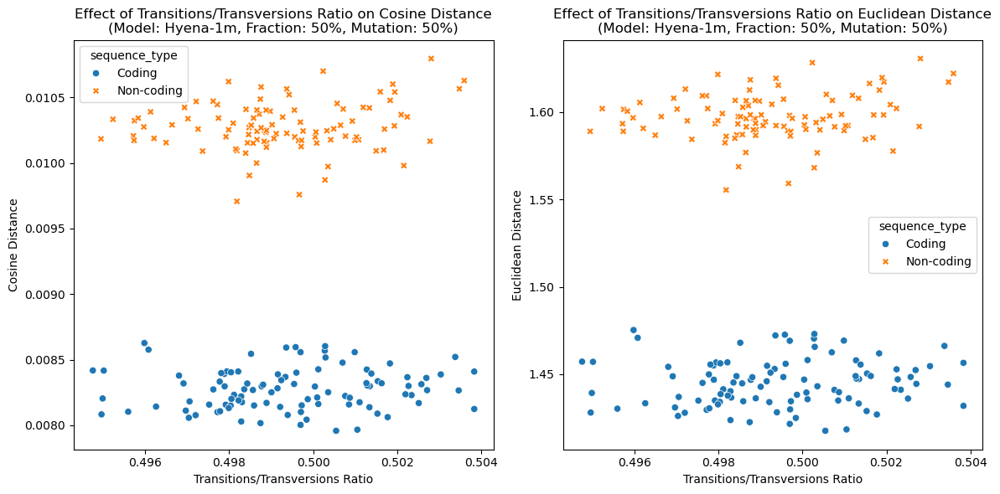

In [10]:
for model in models:
    print(f"\nNow doing model: {model}\n")
    mutTypeRatioAnalysis(model, 50, 50)

## 2. Variation with Nucleotide Composition

Similar thing with above; do ratio between new and old counts; plot variation in distancs with this ratio.
Go NT wise - see change in each sequence wrt a specific NT

In [13]:
def NTspecificVariation(model, x, fraction, distance_type):
    # Define function for plotting
    fig, axes = plt.subplots(2, 2, figsize=(14, 10))

    filtered_df = df[(df["model"] == model) & (df["mut_percentage"] == x) & (df["fraction"] == fraction)].copy()
    filtered_df["A_ratio"] = filtered_df["new_A_count"] / filtered_df["old_A_count"]
    filtered_df["T_ratio"] = filtered_df["new_T_count"] / filtered_df["old_T_count"]
    filtered_df["C_ratio"] = filtered_df["new_C_count"] / filtered_df["old_C_count"]
    filtered_df["G_ratio"] = filtered_df["new_G_count"] / filtered_df["old_G_count"]


    nucleotides = ['A', 'T', 'C', 'G']
    for i, nucleotide in enumerate(nucleotides):
        row, col = divmod(i, 2)
        sns.scatterplot(
            data=filtered_df,
            x=f"{nucleotide}_ratio",
            y=distance_type,
            hue="sequence_type",
            style="sequence_type",
            ax=axes[row][col]
        )
        axes[row][col].axvline(1, color='black', linestyle='--', linewidth=1)  # Mark x=1
        axes[row][col].set_title(f"Effect of {nucleotide}-count Ratio on {distance_type} Distance")
        axes[row][col].set_xlabel(f"New {nucleotide} / Old {nucleotide} Ratio")
        axes[row][col].set_ylabel(f"{distance_type} Distance")

    plt.suptitle(f"Impact of Nucleotide Changes on {distance_type} Distance\n(Model: {model}, Fraction: {fraction}%, Mutation: {x}%)", fontsize=12)
    plt.tight_layout()
    plt.show()


Now doing model: DNABERT-2



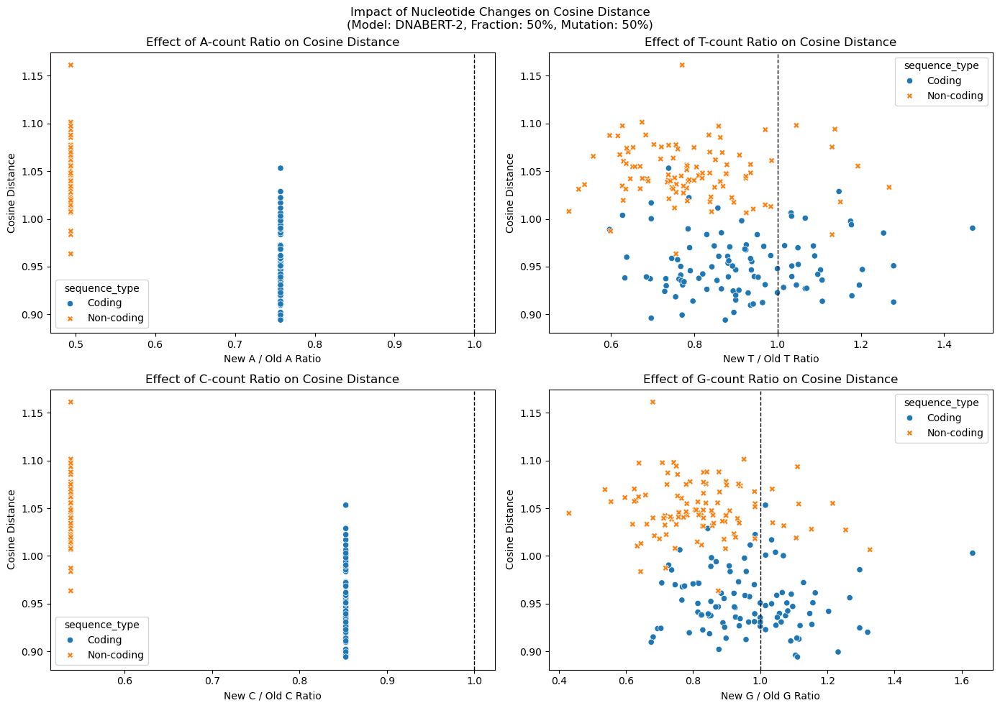

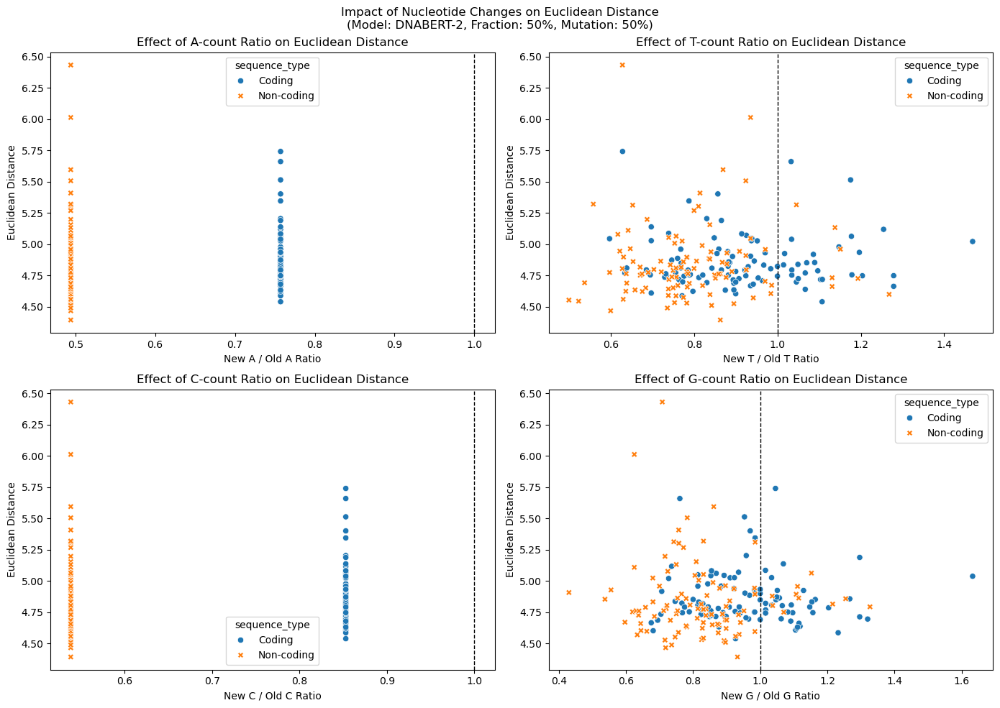


Now doing model: GPN



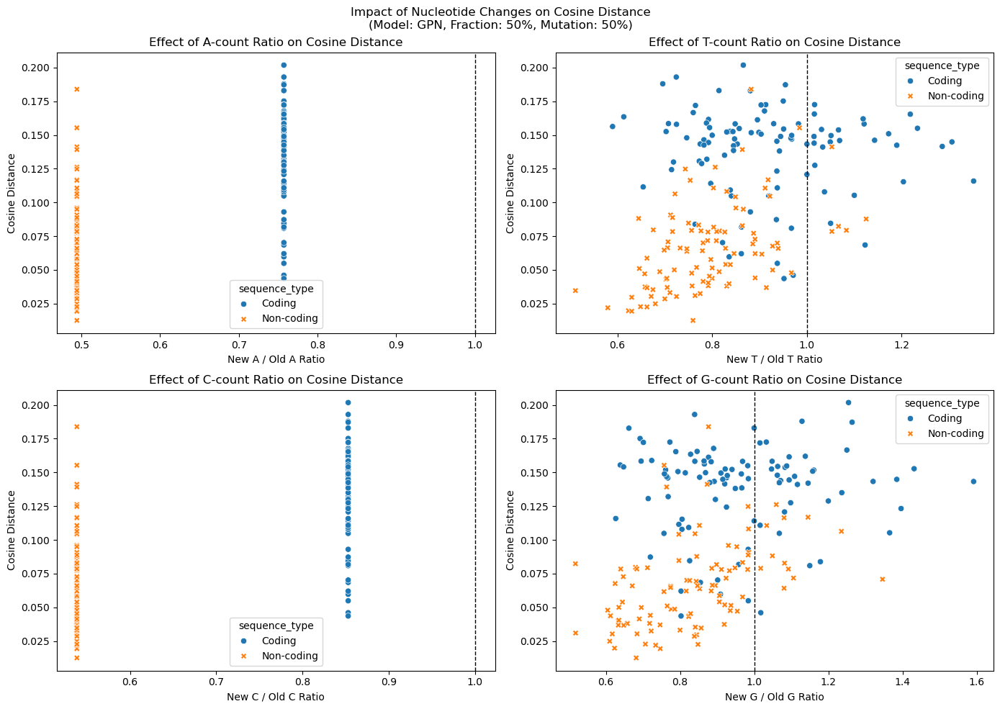

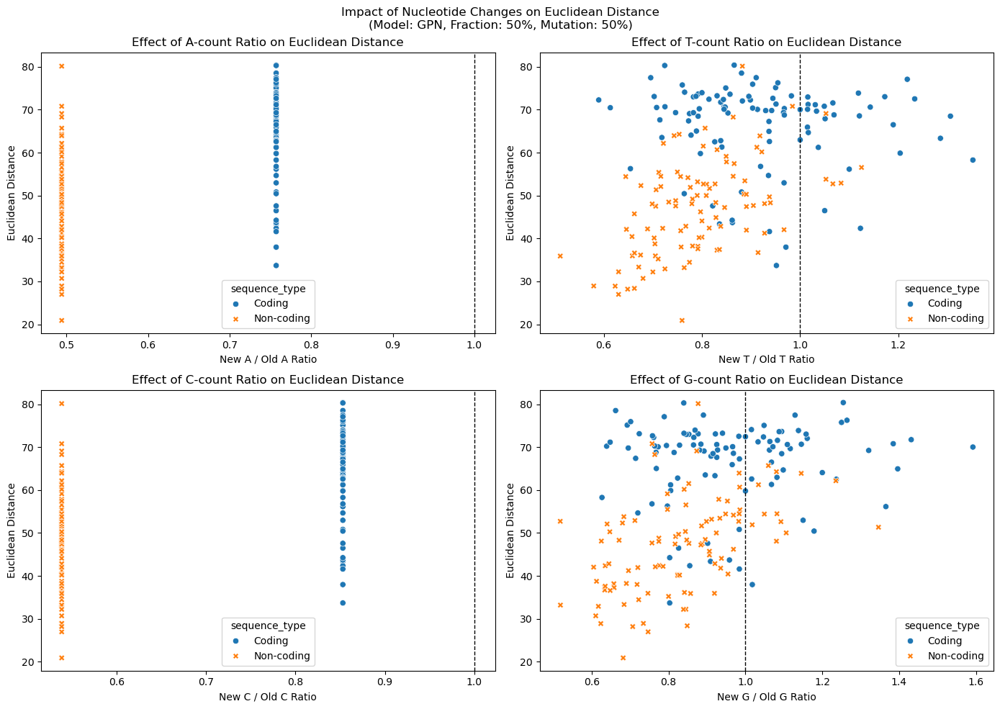


Now doing model: GROVER



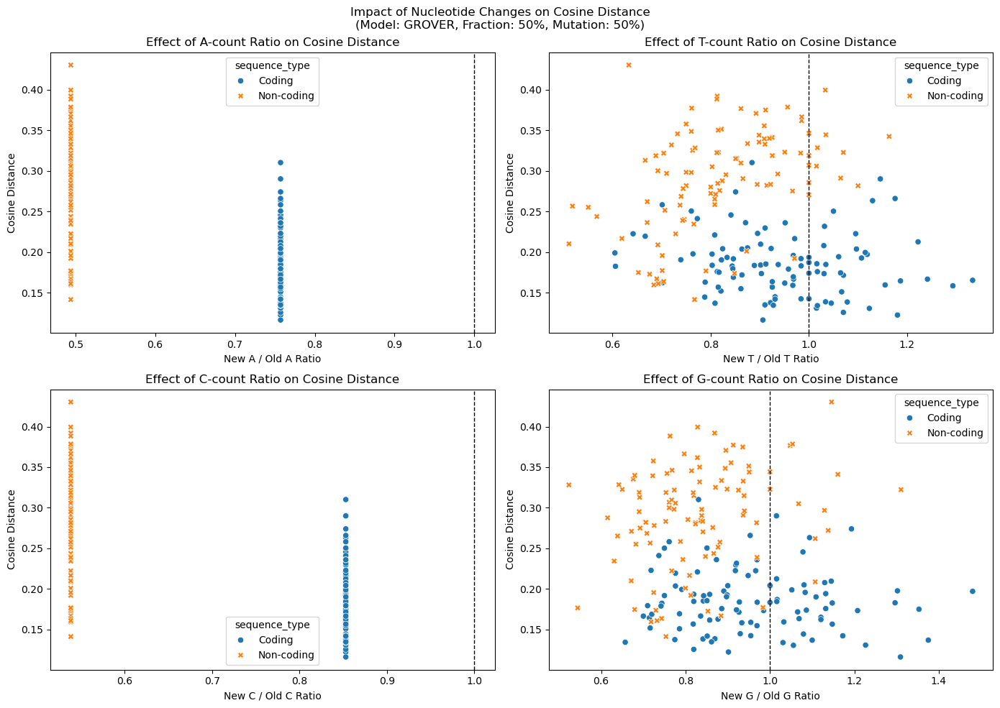

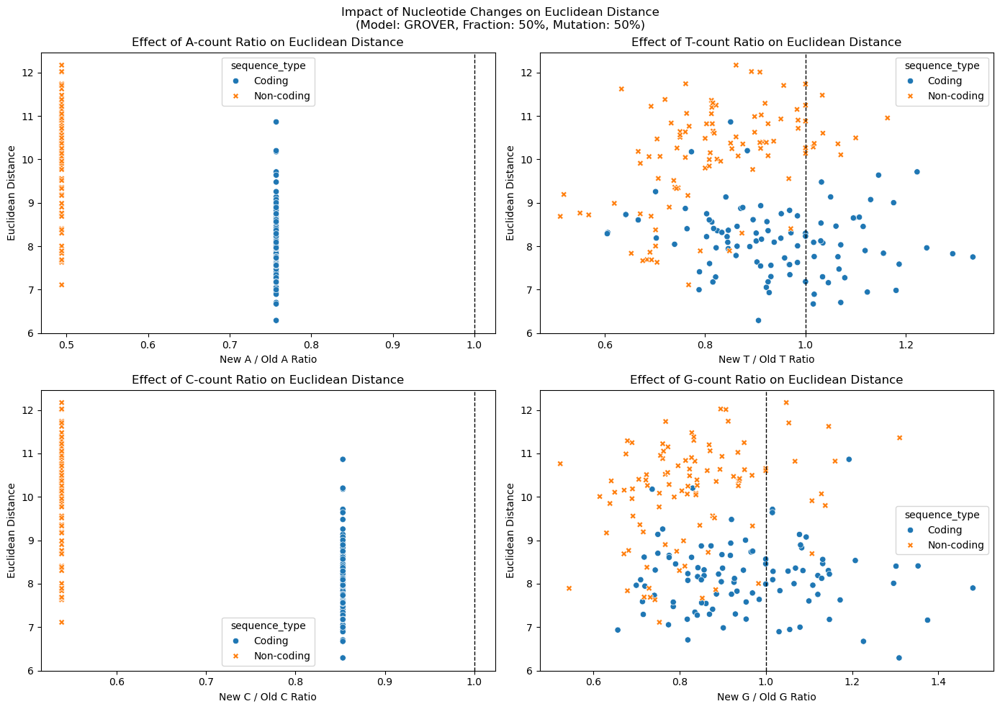


Now doing model: NT500M



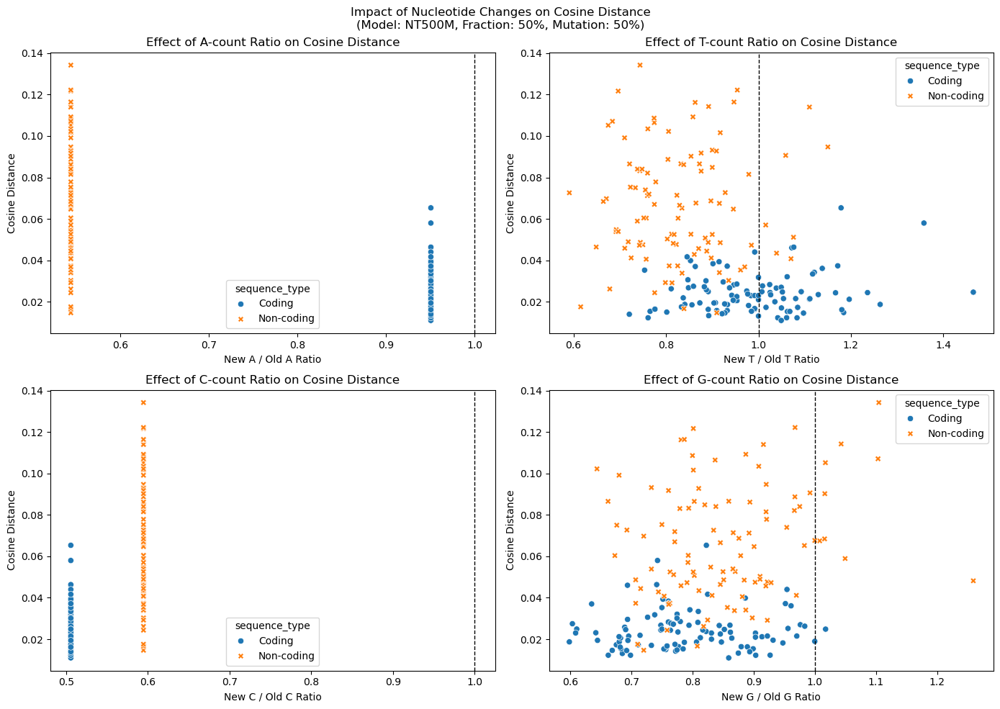

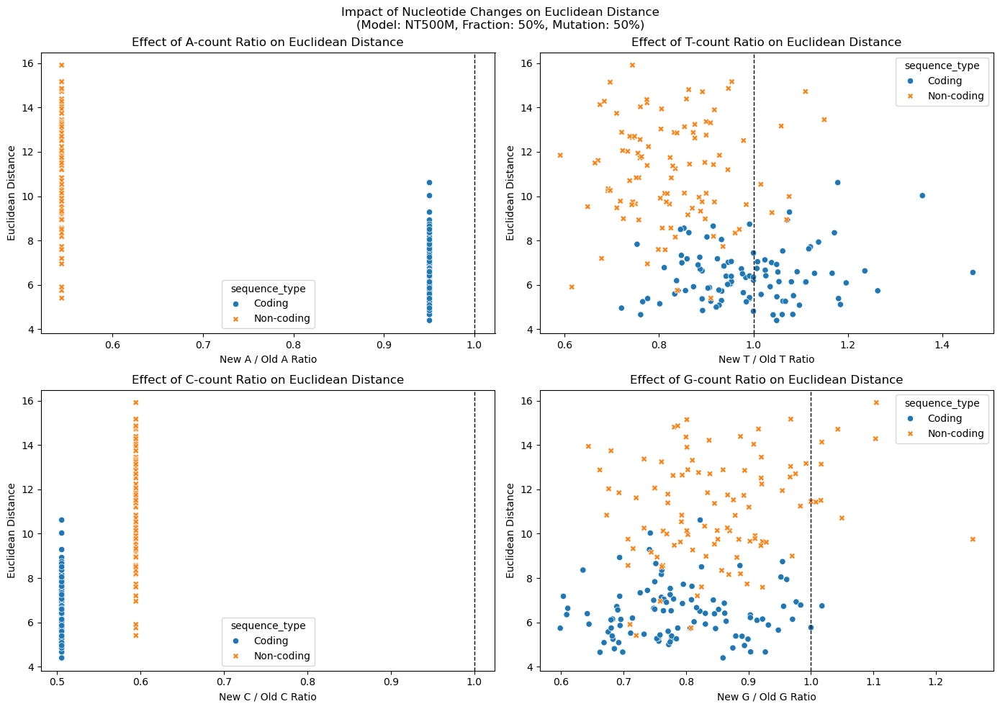


Now doing model: NT2.5B-MS



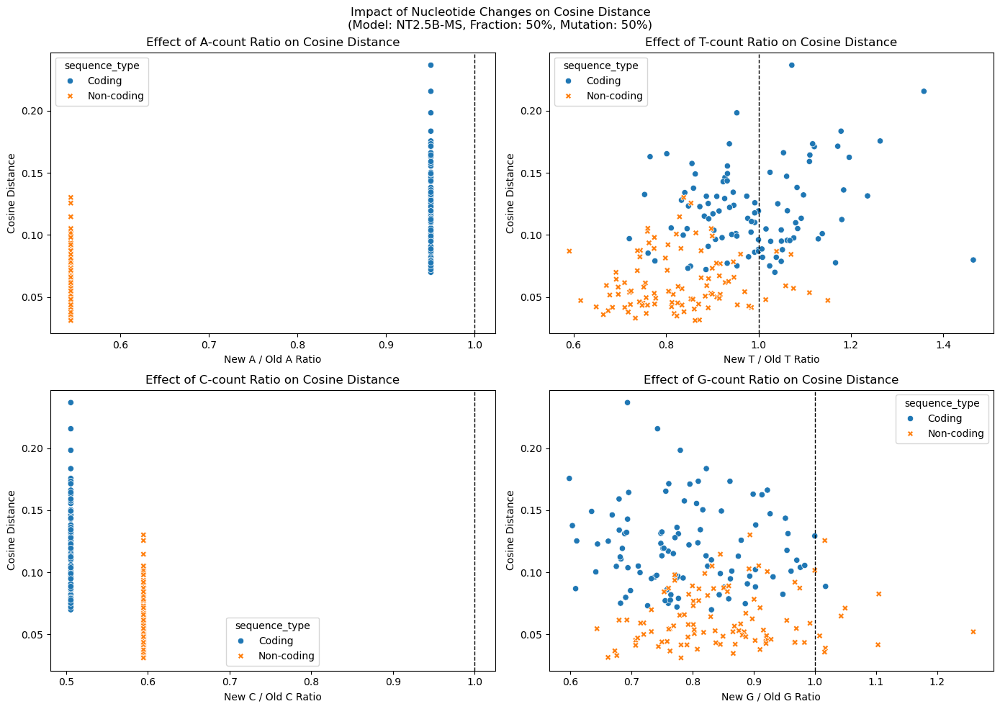

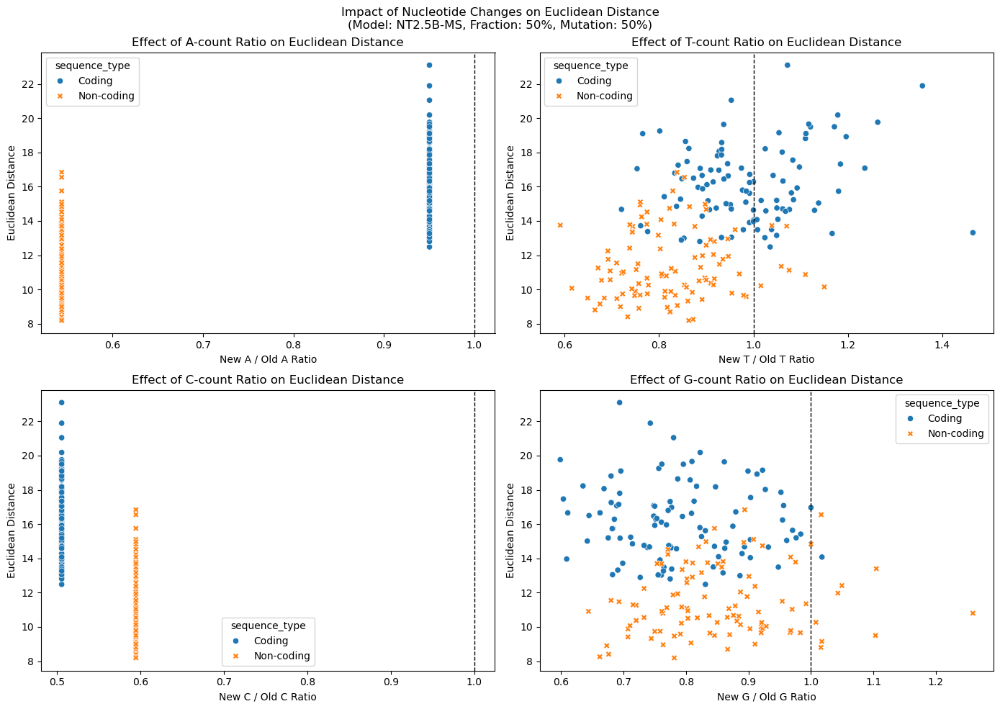


Now doing model: NT2.5B-1K



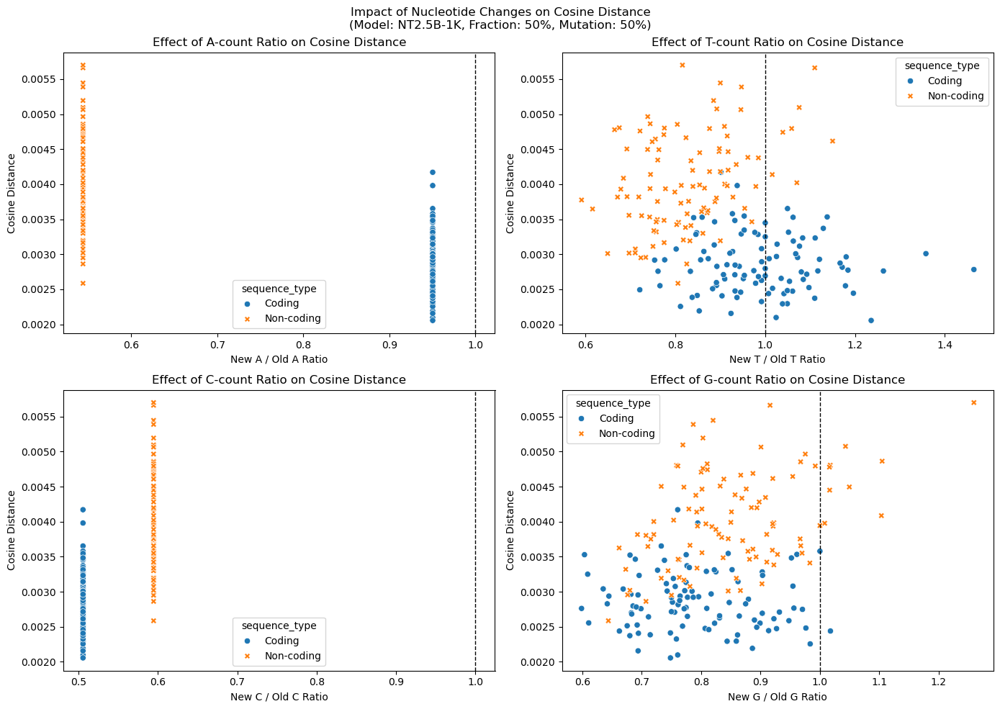

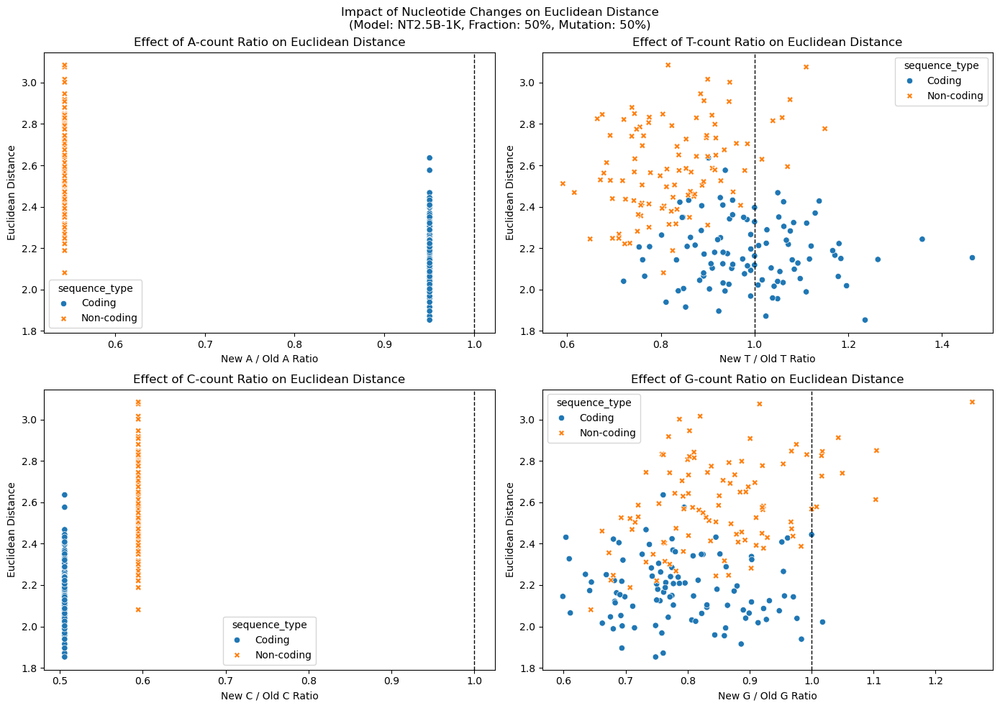


Now doing model: DNABERT-S



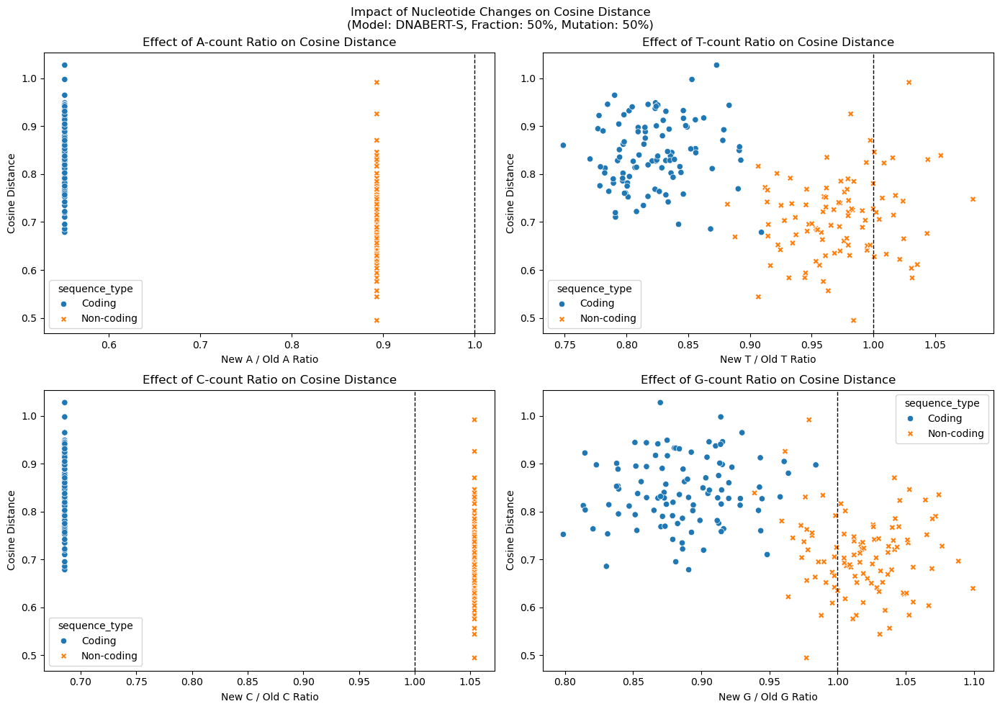

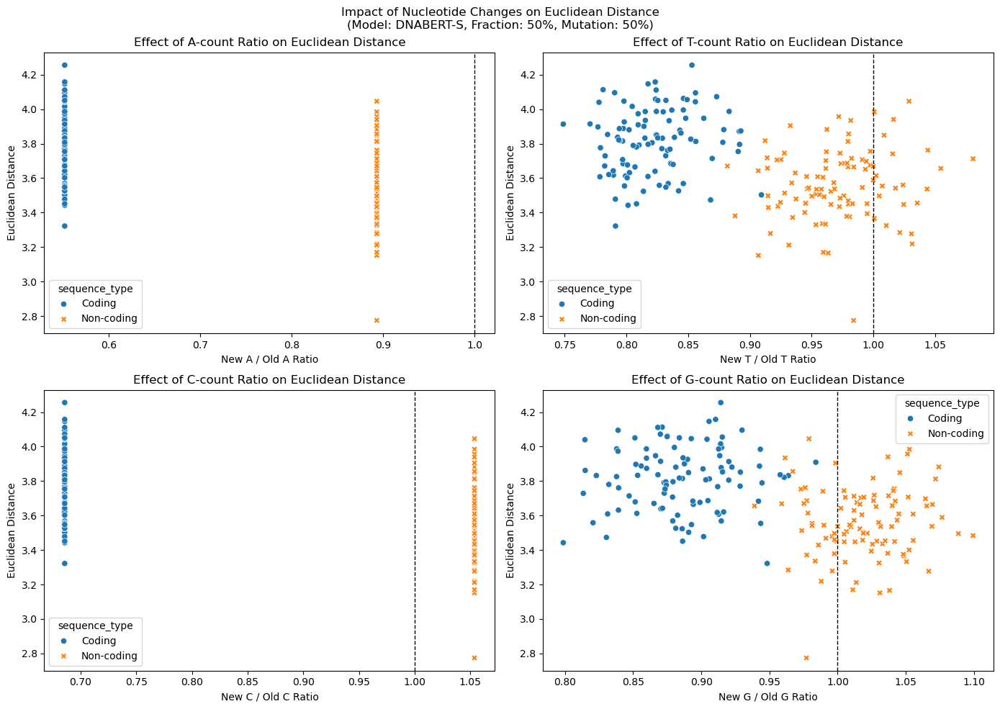


Now doing model: GenaLM



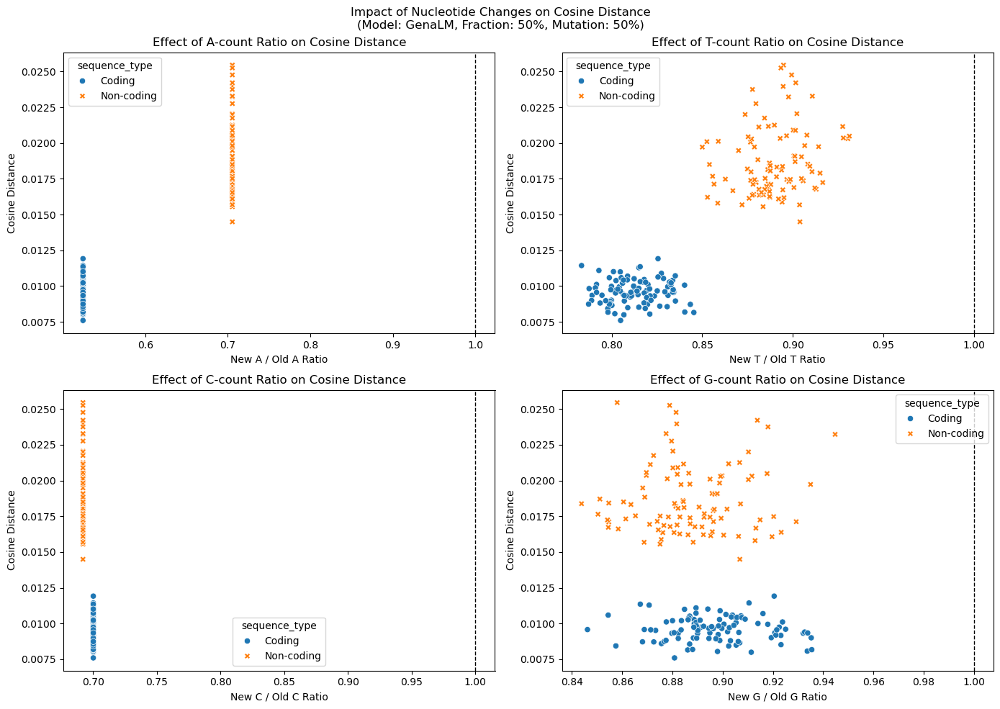

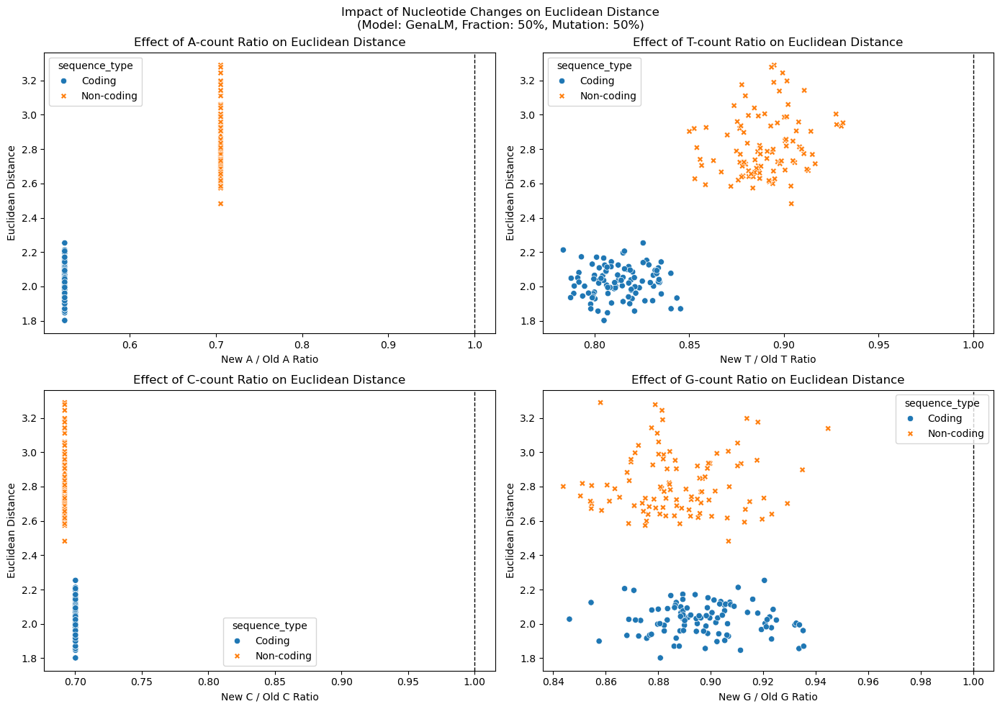


Now doing model: Hyena-1k



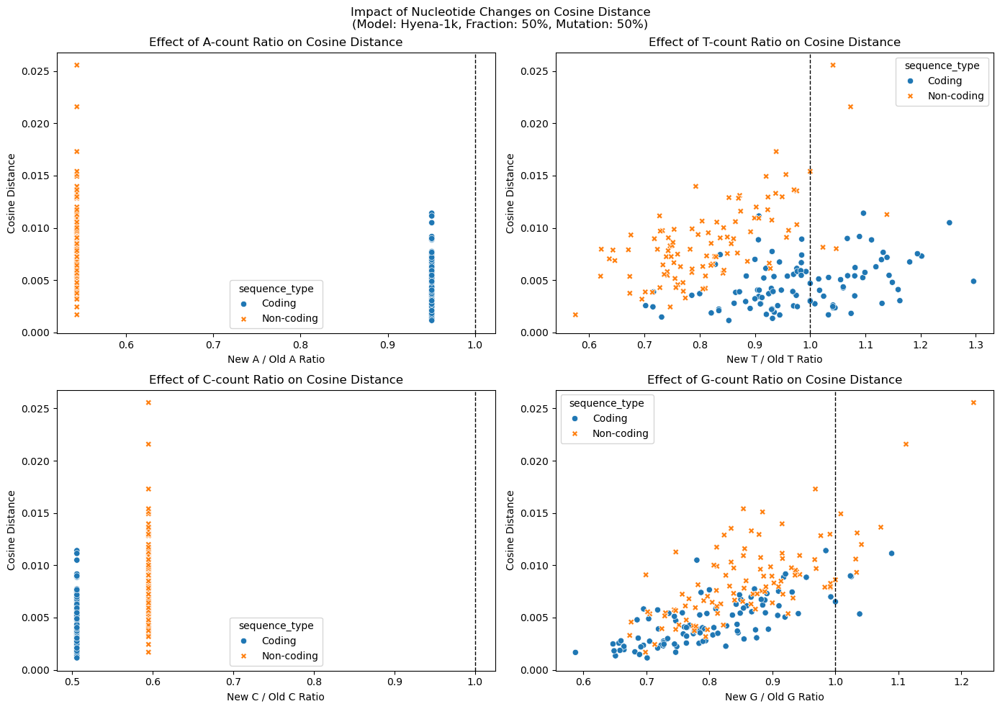

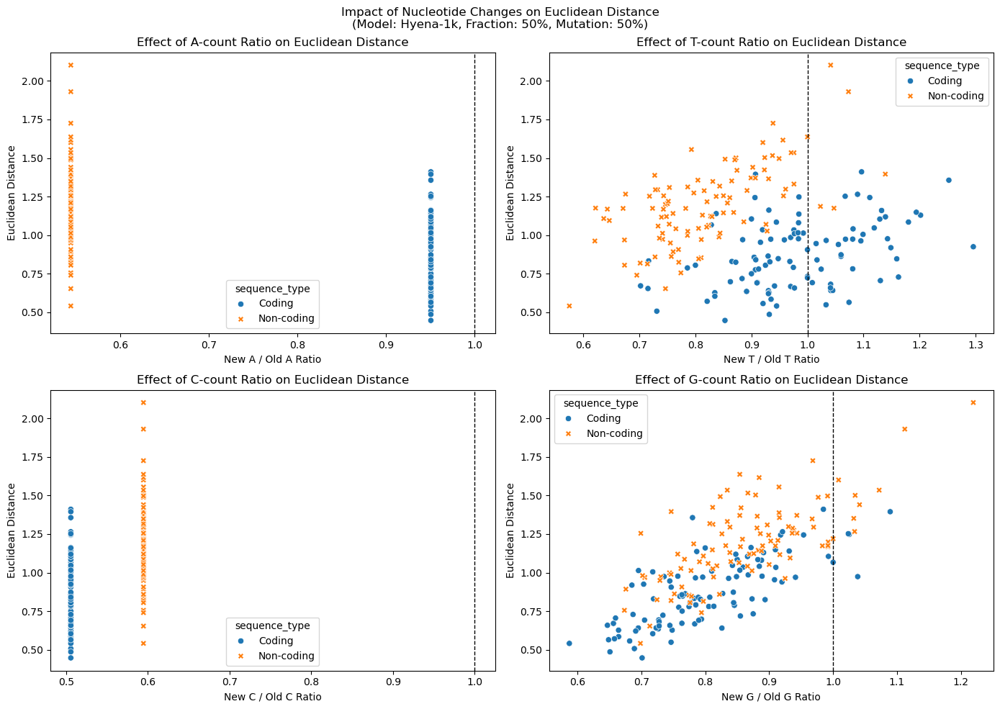


Now doing model: Hyena-16k



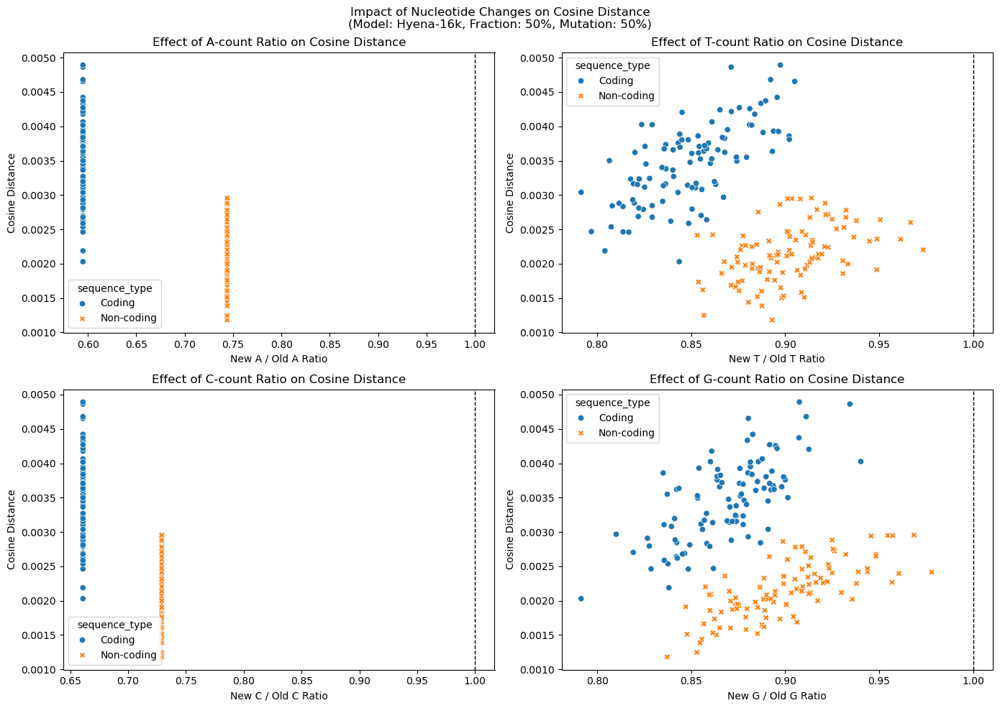

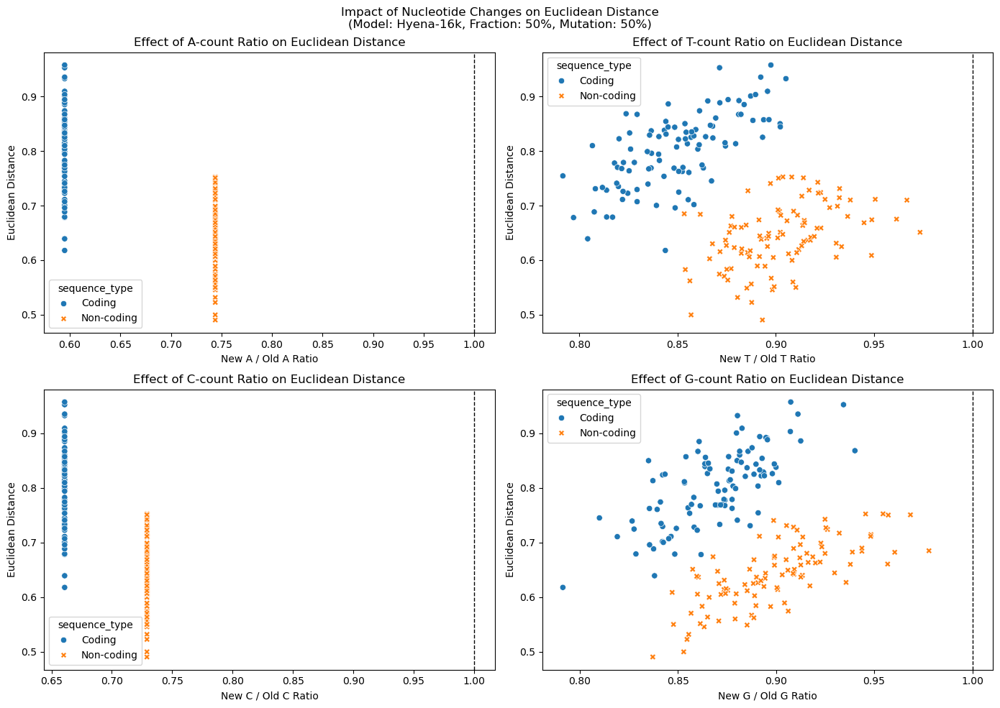


Now doing model: Hyena-32k



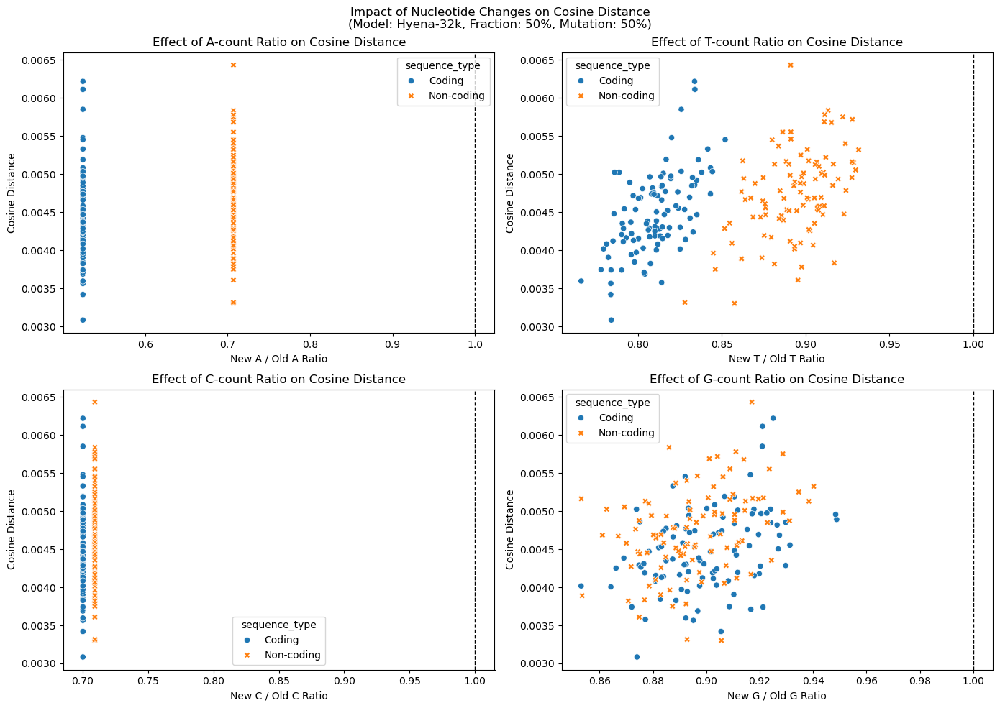

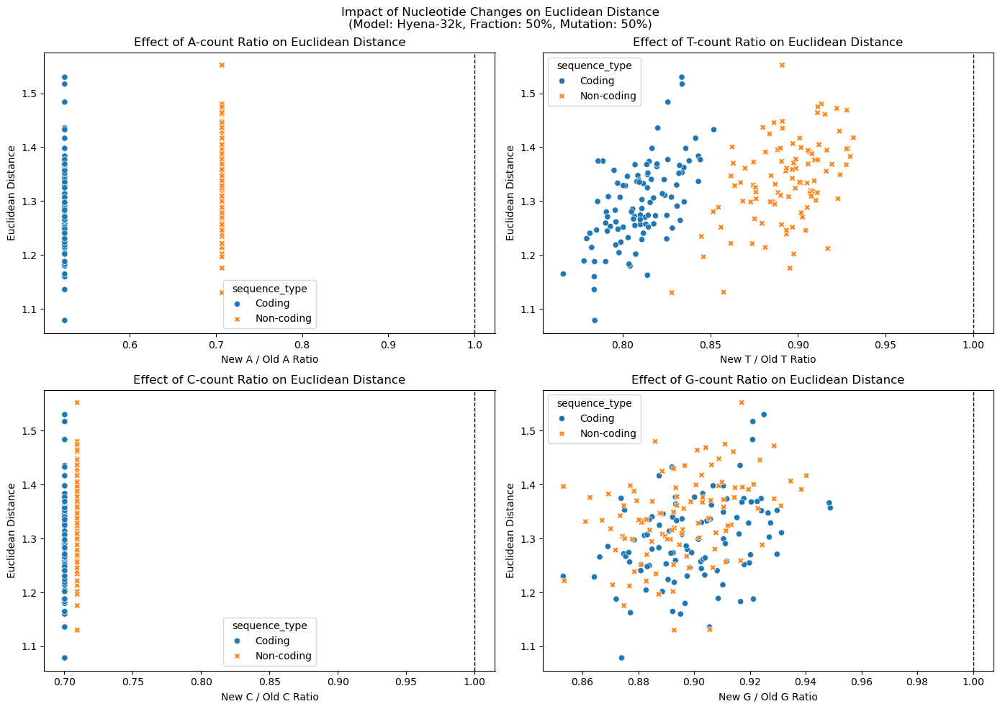


Now doing model: Hyena-160k



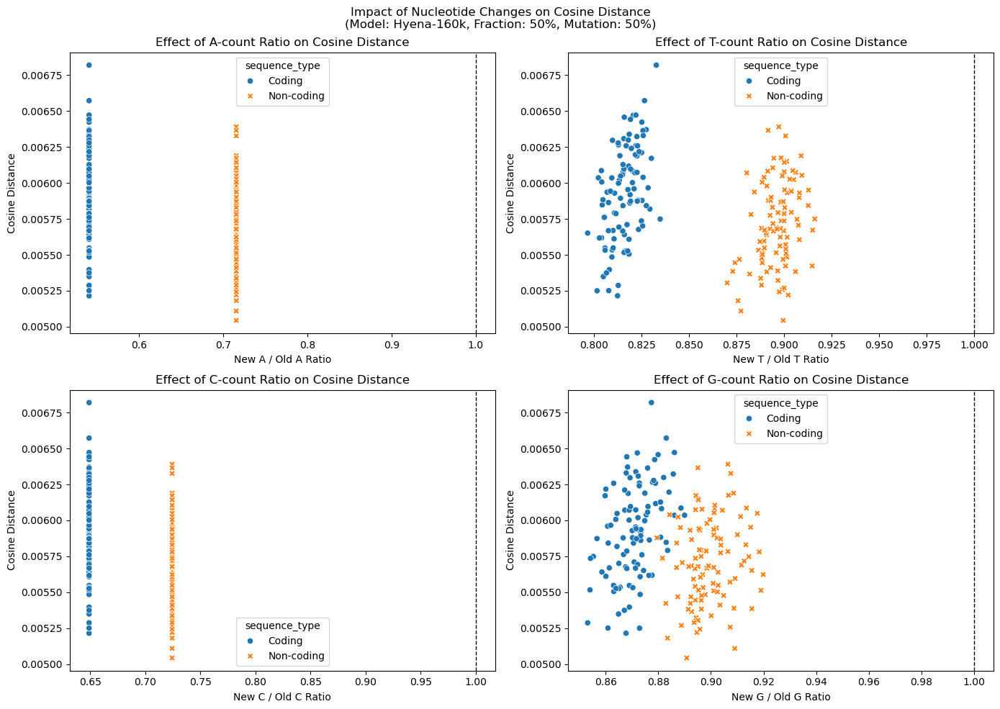

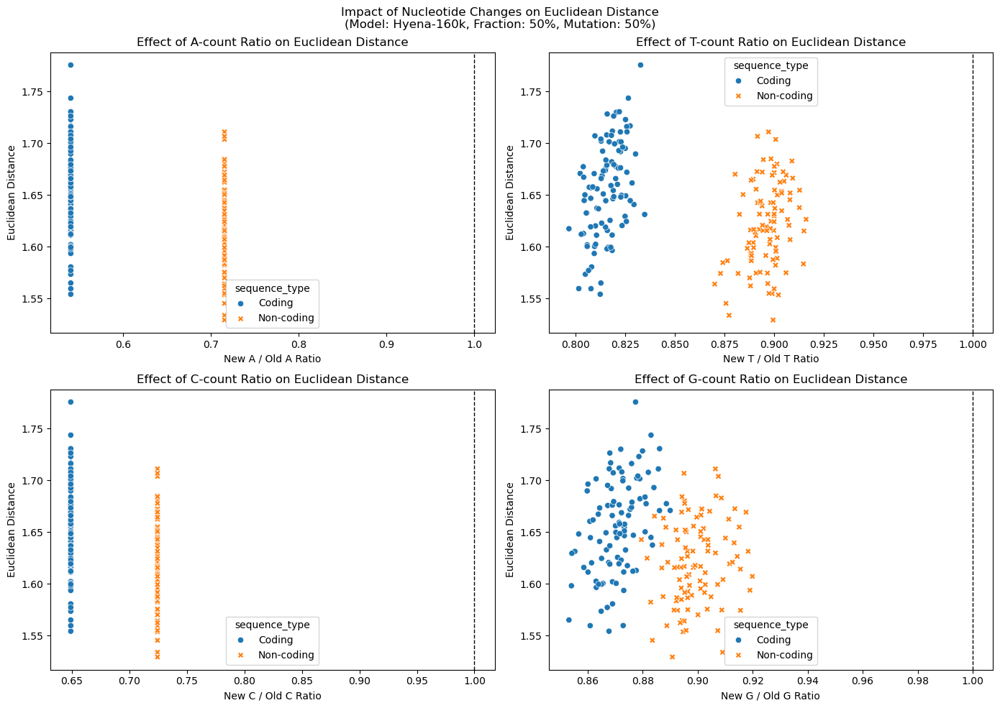


Now doing model: Hyena-450k



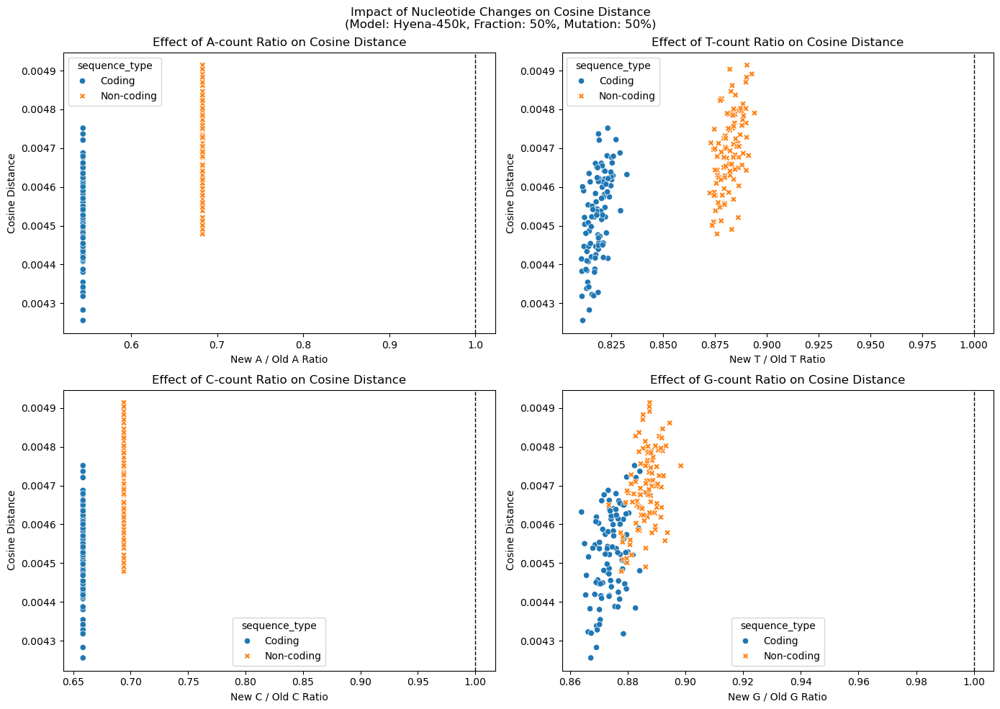

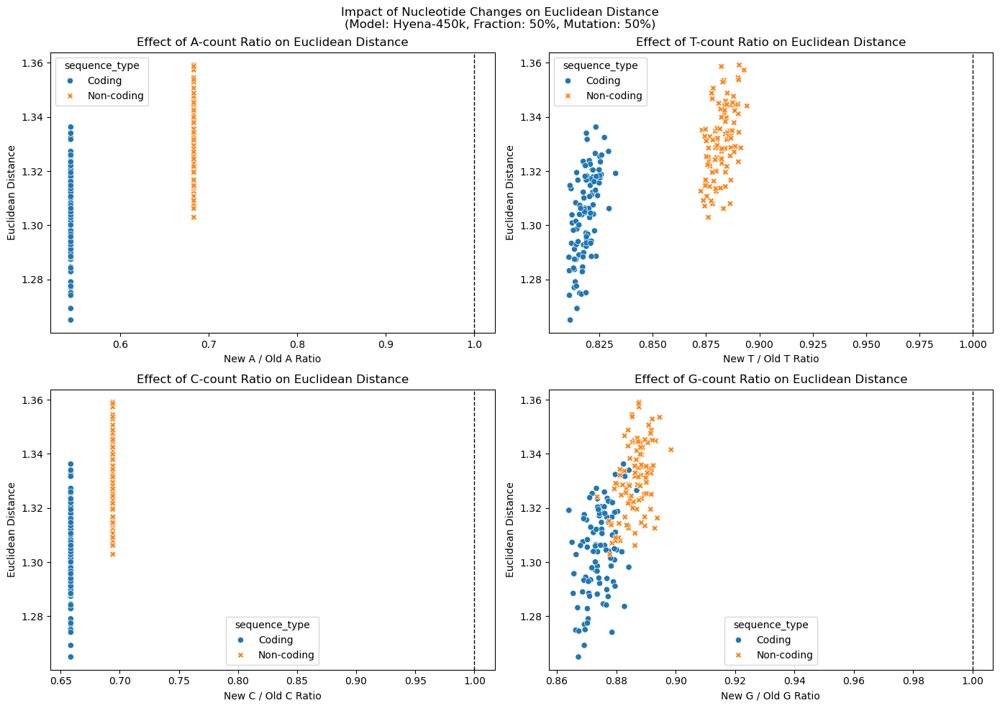


Now doing model: Hyena-1m



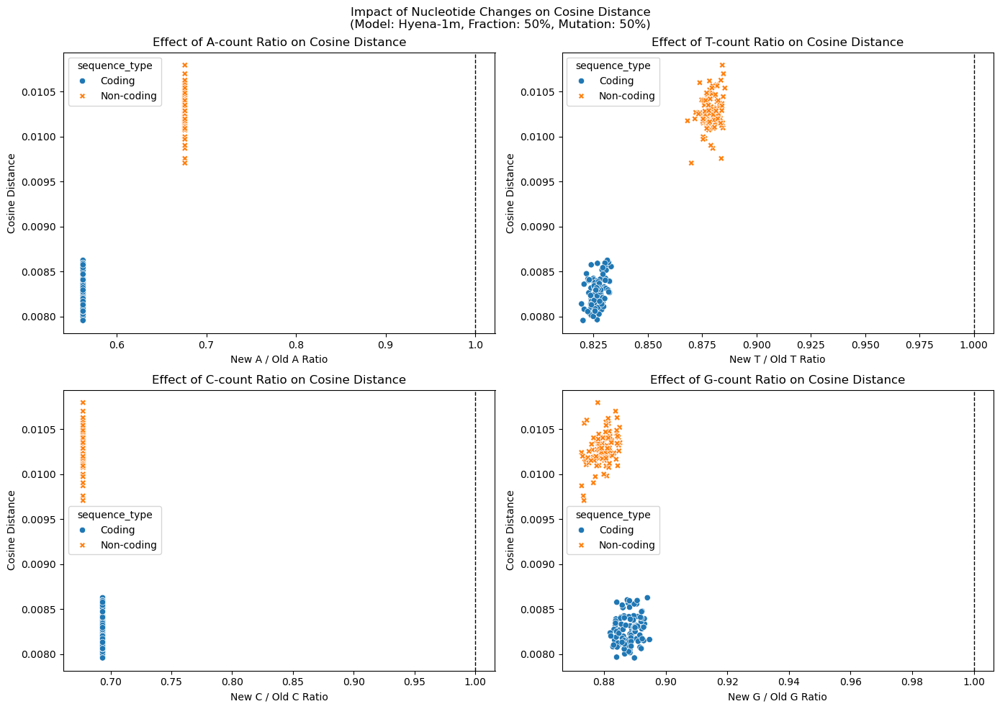

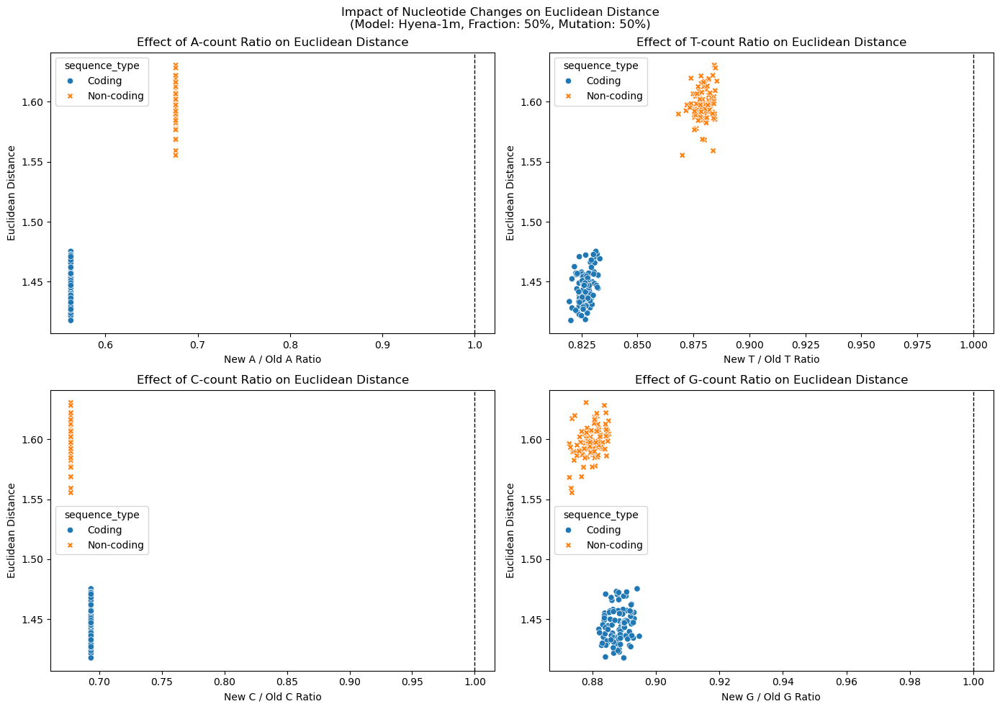

In [14]:
for model in models:
    print(f"\nNow doing model: {model}\n")
    NTspecificVariation(model, 50, 50, "Cosine")
    NTspecificVariation(model, 50, 50, "Euclidean")

# TO DO:


1. Input sequences - use human coding sequences instead? since non-coding is also 'human'; and instead of combining together smaller genes, just take segments of a larger gene.
2. Look at outliers in the hisotgrams - find their sequences and stats
3. Make a model-wise plot 
4. Annotate the plots with what sequence i.e., species' gene has been used.

Human genome sequences:
1. Exons of fixed length vs some non-coding sequence -> same input for all models
2. Usual Coding gene vs. non-coding gene

Then, do a similar analysis on something out of the training set. 1000 diff sequences - same length - from coding/non coding gene 